In [1]:
# from counterfactualEO import *
# import mlens
from collections.abc import Iterable
from itertools import product
import matplotlib as mpl
from matplotlib import pyplot as plt
import numpy as np
import os
import pandas as pd
from scipy.special import expit

from sklearn import preprocessing
from sklearn import svm
from sklearn.calibration import calibration_curve
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold, train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.utils.validation import check_is_fitted, NotFittedError

import seaborn as sns
import warnings

# Procedure

1. Generate datasets.
    1. Basis set: For training new learners.
    2. Training set: For estimating betahats. Split into:
        1. Nuisance set
        2. Target set
    3. Test set: For computing risk and unfairness properties. Split into:
        1. Nuisance set
        2. Target set
2. Basis set: train basis learners.
3. Training set:
    1. Nuisance set: Train nuisance learners.
    2. Target set: Generate matrix (or matrices) of predictions from basis learners. Generate predictions from nuisance learners. Generate ghat (estimated fairness function) for each fairness criterion.
    3. Target set: Compute betahats.
4. Test set:
    1. Nuisance set: Train nuisance learners.
    2. Target set: Generate matrix (or matrices) of predictions from basis learners. Generate predictions from nuisance learners. Generate ghat (estimated fairness function) for each fairness criterion.
    3. Compute risk and unfairness estimates, for each fairness criterion.
5. Plot results.
6. Save results and plots.


# Helper functions

In [11]:
def generate_data_pre(n, prob_A, beta_X, beta_D, beta_Y0, beta_Y1,
                      trunc_pi=0.975):
    """Generate sample data at time 0, including counterfactual outcomes.

    Here, D doesn't depend on R, since R hasn't been generated yet.
    """
    A = np.random.binomial(1, 0.3, size=(n, 1))
    X = np.random.normal(beta_X * A, size=(n, 4))
    AX = np.concatenate([A, X], axis=1)

    D_probs = expit(0.5 * np.dot(AX, beta_D)
                    ).clip(max=trunc_pi).reshape((n, 1))
    D = np.random.binomial(n=1, p=D_probs).reshape((n, 1))

    Y0_probs = expit(np.dot(AX, beta_Y0)).reshape((n, 1))
    Y0 = np.random.binomial(n=1, p=Y0_probs)
    Y1_probs = expit(np.dot(AX, beta_Y1)).reshape((n, 1))
    Y1 = np.random.binomial(n=1, p=Y1_probs)
    Y = D * Y1 + (1 - D) * Y0

    # Nuisance parameter phi
    phi = (1 - D) / (1 - D_probs) * (Y - Y0_probs) + Y0_probs

    data = np.concatenate([AX, D, Y, Y0, Y1, D_probs, Y0_probs, phi], axis=1)
    data = pd.DataFrame(data, columns=['A', 'X1', 'X2', 'X3', 'X4', 'D', 'Y',
                                       'Y0', 'Y1', 'pi', 'mu0', 'phi'])

    return data


def get_fourier(data, X, intercept=True):
    """Get tensor product of length 3 Fourier series representation of covariates."""
    cos_arr = np.array([np.cos(2*np.pi*data[xx]) for xx in X]).T
    sin_arr = np.array([np.sin(2*np.pi*data[xx]) for xx in X]).T
    inds = list(product(range(len(X)), range(len(X))))
    out = np.array([cos_arr[:, i]*sin_arr[:, j] for i, j in inds]).T
    if intercept:
        out = np.concatenate(
            [np.ones((out.shape[0], 1)), out], axis=1)
    return out


def get_closest_to_origin(cols, df):
    dist = df[cols].apply(lambda x: np.linalg.norm(x, ord=2), axis=1)
    return np.argmin(dist)

In [17]:
# Helper functions


def datafy(x):
    if x is not None:
        if isinstance(x, pd.DataFrame):
            return x.reset_index()
        else:
            return pd.DataFrame(x)
    else:
        return None


def listify(x):
    if x is not None:
        if isinstance(x, str):
            return [x]
        elif isinstance(x, Iterable):
            return list(x)
        else:
            return [x]
    else:
        return None


def square_bounds(bounds):
    """Compute bounds for squared outcome"""
    if bounds[0] < 0:
        lower = 0
    else:
        lower = np.min([x**2 for x in bounds])
    upper = np.max([x**2 for x in bounds])
    return(lower, upper)


def sherman_morrison(Ainv, u, v, lambd):
    """Compute (A + lambd * uv^T)^{-1}, for square matrix Q, scalar lambd,
    and vectors u, v, given the inverse of A."""
    u = lambd*u.reshape((len(u), 1))
    v = v.reshape((len(v), 1))
    out = Ainv - np.dot(Ainv, np.dot(np.dot(u, v.T), Ainv)) / \
        (1 + np.dot(v.T, np.dot(Ainv, u)))
    return out


####################
## Basis learners ##
####################

def predict_basis(data, learners, covariates, bounds, continuous=True):
    """Generate predictions from learners"""
    n = data.shape[0]
    v = len(learners)
    Z = np.zeros((n, v))   # matrix of predictions

    for i, learner in enumerate(learners):
        if continuous and hasattr(learner, 'predict_proba'):
            Z[:, i] = learner.predict_proba(data[covariates])[:, 1]
        else:
            Z[:, i] = learner.predict(data[covariates])

    if bounds:
        Z = np.clip(Z, *bounds)

    return Z


#######################
## Nuisance learners ##
#######################

def fit_nuis(train, covariates, decision, outcome, learner_pi=None, learner_mu=None, learner_nu=None):
    """Fit nuisance learners."""
#     train = train.reset_index()
    if learner_pi is not None:
        learner_pi.fit(train[covariates], train[decision])
    if learner_mu is not None:
        learner_mu.fit(train.loc[train[decision].eq(0), covariates],
                       train.loc[train[decision].eq(0), outcome])
    if learner_nu is not None:
        learner_nu.fit(train.loc[train[decision].eq(0), covariates],
                       train.loc[train[decision].eq(0), outcome]**2)


def predict_nuis(data, covariates, decision, outcome,
                 learner_pi=None, learner_mu=None, learner_nu=None,
                 trunc_pi=0.975, clip_mu=None, clip_nu=None):
    """Generate predictions from nuisance learners"""
    out_dict = {}
    if hasattr(learner_pi, 'predict_proba'):
        pihat = pd.Series(learner_pi.predict_proba(data[covariates])[:, 1],
                          name='pihat').clip(upper=trunc_pi)
    else:
        pihat = pd.Series(learner_pi.predict(data[covariates]),
                          name='pihat').clip(upper=trunc_pi)
    if hasattr(learner_mu, 'predict_proba'):
        muhat0 = pd.Series(learner_mu.predict_proba(data[covariates])[:, 1],
                           name='muhat0')
        if clip_mu:
            muhat0 = muhat0.clip(*clip_mu)
    else:
        muhat0 = pd.Series(learner_mu.predict(data[covariates]), name='muhat0')
        if clip_mu:
            muhat0 = muhat0.clip(*clip_mu)

    out_dict['pihat'] = pihat
    out_dict['muhat0'] = muhat0

    phihat = pd.Series(
        (1 - data[decision]) / (1 - pihat) * (data[outcome] - muhat0) + muhat0,
        name='phihat')
    out_dict['phihat'] = phihat

    if learner_nu:
        if hasattr(learner_nu, 'predict_proba'):
            nuhat0 = pd.Series(learner_nu.predict_proba(data[covariates])[:, 1],
                               name='nuhat0')
        if clip_nu:
            nuhat0 = nuhat0.clip(*clip_nu)
        else:
            nuhat0 = pd.Series(learner_nu.predict(
                data[covariates]), name='nuhat0')
            if clip_nu:
                nuhat0 = nuhat0.clip(*clip_nu)
        out_dict['nuhat0'] = nuhat0
        phibarhat = pd.Series(
            (1 - data[decision]) / (1 - pihat) *
            (data[outcome]**2 - nuhat0) + nuhat0,
            name='phibarhat')

    out = pd.DataFrame(out_dict)
#     out = pd.concat([pihat, muhat0, phihat], axis=1)

    return out


##########################
## Fairness constraints ##
##########################

def compute_ghat_independence(protected_vec):
    """Compute the influence function vector for Independence."""
    group0 = (1 - protected_vec)
    group1 = protected_vec
    ghat = group0/np.mean(group0) - group1/np.mean(group1)
    return ghat


def compute_ghat_cFPR(protected_vec, outcome_vec):
    """Compute the influence function vector for the cFPR difference."""
    group0 = (1 - outcome_vec)*(1 - protected_vec)
    group1 = (1 - outcome_vec)*protected_vec
    ghat = group0/np.mean(group0) - group1/np.mean(group1)
    return ghat


def compute_ghat_cFNR(protected_vec, outcome_vec):
    """Compute the influence function vector for the cFNR difference."""
    group0 = outcome_vec*(1 - protected_vec)
    group1 = outcome_vec*protected_vec
    ghat = group0/np.mean(group0) - group1/np.mean(group1)
    return ghat


##################################
## Estimate coefficient vectors ##
##################################

def compute_betahats_inefficient(predictions, ghats, lambdas, outcome_vec):
    """betahat = (Q0 + \sum_{j=1}^r Q1_j)^{-1}Q2, where Q0 = Pn(bb^T),
    Q1_j = \lambda Pn(b * ghat_j) Pn(b * ghat_j)^T, Q2 = Pn(b * outcome_vec)"""
    # TODO: make this efficient using Sherman-Morrison
    lambdas = listify(lambdas)
    n = predictions.shape[0]
    Q0 = np.matmul(np.transpose(predictions), predictions)/n
    bghats = [np.mean(np.matmul(np.diag(gg), predictions), axis=0)
              for gg in ghats]
    Q1s = [np.outer(bb, bb) for bb in bghats]
    Q2 = np.mean(np.matmul(np.diag(outcome_vec), predictions), axis=0)

    if len(Q1s) == 1:
        Q = [Q0 + lambd*Q1s[0] for lambd in lambdas]
    else:
        Q = [Q0 + np.tensordot(lambd, Q1s, axes=1) for lambd in lambdas]
    betahats = [np.linalg.solve(QQ, Q2) for QQ in Q]

    return betahats


def _compute_betahat(Q0_inv, bghats, Q2, lambd):
    """Compute betahat efficiently for a single lambda vector, where Q0 = Pn(bb^T),
    bghats = Pn(b * ghat_j) for each j, and Q2 = Pn(b * outcome_vec).
    """
    Q = Q0_inv
    lambd = listify(lambd)
    for i in range(len(lambd)):
        Q = sherman_morrison(Q, bghats[i], bghats[i], lambd[i])
    Q = np.matmul(Q, Q2)
    return Q


def compute_betahats(Q0_inv, predictions, ghats, lambdas, outcome_vec):
    """Use the pre-inverted inverse of Q0 = Pn(bb^T), and use the
    Sherman-Morrison update for the rest, to avoid repeated matrix inversions."""
    bghats = [np.mean(np.matmul(np.diag(gg), predictions), axis=0)
              for gg in ghats]
    Q2 = np.mean(np.matmul(np.diag(outcome_vec), predictions), axis=0)
    betahats = [_compute_betahat(
        Q0_inv, bghats, Q2, ll) for ll in lambdas]
    return betahats


###########################################
## Estimate risk and fairness properties ##
###########################################

def independence_violation(protected_vec, pred_vec, absval=True):
    """Difference in expected value of the predictor for the two groups"""
    rate0 = pred_vec[protected_vec == 0].mean()
    rate1 = pred_vec[protected_vec == 1].mean()
    if absval:
        diff = np.abs(rate0 - rate1)
    else:
        diff = rate0 - rate1
    return diff


def deltahatplus(protected_vec, outcome_vec, pred_vec, absval=True):
    """Difference in generalized cFPRs for the two groups"""
    ghat = compute_ghat_cFPR(protected_vec, outcome_vec)
    diff = np.dot(ghat, pred_vec)/len(pred_vec)
    if absval:
        diff = np.abs(diff)

    return diff


def deltahatminus(protected_vec, outcome_vec, pred_vec, absval=True):
    """Difference in generalized cFNRs for the two groups"""
    ghat = compute_ghat_cFNR(protected_vec, outcome_vec)
    diff = np.dot(ghat, pred_vec)/len(pred_vec)
    if absval:
        diff = np.abs(diff)

    return diff


def get_active(df):
    """Return column that gives active fairness penalties."""
    actives = pd.DataFrame({'ind': df.lambda_independence.apply(lambda x: "ind" if x > 0 else None),
                            'cFPR': df.lambda_cFPR.apply(lambda x: "cFPR" if x > 0 else None),
                            'cFNR': df.lambda_cFNR.apply(lambda x: "cFNR" if x > 0 else None)})
    out = actives.apply(lambda x: '_'.join(
        [el for el in x if el is not None]), axis=1)
    return out


def eval_model(data, protected, phihat, phibarhat, base_predictions, betahats,
               unfairness='all', clip=None, lambdas=None, lambda_cols=None,
               err='all', absval=True):

    out_dict = {}

    # Predictions
    predlist = [np.matmul(base_predictions, bb) for bb in betahats]
    if clip is not None:
        predlist = [np.clip(preds, *clip) for preds in predlist]

    # Prediction variance
    learner_variance = [np.var(preds) for preds in predlist]
    out_dict['learner_variance'] = learner_variance

    # Error metrics
    if err == 'all':
        err = ['mse', 'bernoulli_01', 'threshold_01', 'auc', 'logistic']
    if 'mse' in err:
        error = [np.mean(preds**2 - 2*preds*data[phihat] + data[phibarhat])
                 for preds in predlist]
        out_dict['error_mse'] = error
    if 'bernoulli_01' in err:
        error = [np.mean(preds*(1 - data[phihat]) + (1 - preds)*data[phihat])
                 for preds in predlist]
        out_dict['error_bernoulli_01'] = error
    if 'auc' in err:
        try:
            error = [roc_auc_score(data[phihat], preds) for preds in predlist]
        except ValueError:
            error = np.nan
        out_dict['error_auc'] = error
    if 'logistic' in err:  # Using the same logistic loss as in Amanda and Ahesh's paper
        error = [np.mean(np.log(1 + np.exp(-5*(2*data[phihat] - 1) *
                                           (2*preds - 1)))/np.log(1 + np.exp(5))) for preds in predlist]
        out_dict['error_logistic'] = error

    # Unfairness metrics
    if unfairness == 'all':
        unfairness = ['independence', 'cFPR', 'cFNR', 'independence_binary',
                      'cFPR_binary', 'cFNR_binary']
    if 'independence' in unfairness:
        rate_diff = [independence_violation(
            data[protected], preds, absval) for preds in predlist]
        out_dict['rate_diff'] = rate_diff
    if 'cFPR' in unfairness:
        cFPR_diff = [deltahatplus(data[protected], data[phihat], preds, absval)
                     for preds in predlist]
        out_dict['cFPR_diff'] = cFPR_diff
    if 'cFNR' in unfairness:
        cFNR_diff = [deltahatminus(
            data[protected], data[phihat], preds, absval) for preds in predlist]
        out_dict['cFNR_diff'] = cFNR_diff

#     if 'independence_binary' in unfairness:
#         rate_diff = [independence_violation(
#             data[protected], preds, absval) for preds in predlist_binary]
#         out_dict['rate_diff_binary'] = rate_diff
#     if 'cFPR_binary' in unfairness:
#         cFPR_diff = [deltahatplus(data[protected], data[phihat], preds, absval)
#                      for preds in predlist_binary]
#         out_dict['cFPR_diff_binary'] = cFPR_diff
#     if 'cFNR_binary' in unfairness:
#         cFNR_diff = [deltahatminus(
#             data[protected], data[phihat], preds, absval) for preds in predlist_binary]
#         out_dict['cFNR_diff_binary'] = cFNR_diff

#     if 'threshold_01' in err:
#         for i, threshold in enumerate(np.linspace(0.1, 0.9, 9)):
#             predlist_binary = [np.where(preds >= threshold, 1, 0) for preds in predlist]
#             error = [np.mean(preds*(1 - data[phihat]) + (1 - preds)*data[phihat])
#                      for preds in predlist_binary]
#             out_dict['error_threshold_' + str(i + 1)] = error
#             rate_diff = [independence_violation(
#             data[protected], preds, absval) for preds in predlist_binary]
#             out_dict['rate_diff_binary_' + str(i + 1)] = rate_diff
#             cFPR_diff = [deltahatplus(data[protected], data[phihat], preds, absval)
#                      for preds in predlist_binary]
#             out_dict['cFPR_diff_binary_' + str(i + 1)] = cFPR_diff
#             cFNR_diff = [deltahatminus(
#             data[protected], data[phihat], preds, absval) for preds in predlist_binary]
#             out_dict['cFNR_diff_binary_' + str(i + 1)] = cFNR_diff

    out = pd.DataFrame(out_dict)
    if lambdas is not None:
        if lambda_cols is not None:
            columns = ["lambda_" + cc for cc in lambda_cols]
        elif isinstance(lambdas[0], Iterable):
            columns = ["lambda{}".format(i)
                       for i in range(1, 1 + len(lambdas[0]))]
        else:
            columns = ['lambda1']
        lambd_df = pd.DataFrame(lambdas, columns=columns)
        out = pd.concat([out, lambd_df], axis=1)
        out = out.assign(active_penalties=get_active(out))

    return out

##############
## Plotting ##
##############


def plot_one_constraint(results, fairness=['rate_diff', 'cFPR_diff', 'cFNR_diff'],
                        error='error_mse', palette='deep'):
    colors = sns.color_palette(palette)
    constraints = ['independence', 'cFPR', 'cFNR']
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    cols = ['lambda_' + cc for cc in constraints]
    to_replace = {col: 0 for col in cols}
    for i, ax in enumerate(axes):
        curr_constraint = constraints[i]
        curr_col = 'lambda_' + curr_constraint
        other_cols = ['lambda_' +
                      cc for cc in constraints if cc != curr_constraint]
        res = results.loc[results[other_cols[0]].eq(
            0) & results[other_cols[1]].eq(0)]
        res = res.replace(to_replace, 0.0001).reset_index().drop(
            columns='index')
        ax.plot(res[curr_col], res[error], color=colors[0], linestyle=':', linewidth=2, alpha=0.5)
        constraint_dict = {
            'independence': 'rate_diff',
            'cFPR': 'cFPR_diff',
            'cFNR': 'cFNR_diff'
        }
        for j, ff in enumerate(fairness):
            if ff == constraint_dict[curr_constraint]:
                ax.plot(res[curr_col], res[ff], color=colors[j + 1], linewidth=2)
            else:
                ax.plot(res[curr_col], res[ff], color=colors[j + 1], linestyle=':', linewidth=2, alpha=0.5)

#         # Vertical line for best lambda
#         ax.vlines(res.loc[np.argmin(res[fairness[i]]), curr_col], *ax.get_ylim(),
#                   color=colors[i + 1], linestyle='--')
        res = res.rename(columns={'error_mse': 'MSE', 'rate_diff': 'rate-diff',
                                 'cFPR_diff': 'FPR-diff', 'cFNR_diff': 'FNR-diff'})
        res = res.drop(other_cols, axis=1)
#         res = res[[curr_col] + [error] + fairness].melt([curr_col])
        res = res[[curr_col] + ['MSE', 'rate-diff', 'FPR-diff', 'FNR-diff']].melt([curr_col])
        ymax = np.max(res['value'])
        if i == 0:
            sns.scatterplot(x=curr_col, y='value', hue='variable', ci=None, data=res, ax=ax,
                            palette=palette, legend=False)
            ax.set_title('rate-diff penalty')
        elif i == 1:
            sns.scatterplot(x=curr_col, y='value', hue='variable', ci=None, data=res, ax=ax,
                            palette=palette, legend=False)
            ax.get_yaxis().set_visible(False)
            ax.set_title('FPR-diff penalty')
        elif i == 2:
            s = sns.scatterplot(x=curr_col, y='value', hue='variable', ci=None, data=res, ax=ax,
                            palette=palette)
#             s.legend(['MSE', 'rate-diff', 'FPR-diff', 'FNR-diff'])
            ax.set_title('FNR-diff penalty')
            ax.get_yaxis().set_visible(False)
            plt.legend(bbox_to_anchor=(1.01, 1))
        ax.set(xscale='log')
        ax.set_ylim((0, ymax*1.1))
        ax.set_xlabel(r'$\lambda$')
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.tight_layout()
        
    return fig, axes


def plot_two_criteria(results, learner_results, c1, c2, hue=None,
                      pretrained_results=None, fig=None, ax=None):
    if fig is None:
        fig, ax = plt.subplots(1, figsize=(9, 9))
    base_model = results.iloc[0]
    ax.plot(learner_results[c1], learner_results[c2],
            marker='x', color='black', linestyle='None', markersize=16)
    ax.plot(base_model[c1], base_model[c2], color='red', marker='s',
            markersize=16)
    if pretrained_results is not None:
        ax.plot(pretrained_results[c1], pretrained_results[c2],
                marker='^', color='black', linestyle='None', fillstyle='none', markersize=16)
    sns.scatterplot(x=c1, y=c2, hue=hue, data=results, ax=ax, s=100,
                    alpha=0.75)
#     lim_min = min(ax.get_xlim()[0], ax.get_ylim()[0])
#     lim_max = max(ax.get_xlim()[1], ax.get_ylim()[1])
#     ax.set_xlim(lim_min, lim_max)
#     ax.set_ylim(lim_min, lim_max)
    for radius in np.linspace(0, 1, 21):
        circle = plt.Circle(
            (0, 0), radius, edgecolor='grey', fill=False, linestyle='--')
        ax.add_artist(circle)

#     ax.set_aspect('equal')

    return fig, ax


def plot_all_pairwise(results, learner_results):
    fig, axes = plt.subplots(3, 2, figsize=(10, 15))
    plot_two_criteria(results, learner_results, 'error',
                      'rate_diff', fig, axes[0, 0])
    plot_two_criteria(results, learner_results, 'error',
                      'cFPR_diff', fig, axes[0, 1])
    plot_two_criteria(results, learner_results, 'error',
                      'cFNR_diff', fig, axes[1, 0])
    plot_two_criteria(results, learner_results, 'rate_diff',
                      'cFPR_diff', fig, axes[1, 1])
    plot_two_criteria(results, learner_results, 'rate_diff',
                      'cFNR_diff', fig, axes[2, 0])
    plot_two_criteria(results, learner_results, 'cFPR_diff',
                      'cFNR_diff', fig, axes[2, 1])
#     for row in axes:
#         for ax in row:
#             ax.axis('equal')
    return fig, axes

# FairPredictor class

In [14]:
class FairPredictor:

    def __init__(self, data_basis=None,
                 data_train_nuis=None, data_train_target=None,
                 data_test_nuis=None, data_test_target=None,
                 covariates=None, protected=None, decision=None,
                 outcome=None, predictors=None, outcome_bounds=None,
                 learners_basis=None,
                 learner_pi_train=None, learner_mu_train=None, learner_nu_train=None,
                 learner_pi_test=None, learner_mu_test=None, learner_nu_test=None):

        # Datasets
        self.data_basis = datafy(data_basis)
        self.data_train_nuis = datafy(data_train_nuis)
        self.data_train_target = datafy(data_train_target)
        self.data_test_nuis = datafy(data_test_nuis)
        self.data_test_target = datafy(data_test_target)

        # Strings representing different parts of the data
        self.covariates = listify(covariates)
        self.protected = protected             # sensitive feature
        self.predictors = listify(predictors)  # previously existing predictors
        self.decision = decision
        self.outcome = outcome
        
        if self.covariates and self.protected:
            self.all_covariates = self.covariates + \
                [self.protected]  # combination
        else:
            self.all_covariates = None
        if self.all_covariates and self.predictors:
            self.all_covariates = self.all_covariates + self.predictors



        # Bounds on the outcome, a tuple or list
        self.outcome_bounds = outcome_bounds

        # Learners
        self.learners_basis = learners_basis
        self.learner_pi_train = learner_pi_train
        self.learner_mu_train = learner_mu_train
        self.learner_nu_train = learner_nu_train
        self.learner_pi_test = learner_pi_test
        self.learner_mu_test = learner_mu_test
        self.learner_nu_test = learner_nu_test

        # Results
        self.results = {}

        # Basis predictions
        self.basis_preds_train = None
        # Pn(bb^T)^{-1}, used in closed-form solution for betahat
        self.Q0_inv = None
        self.basis_preds_test = None

        # Nuisance predictions
        self.nuis_preds_train = None
        self.nuis_preds_test = None

        # Fairness constraints
        self.ghat_independence_train = None
        self.ghat_independence_test = None
        self.ghat_cFPR_train = None
        self.ghat_cFPR_test = None
        self.ghat_cFNR_train = None
        self.ghat_cFNR_test = None

    ####################
    ## Basis learners ##
    ####################

    def fit_basis_learners(self, counterfactual=False, recompute=False):
        """Fit the basis learners."""
        if counterfactual:
            data = self.data_basis.loc[self.data_basis[self.decision].eq(0), :]
        else:
            data = self.data_basis
        for i, learner in enumerate(self.learners_basis):
            if recompute:
                learner.fit(data[self.all_covariates], data[self.outcome])
            else:
                try:
                    check_is_fitted(learner)
                    warnings.warn("Basis learners have already been fit. \
                    Set recompute=True to recompute them.")
                except NotFittedError:
                    learner.fit(data[self.all_covariates], data[self.outcome])

    def predict_basis_train(self, continuous=True, recompute=False):
        """Generate basis predictions on training data."""
        if recompute or (self.basis_preds_train is None):
            preds = predict_basis(self.data_train_target, self.learners_basis,
                                  self.all_covariates, self.outcome_bounds,
                                  continuous)
            if self.predictors is not None:
                preds = np.concatenate(
                    [preds, self.data_train_target[self.predictors]], axis=1)
            self.basis_preds_train = preds

            Q0 = np.matmul(np.transpose(preds), preds)/len(preds)
            self.Q0_inv = np.linalg.inv(Q0)
        else:
            warnings.warn("Basis predictions on the training data have already \
            been generated. Set recompute=True to regenerate them.")

    def predict_basis_test(self, continuous=True, recompute=False):
        """Generate basis predictions on test data."""
        if recompute or (self.basis_preds_test is None):
            preds = predict_basis(self.data_test_target, self.learners_basis,
                                  self.all_covariates, self.outcome_bounds,
                                  continuous)
            if self.predictors is not None:
                preds = np.concatenate(
                    [preds, self.data_test_target[self.predictors]], axis=1)
            self.basis_preds_test = preds
        else:
            warnings.warn("Basis predictions on the test data have already \
            been generated. Set recompute=True to regenerate them.")

    #######################
    ## Nuisance learners ##
    #######################

    def fit_nuis_train(self, recompute=False):
        """Fit nuisance learners on the training data."""
        if self.learner_pi_train is not None:
            if recompute:
                fit_nuis(self.data_train_nuis,
                         self.all_covariates, self.decision, self.outcome,
                         self.learner_pi_train, self.learner_mu_train, self.learner_nu_train)
            else:
                try:
                    check_is_fitted(self.learner_pi_train)
                    warnings.warn(
                        "Training data nuisance learners have already been fit. Set recompute=True to recompute them.")
                except NotFittedError:
                    fit_nuis(self.data_train_nuis,
                             self.all_covariates, self.decision, self.outcome,
                             self.learner_pi_train, self.learner_mu_train, self.learner_nu_train)

    def fit_nuis_test(self, recompute=False):
        """Fit nuisance learners on the test data."""
        if self.learner_pi_test is not None:
            if recompute:
                fit_nuis(self.data_test_nuis,
                         self.all_covariates, self.decision, self.outcome,
                         self.learner_pi_test, self.learner_mu_test, self.learner_nu_test)
            else:
                try:
                    check_is_fitted(self.learner_pi_test)
                    warnings.warn(
                        "Test data nuisance learners have already been fit. Set recompute=True to recompute them.")
                except NotFittedError:
                    fit_nuis(self.data_test_nuis,
                             self.all_covariates, self.decision, self.outcome,
                             self.learner_pi_test, self.learner_mu_test, self.learner_nu_test)

    def predict_nuis_train(self, recompute=False, trunc_pi=0.975):
        """Generate nuisance learner predictions on training data."""
        if self.learner_pi_train is not None:
            if recompute or (self.nuis_preds_train is None):
                preds = predict_nuis(self.data_train_target, self.all_covariates,
                                     self.decision, self.outcome, self.learner_pi_train,
                                     self.learner_mu_train, self.learner_nu_train, trunc_pi,
                                     clip_mu=self.outcome_bounds, clip_nu=square_bounds(self.outcome_bounds))
                self.nuis_preds_train = preds
            else:
                warnings.warn(
                    "Nuisance predictions on the training data have already been generated. Set recompute=True to regenerate them.")

    def predict_nuis_test(self, recompute=False, trunc_pi=0.975):
        """Generate nuisance learner predictions on test data."""
        if self.learner_pi_test is not None:
            if recompute or (self.nuis_preds_test is None):
                preds = predict_nuis(self.data_test_target, self.all_covariates,
                                     self.decision, self.outcome, self.learner_pi_test,
                                     self.learner_mu_test, self.learner_nu_test, trunc_pi,
                                     clip_mu=self.outcome_bounds, clip_nu=square_bounds(self.outcome_bounds))
                self.nuis_preds_test = preds
            else:
                warnings.warn(
                    "Nuisance predictions on the test data have already been generated. Set recompute=True to regenerate them.")

    ##########################
    ## Fairness constraints ##
    ##########################

    def compute_ghat_independence_train(self, recompute=False):
        """Compute the influence function vector for Independence for the training data."""
        if recompute or (self.ghat_independence_train is None):
            ghat = compute_ghat_independence(
                self.data_train_target[self.protected])
            self.ghat_independence_train = ghat
        else:
            warnings.warn(
                "ghat_independence has already been computed on the training data. Set recompute=True to recompute it.")

    def compute_ghat_independence_test(self, recompute=False):
        """Compute the influence function vector for Independence for the training data."""
        if recompute or (self.ghat_independence_test is None):
            ghat = compute_ghat_independence(
                self.data_test_target[self.protected])
            self.ghat_independence_test = ghat
        else:
            warnings.warn(
                "ghat_independence has already been computed on the test data. Set recompute=True to recompute it.")

    def compute_ghat_cFPR_train(self, outcome='phihat', recompute=False):
        """Compute the influence function vector for the cFPR difference for the training data.
        Concatenating the training data and training nuisance predictions because
        the outcome may be in one or the other. With simulated data, for example,
        the outcome mu0 is known and is in the data, not the nuisance predictions.
        """
        if recompute or (self.ghat_cFPR_train is None):
            data = pd.concat(
                [self.data_train_target, self.nuis_preds_train], axis=1)
            ghat = compute_ghat_cFPR(data[self.protected], data[outcome])
            self.ghat_cFPR_train = ghat
        else:
            warnings.warn(
                "ghat_cFPR has already been computed on the training data. Set recompute=True to recompute it.")

    def compute_ghat_cFPR_test(self, outcome='phihat', recompute=False):
        """Compute the influence function vector for the cFPR difference for the training data.
        Concatenating the training data and training nuisance predictions because
        the outcome may be in one or the other. With simulated data, for example,
        the outcome mu0 is known and is in the data, not the nuisance predictions.
        """
        if recompute or (self.ghat_cFPR_test is None):
            data = pd.concat(
                [self.data_test_target, self.nuis_preds_test], axis=1)
            ghat = compute_ghat_cFPR(data[self.protected], data[outcome])
            self.ghat_cFPR_test = ghat
        else:
            warnings.warn(
                "ghat_cFPR has already been computed on the test data. Set recompute=True to recompute it.")

    def compute_ghat_cFNR_train(self, outcome='phihat', recompute=False):
        """Compute the influence function vector for the cFPR difference for the training data.
        Concatenating the training data and training nuisance predictions because
        the outcome may be in one or the other. With simulated data, for example,
        the outcome mu0 is known and is in the data, not the nuisance predictions.
        """
        if recompute or (self.ghat_cFNR_train is None):
            data = pd.concat(
                [self.data_train_target, self.nuis_preds_train], axis=1)
            ghat = compute_ghat_cFNR(data[self.protected], data[outcome])
            self.ghat_cFNR_train = ghat
        else:
            warnings.warn(
                "ghat_cFNR has already been computed on the training data. Set recompute=True to recompute it.")

    def compute_ghat_cFNR_test(self, outcome='phihat', recompute=False):
        """Compute the influence function vector for the cFPR difference for the training data.
        Concatenating the training data and training nuisance predictions because
        the outcome may be in one or the other. With simulated data, for example,
        the outcome mu0 is known and is in the data, not the nuisance predictions.
        """
        if recompute or (self.ghat_cFNR_test is None):
            data = pd.concat(
                [self.data_test_target, self.nuis_preds_test], axis=1)
            ghat = compute_ghat_cFNR(data[self.protected], data[outcome])
            self.ghat_cFNR_test = ghat
        else:
            warnings.warn(
                "ghat_cFNR has already been computed on the test data. Set recompute=True to recompute it.")

    ##################################
    ## Estimate coefficient vectors ##
    ##################################

#     def compute_betahats_inefficient(self, constraints, lambdas, outcome='phihat'):
#         constraints = listify(constraints)
#         ghats = [getattr(self, "ghat_" + cc + "_train") for cc in constraints]
#         data = pd.concat(
#             [self.data_train_target, self.nuis_preds_train], axis=1)
#         betahats = compute_betahats_inefficient(self.basis_preds_train, ghats, lambdas,
#                                     data[outcome])
#         return betahats

    def compute_betahats(self, constraints, lambdas, lambda_smooth=None,
                         penalty_matrix=None, outcome='phihat', loss='mse'):
        constraints = listify(constraints)
        ghats = [getattr(self, "ghat_" + cc + "_train") for cc in constraints]
        data = pd.concat(
            [self.data_train_target, self.nuis_preds_train], axis=1)
        if loss == 'mse':
            betahats = compute_betahats(self.Q0_inv, self.basis_preds_train, ghats, lambdas,
                                        data[outcome])
        elif loss == '0-1':
            inv = np.linalg.inv(lambda_smooth*penalty_matrix)
            betahats = compute_betahats(inv, self.basis_preds_train, ghats, lambdas,
                                        data[outcome])
        else:
            warnings.warn("loss must be one of 'mse' or '0-1'.")
        return betahats

    ###########################################
    ## Estimate risk and fairness properties ##
    ###########################################

    def eval_base_learners(self, phihat, phibarhat, err='all', unfairness='all', absval=True):
        """Evaluate risk and fairness of basis functions."""
        data = pd.concat([self.data_test_target, self.nuis_preds_test], axis=1)
        betahats = np.identity(self.basis_preds_test.shape[1])
        out = eval_model(data, self.protected, phihat, phibarhat, self.basis_preds_test,
                         betahats, unfairness, self.outcome_bounds, None, None, err, absval)
        num_learners = self.basis_preds_test.shape[1]
        if self.predictors is not None:
            num_learners = num_learners - len(self.predictors)
        index = ['learner' + str(i) for i in range(num_learners)]
        if self.predictors is not None:
            index = index + self.predictors
        out.index = index
        self.results['base_learners'] = out

    def eval_model(self, phihat, phibarhat, betahats, unfairness, lambdas=None,
                   lambda_cols=None, err='all', absval=True):
        data = pd.concat([self.data_test_target, self.nuis_preds_test], axis=1)
        out = eval_model(data, self.protected, phihat, phibarhat, self.basis_preds_test,
                         betahats, unfairness, self.outcome_bounds, lambdas, lambda_cols, err, absval)
        return out

    ##############################
    ## Full simulation workflow ##
    ##############################

    def simulate_fairness(self, lambdas, loss, lambda_smooth=None, constraints='all',
                          phihat_train='phihat', phibarhat_train='phibarhat',
                          phihat_test='phihat', phibarhat_test='phibarhat',
                          counterfactual=False, continuous=True, absval=True, recompute=False, verbose=True):
        # Basis learners, if not externally set
        if self.learners_basis is not None:
            if verbose:
                print("BASIS LEARNERS\n...fitting basis learners...")
            self.fit_basis_learners(counterfactual, recompute)
            if verbose:
                print("...generating predictions from basis learners...")
            self.predict_basis_train(
                continuous=continuous, recompute=recompute)
            self.predict_basis_test(continuous=continuous, recompute=recompute)

        # Nuisance learners, if used
        if verbose:
            print(
                "\nNUISANCE LEARNERS\n...fitting training set nuisance learners...")
        self.fit_nuis_train(recompute)
        if verbose:
            print("...generating training set predictions from nuisance learners...")
        self.predict_nuis_train(recompute)

        if verbose:
            print("...fitting test set nuisance learners...")
        self.fit_nuis_test(recompute)
        if verbose:
            print("...generating test set predictions from nuisance learners...")
        self.predict_nuis_test(recompute)

        # Evaluate base learners
        if self.basis_preds_test is not None:
            if verbose:
                print("\nBASIS LEARNERS\n...evaluating basis learners...")
            self.eval_base_learners(
                phihat_test, phibarhat_test, 'all', 'all', absval)

        # Fairness constraints
        if verbose:
            print("\nFAIRNESS CONSTRAINTS\n...computing fairness constraint vectors...")
        if constraints == 'all':
            constraints = [('independence', 'cFPR', 'cFNR')]
        else:
            constraints = listify(constraints)

        self.compute_ghat_independence_train(recompute)
        self.compute_ghat_independence_test(recompute)
        self.compute_ghat_cFPR_train(phihat_train, recompute)
        self.compute_ghat_cFPR_test(phihat_test, recompute)
        self.compute_ghat_cFNR_train(phihat_train, recompute)
        self.compute_ghat_cFNR_test(phihat_test, recompute)

        # Compute betahats and estimate risk and fairness properties
        if verbose:
            print("\nBETAHATS")
        for cc in constraints:
            if isinstance(cc, list) or isinstance(cc, tuple):
                if len(cc) > 1:
                    lambda_list = [lambdas for i in range(len(cc))]
                    lambdas = np.array(np.meshgrid(*lambda_list)
                                       ).T.reshape(-1, len(cc))
                    key = tuple(cc)  # for saving results
                else:
                    cc = cc[0]
            key = cc
            if recompute or (key not in self.results):
                if verbose:
                    print("...computing betahat for {}...".format(cc))
                if loss == 'mse':
                    betahats = self.compute_betahats(
                        cc, lambdas, outcome=phihat_train, loss='mse')
                elif loss == '0-1':
                    penalty_matrix = np.identity(
                        self.basis_preds_test.shape[1])
                    betahats = self.compute_betahats(cc, lambdas, lambda_smooth, penalty_matrix,
                                                     outcome=phihat_train, loss='0-1')
                if verbose:
                    print("...computing risk and fairness properties of betahats...")
                performance = self.eval_model(
                    phihat_test, phibarhat_test, betahats, 'all', lambdas,
                    ['independence', 'cFPR', 'cFNR'], 'all')
                self.results[cc] = {
                    'betahats': betahats, 'performance': performance}
            else:
                warnings.warn(
                    "betahats have already been computed. Set recompute=True to recompute them.")

    #######################
    ## Filtering results ##
    #######################

    def filter_results(self, fairness):
        constraints = ('independence', 'cFPR', 'cFNR')
        other_cols = ['lambda_' + cc for cc in constraints if cc != fairness]
        res = self.results[constraints]['performance']
        res = res.loc[res[other_cols[0]].eq(0) & res[other_cols[1]].eq(0)]
        res = res.drop(other_cols, axis=1)
        return res

    ######################
    ## Plotting results ##
    ######################

    def plot_one_constraint(self, fairness, error):
        fig, axes = plot_one_constraint(
            self.results[('independence', 'cFPR', 'cFNR')]['performance'],
            fairness, error)
        return fig, axes

    def plot_two_criteria(self, c1, c2, hue=None):
        num_learners = self.basis_preds_test.shape[1]
        if self.predictors is not None:
            num_learners = num_learners - len(self.predictors)
        fig, ax = plot_two_criteria(self.results[('independence', 'cFPR', 'cFNR')]['performance'],
                                    self.results['base_learners'].iloc[range(
                                        num_learners)],
                                    c1, c2, hue,
                                    self.results['base_learners'].iloc[num_learners:])
        if c1 == 'error_mse':
            ax.set_xlabel('MSE')
        elif c1 == 'rate_diff':
            ax.set_xlabel('rate-diff')
        elif c1 == 'cFPR_diff':
            ax.set_xlabel('FPR-diff')
        elif c1 == 'cFNR_diff':
            ax.set_xlabel('FNR-dff')
        
        if c2 == 'error_MSE':
            ax.set_ylabel('MSE')
        elif c2 == 'rate_diff':
            ax.set_ylabel('rate-diff')
        elif c2 == 'cFPR_diff':
            ax.set_ylabel('FPR-diff')
        elif c2 == 'cFNR_diff':
            ax.set_ylabel('FNR-dff')        
#         fig, ax = plot_two_criteria(self.results[('independence', 'cFPR', 'cFNR')]['performance'],
#                                     self.results['base_learners'].iloc[range(
#                                         self.basis_preds_test.shape[1])],
#                                     c1, c2, hue,
#                                     self.results['base_learners'].iloc[self.basis_preds_test.shape[1]:])
        return fig, ax

# Simulated data

## Setup

In [4]:
prob_A = 0.3
beta_X = [1, -0.8, 4, 2]
beta_D_pre = [0.2, -1, 1, -1, 1]
beta_D_post = [0.2, -1, 1, -1, 1, 1]
beta_Y0 = [-5, 2, -3, 4, -5]
beta_Y1 = [1, -2, 3, -4, 5]

A = 'A'
X = ['X1', 'X2', 'X3', 'X4']
D = 'D'
Y = 'Y'

nuis_preds = [A] + [XX for XX in X]

## Check differences between the two groups 

In [5]:
data_dist = generate_data_pre(50000, prob_A, beta_X, beta_D_pre, beta_Y0, beta_Y1,
                              trunc_pi=0.975)

In [286]:
# Differences in distributions of decisions and outcomes

dist_out = data_dist.groupby('A')[['D', 'Y0', 'Y']].mean().reset_index()
with open('leastsquares/simulations/outcome_dist.tex', 'w') as file_out:
    file_out.write(dist_out.to_latex(index=False, float_format='%0.2f'))

dist_out

,A,D,Y0,Y
0,0.0,0.499943,0.497079,0.665273
1,1.0,0.180618,0.758689,0.714049


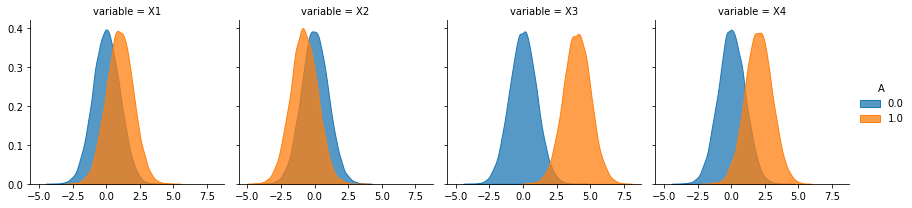

In [7]:
# Differences in distributions of covariates

data_dist_long = data_dist[['A'] + X].melt(['A'])

# g = sns.FacetGrid(data = data_dist_long, col = 'variable', hue='A')
# g.map_dataframe(sns.histplot, x='value', stat='probability', common_norm=False)
# g.add_legend()

# sns.set(font_scale=1.5)
# sns.set_theme(style='white', font_scale=1.5)
# g = sns.displot(data_dist_long, col='variable', x='value', hue='A', bins=100,
#            stat='probability', common_norm=False, alpha=0.7, palette='colorblind')

g = sns.FacetGrid(data=data_dist_long, col='variable', hue='A')
g.map_dataframe(sns.kdeplot, x='value', fill=True, alpha=0.75)
g.add_legend()

g.savefig('leastsquares/simulations/covariate_distribution.pdf')

In [290]:
# Fairness properties of the best predictor, mu0(X, A) = E[Y0|X, A]
n_dist = data_dist.shape[0]

bayes_performance = eval_model(data_dist, A, 'Y0', 'Y0',
                               base_predictions=data_dist['mu0'].values.reshape(
                                   (n_dist, 1)),
                               betahats=[[1]], clip=(0, 1))

with open('leastsquares/simulations/bayes_performance.tex', 'w') as file_out:
    file_out.write(bayes_performance[['error_mse', 'error_auc', 'rate_diff', 'cFPR_diff', 'cFNR_diff']].to_latex(index=False, float_format='%0.2f'))

In [291]:
bayes_performance

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
0,0.195021,0.049706,0.098933,0.983774,0.038597,0.262496,0.072095,0.050749


In [292]:
# Fairness properties of the mean-Y0 predictor
mean_prediction = np.repeat(data_dist.Y0.mean(), n_dist).reshape((n_dist, 1))
eval_model(data_dist, A, 'Y0', 'Y0', base_predictions = mean_prediction,
          betahats=[[1]])

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
0,1.232595e-32,0.24423,0.48846,0.5,0.140991,0.0,5.331913e-16,5.286438e-17


## Compute "true" betas
Same procedure as for the betahats, but with a large training dataset and with the true influence function.

In [548]:
# Separate datasets for estimating nuisance parameters, training input learners,
# and computing betahat. A separate test set is used to estimate performance and
# unfairness.
data_train_target = generate_data_pre(50000, prob_A, beta_X, beta_D_pre, beta_Y0, beta_Y1,
                                      trunc_pi=0.975)
data_test_target = generate_data_pre(50000, prob_A, beta_X, beta_D_pre, beta_Y0, beta_Y1,
                                     trunc_pi=0.975)

In [549]:
sim1_true = FairPredictor(data_basis=sim1.data_basis,
                          data_train_target=data_train_target,
                          data_test_target=data_test_target,
                          covariates=X, protected=A, decision=D,
                          outcome=Y, predictors=None, outcome_bounds=(0, 1),
                          learners_basis=sim1.learners_basis,
                          learner_pi_train=None,
                          learner_mu_train=None,
                          learner_pi_test=None, learner_mu_test=None)

In [551]:
sim1_true.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                            phihat_train='Y0', phibarhat_train='Y0',
                            phihat_test='Y0', phibarhat_test='Y0',
                            counterfactual=False, continuous=True, recompute=False)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...


<ipython-input-472-d83a345f7d32>:80: UserWarning: Basis learners have already been fit.                     Set recompute=True to recompute them.
  warnings.warn("Basis learners have already been fit. \



NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


(<Figure size 1080x360 with 3 Axes>,
 array([<AxesSubplot:xlabel='lambda_independence', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFPR', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFNR', ylabel='value'>], dtype=object))

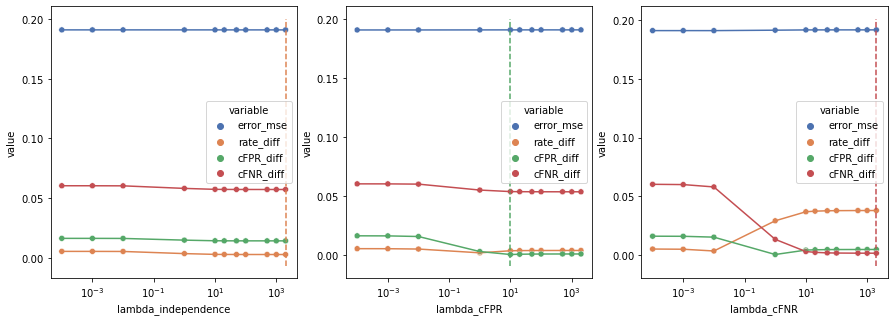

In [552]:
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
sim1_true.plot_one_constraint(fairness, 'error_mse')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_mse', ylabel='cFNR_diff'>)

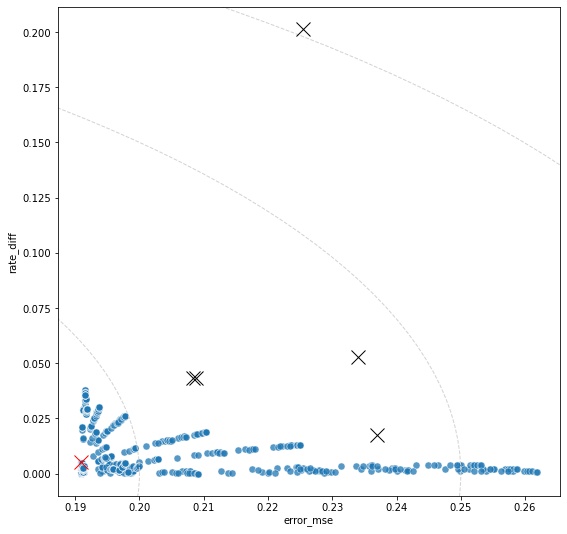

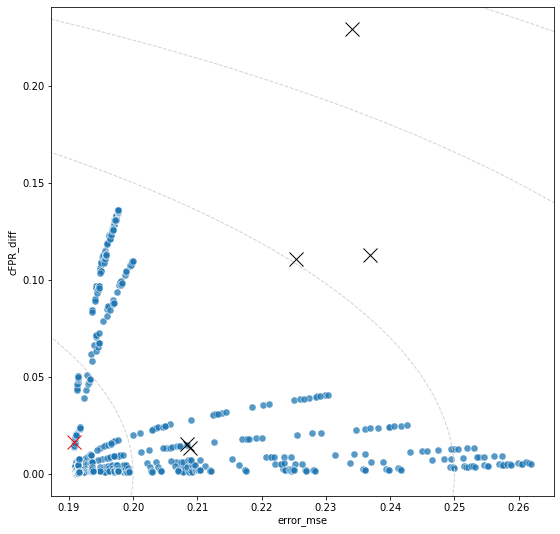

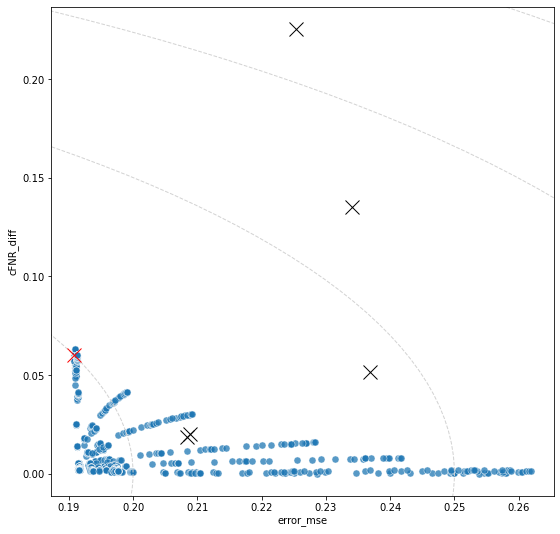

In [553]:
sim1_true.plot_two_criteria('error_mse', 'rate_diff')
sim1_true.plot_two_criteria('error_mse', 'cFPR_diff')
sim1_true.plot_two_criteria('error_mse', 'cFNR_diff')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='cFPR_diff', ylabel='cFNR_diff'>)

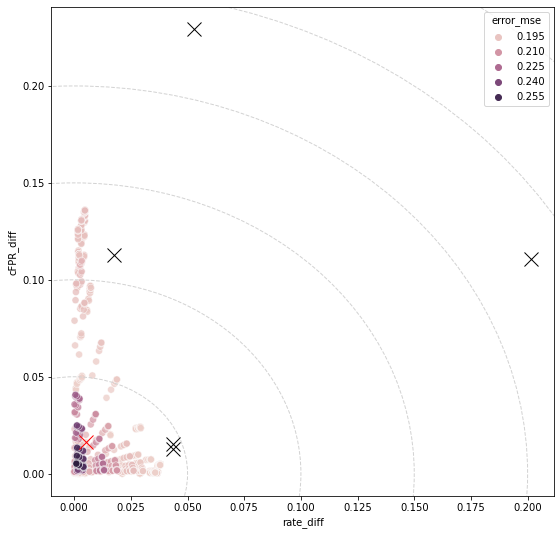

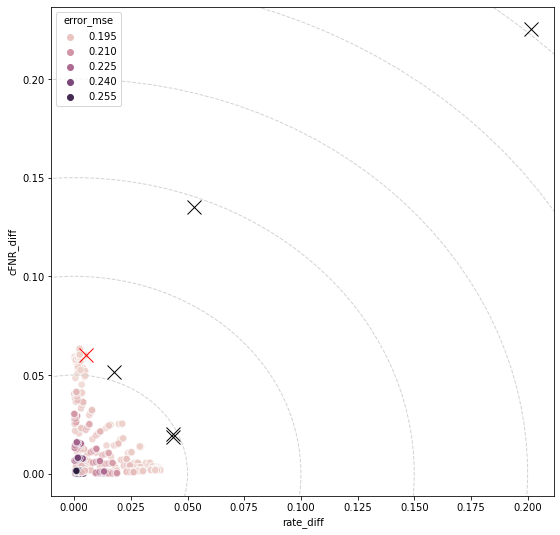

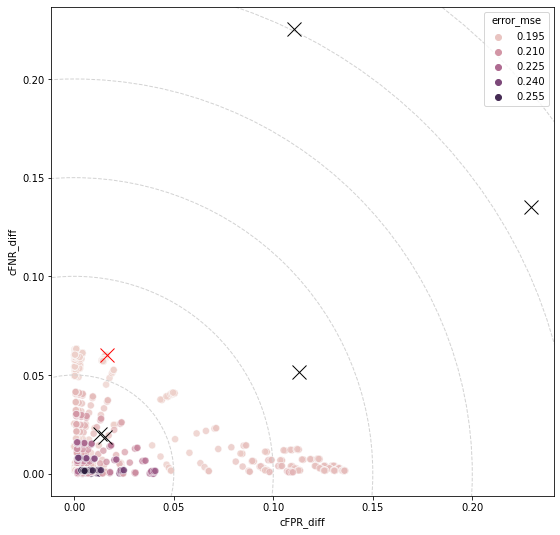

In [554]:
sim1_true.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
sim1_true.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
sim1_true.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')

## Minimize  MSE - counterfactual

In [21]:
# Separate datasets for estimating nuisance parameters, training input learners,
# and computing betahat. A separate test set is used to estimate performance and
# unfairness.
data_basis = generate_data_pre(1000, prob_A, beta_X, beta_D_pre, beta_Y0, beta_Y1,
                               trunc_pi=0.975)
data_train_nuis = generate_data_pre(1000, prob_A, beta_X, beta_D_pre, beta_Y0, beta_Y1,
                                    trunc_pi=0.975)
data_train_target = generate_data_pre(1000, prob_A, beta_X, beta_D_pre, beta_Y0, beta_Y1,
                                      trunc_pi=0.975)
data_test_target = generate_data_pre(10000, prob_A, beta_X, beta_D_pre, beta_Y0, beta_Y1,
                                     trunc_pi=0.975)

In [31]:
data_basis.to_csv('leastsquares/simulations/data_basis.csv', index=False)
data_train_nuis.to_csv('leastsquares/simulations/data_basis.csv', index=False)
data_train_target.to_csv('leastsquares/simulations/data_basis.csv', index=False)
data_test_target.to_csv('leastsquares/simulations/data_basis.csv', index=False)

In [301]:
# Define learners
learner_pi_train = RandomForestClassifier()
learner_mu_train = RandomForestClassifier()

learners_basis = [DummyRegressor(strategy='mean'),
                  RandomForestClassifier(),
#                   LogisticRegression(),
#                   svm.NuSVC(probability=True),
                      GradientBoostingClassifier(),
                  GaussianNB(),
                  Ridge(alpha=1)]

In [302]:
sim1 = FairPredictor(data_basis=data_basis,
                     data_train_nuis=data_train_nuis,
                     data_train_target=data_train_target,
                     data_test_nuis=None,
                     data_test_target=data_test_target,
                     covariates=X, protected=A, decision=D,
                     outcome=Y, predictors=None, outcome_bounds=(0, 1),
                     learners_basis=learners_basis,
                     learner_pi_train=learner_pi_train,
                     learner_mu_train=learner_mu_train,
                     learner_nu_train=None,
                     learner_pi_test=None, learner_mu_test=None,
                     learner_nu_test=None)

### True risk and fairness values on test set

In [303]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
sim1.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                       phihat_train='phihat', phibarhat_train='phihat',
                       phihat_test='Y0', phibarhat_test='Y0',
                       counterfactual=True, continuous=True, recompute=True)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [313]:
sim1.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
learner0,0.000000,0.265480,0.466017,0.500000,0.208682,0.000000,7.389644e-17,3.694822e-17
learner1,0.121238,0.089863,0.207768,0.953887,0.059200,0.279882,2.137953e-01,1.051531e-01
learner2,0.158045,0.080687,0.163929,0.960227,0.061506,0.306324,2.206743e-01,1.047064e-01
learner3,0.092183,0.169427,0.322038,0.836203,0.122845,0.522586,5.948979e-01,4.018016e-01
learner4,0.088467,0.092298,0.247846,0.984374,0.041488,0.224550,9.080139e-02,1.032082e-01


In [314]:
sim1.results[('independence', 'cFPR', 'cFNR')]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.144284,0.066866,0.167521,0.977624,0.038626,0.259434,0.104499,0.083086,0.0,0.000,0.0,
1,0.144241,0.066873,0.167572,0.977633,0.038616,0.258893,0.103667,0.082661,0.0,0.001,0.0,cFPR
2,0.143882,0.066948,0.168010,0.977682,0.038538,0.254333,0.096681,0.079071,0.0,0.010,0.0,cFPR
3,0.139455,0.070155,0.175708,0.975882,0.039628,0.189713,0.001902,0.027632,0.0,1.000,0.0,cFPR
4,0.138967,0.070924,0.176975,0.975218,0.040120,0.180688,0.010810,0.020384,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.000045,0.240870,0.485679,0.794691,0.136823,0.000435,0.004163,0.000352,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.000014,0.241938,0.486767,0.853252,0.137866,0.000445,0.002201,0.000261,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.000003,0.242827,0.487660,0.967980,0.138753,0.000453,0.000591,0.000186,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.000002,0.242941,0.487773,0.966899,0.138867,0.000454,0.000387,0.000176,2000.0,1000.000,2000.0,ind_cFPR_cFNR


In [327]:
sim1.filter_results('cFNR')

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff,lambda_cFNR,active_penalties
0,0.144284,0.066866,0.167521,0.977624,0.038626,0.259434,0.104499,0.083086,0.000,
121,0.144283,0.066868,0.167523,0.977620,0.038628,0.259306,0.104307,0.082977,0.001,cFNR
242,0.144278,0.066885,0.167542,0.977594,0.038649,0.258186,0.102617,0.082014,0.010,cFNR
363,0.144142,0.068118,0.168797,0.975997,0.039915,0.222709,0.051243,0.051169,1.000,cFNR
484,0.144139,0.068880,0.169526,0.974984,0.040664,0.209886,0.033378,0.039944,10.000,cFNR
605,0.144140,0.068945,0.169588,0.974903,0.040728,0.208906,0.032025,0.039085,20.000,cFNR
726,0.144141,0.068986,0.169626,0.974850,0.040768,0.208299,0.031187,0.038554,50.000,cFNR
847,0.144141,0.069000,0.169639,0.974832,0.040782,0.208093,0.030904,0.038374,100.000,cFNR
968,0.144142,0.069011,0.169650,0.974819,0.040792,0.207928,0.030675,0.038229,500.000,cFNR
1089,0.144142,0.069013,0.169651,0.974816,0.040794,0.207907,0.030647,0.038211,1000.000,cFNR


In [316]:
## Save results

sim1.results['base_learners'].reset_index().to_csv('leastsquares/simulations/sim1_base_performance.csv',
                                                   index=False)

sim1.results[('independence', 'cFPR', 'cFNR')]['performance'].to_csv('leastsquares/simulations/sim1_aggregated_performance.csv',
                                                                     index=False)

# Table with base learner and unpenalized least squares performance
base_perf = pd.concat([sim1.results['base_learners'], sim1.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[[0]]],
                      axis=0)
base_perf.index = ['Mean', 'Random Forest', 'GB Classifier',
                   'Naive Bayes', 'Ridge', 'Least Squares']
base_perf = base_perf[['error_mse', 'error_auc',
                       'rate_diff', 'cFPR_diff', 'cFNR_diff']]

with open('leastsquares/simulations/sim1_base_performance.tex', 'w') as file_out:
    file_out.write(base_perf.reset_index().to_latex(index=False, float_format='%0.2f'))

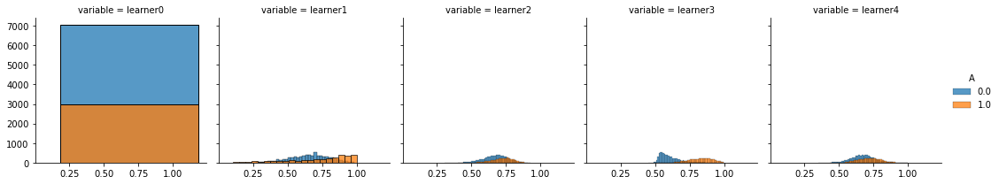

In [38]:
tmp = pd.DataFrame(sim1.basis_preds_test, columns = ['learner' + str(i) for i in range(len(learners_basis))])
tmp['A'] = sim1.data_test_target['A']

g = sns.FacetGrid(data=tmp.melt('A'), col='variable', hue='A')
# g.map_dataframe(sns.kdeplot, x='value', fill=True, alpha=0.75)
g.map_dataframe(sns.histplot, x='value')
g.add_legend()

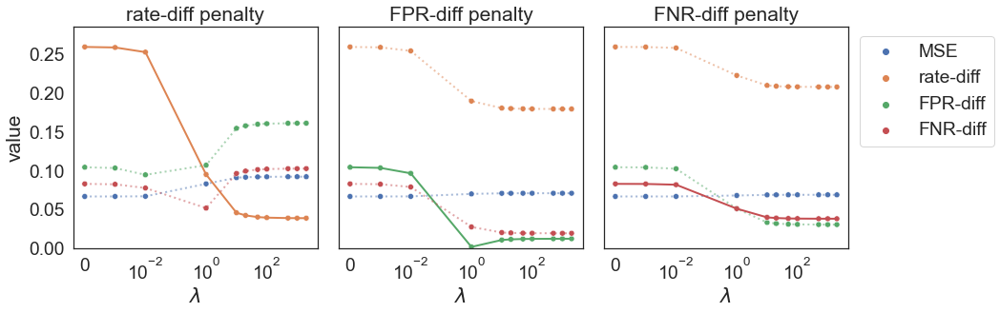

In [321]:
sns.set(font_scale = 1.75, style = 'white')
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
fig, ax = sim1.plot_one_constraint(fairness, 'error_mse')
for axx in ax:
    axx.xaxis.set_ticks([0.0001, 0.01, 1, 100])
    xlabels = axx.xaxis.get_ticklabels()
    xlabels = [mpl.text.Text(1e-04, 0, '0'),
               mpl.text.Text(0.01, 0, '$\\mathdefault{10^{-2}}$'),
               mpl.text.Text(1.0, 0, '$\\mathdefault{10^{0}}$'),
              mpl.text.Text(100.0, 0, '$\\mathdefault{10^{2}}$')]
    axx.xaxis.set_ticklabels(xlabels)
# fig.savefig('leastsquares/simulations/sim1_one_constraint.pdf')

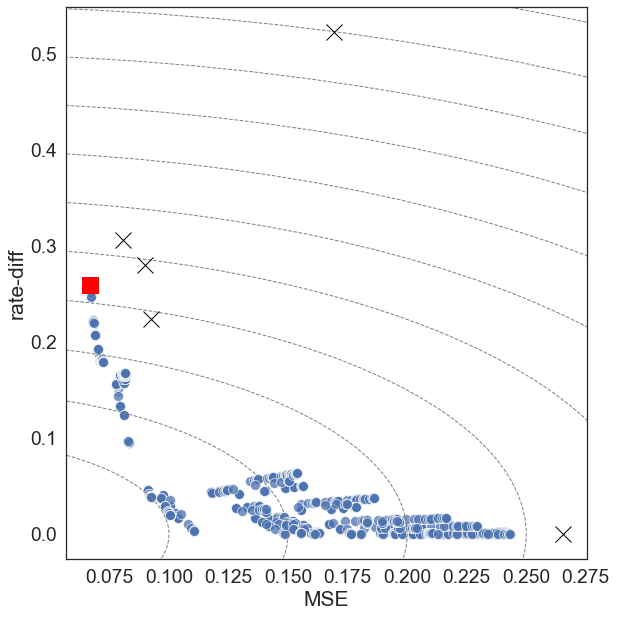

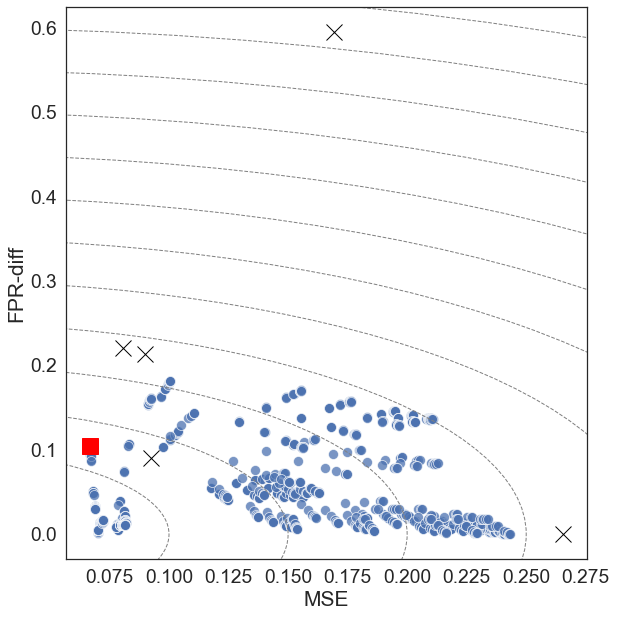

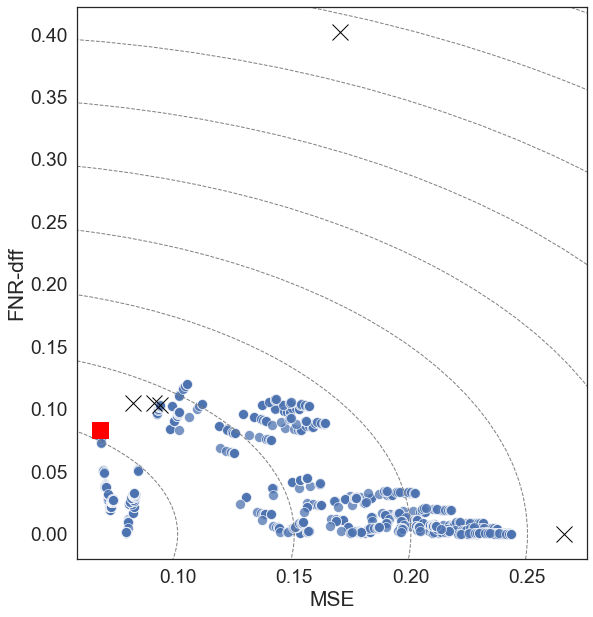

In [318]:
fig, ax = sim1.plot_two_criteria('error_mse', 'rate_diff')
fig.set_tight_layout(True)
fig.savefig('leastsquares/simulations/sim1_MSE_rate-diff.pdf')

fig, ax = sim1.plot_two_criteria('error_mse', 'cFPR_diff')
fig.set_tight_layout(True)
fig.savefig('leastsquares/simulations/sim1_MSE_cFPR-diff.pdf')

fig, ax = sim1.plot_two_criteria('error_mse', 'cFNR_diff')
fig.set_tight_layout(True)
fig.savefig('leastsquares/simulations/sim1_MSE_cFNR-diff.pdf')

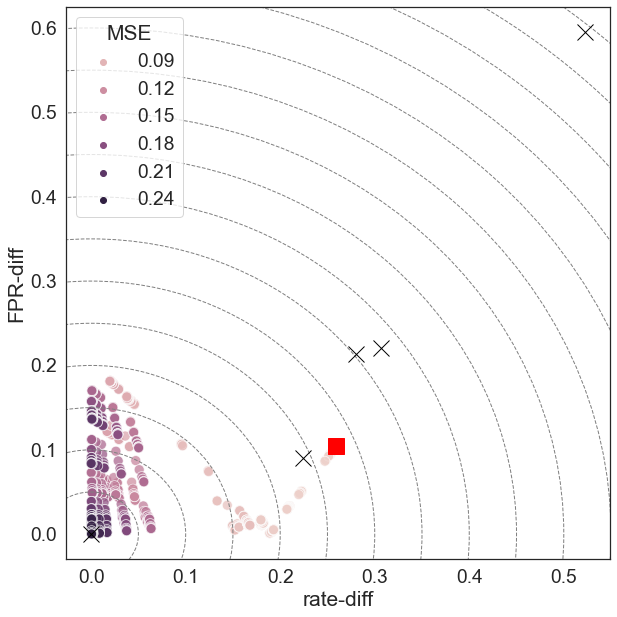

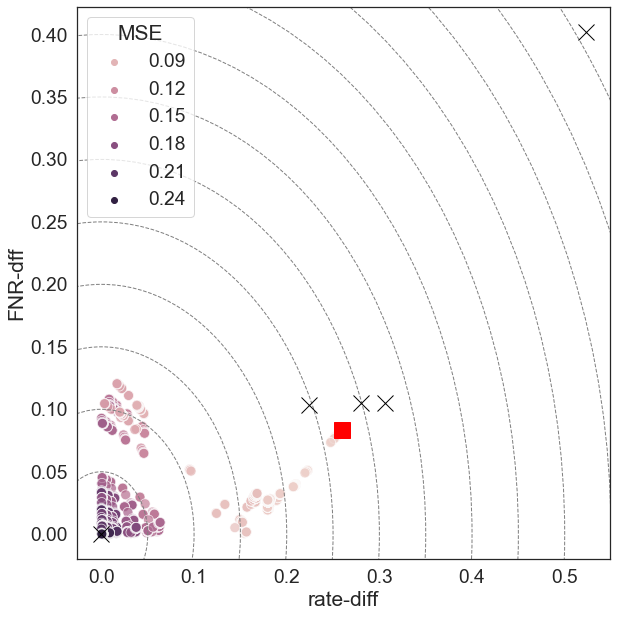

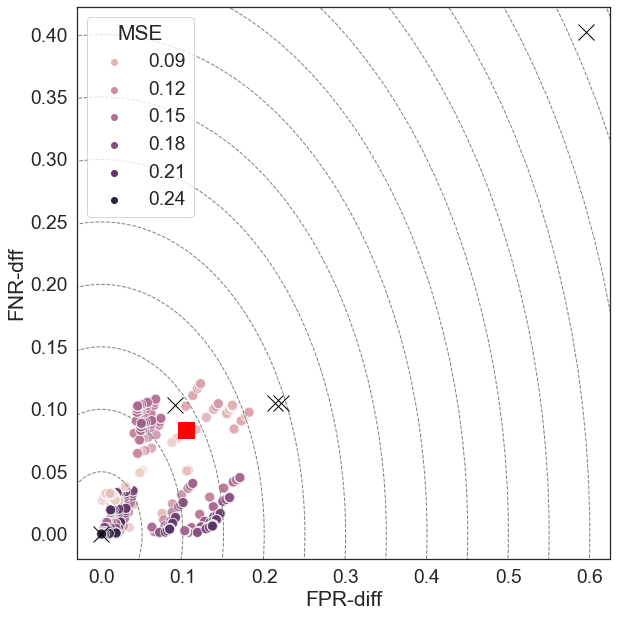

In [328]:
fig, ax = sim1.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/simulations/sim1_rate_cFPR_MSE.pdf')

fig, ax = sim1.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/simulations/sim1_rate_cFNR_MSE.pdf')

fig, ax = sim1.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/simulations/sim1_cFPR_cFNR_MSE.pdf')

In [402]:
# sim1_results_original = sim1.results[('independence', 'cFPR', 'cFNR')]['performance']
# sim1.results[('independence', 'cFPR', 'cFNR')]['performance'] = sim1_results_original

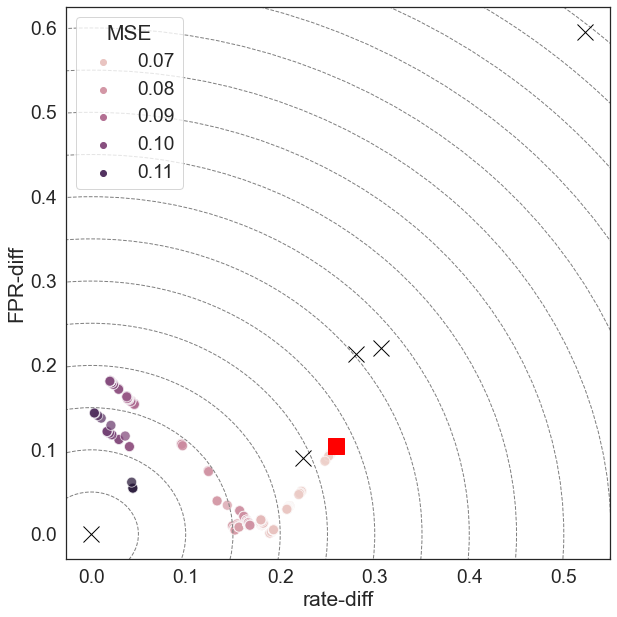

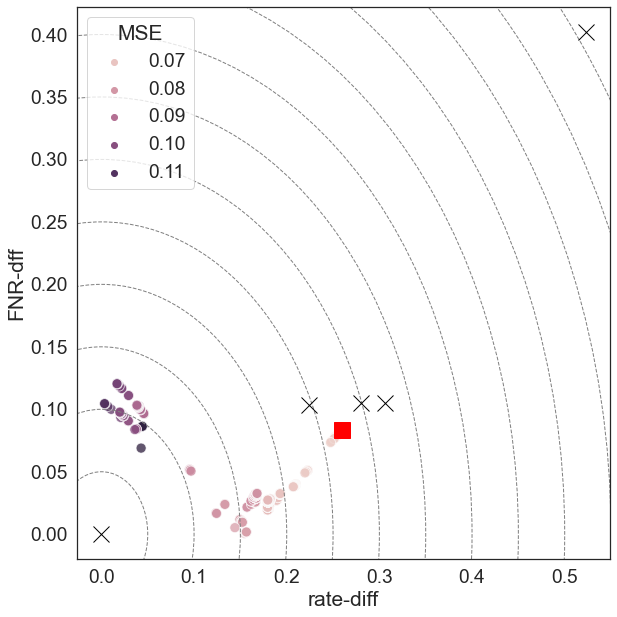

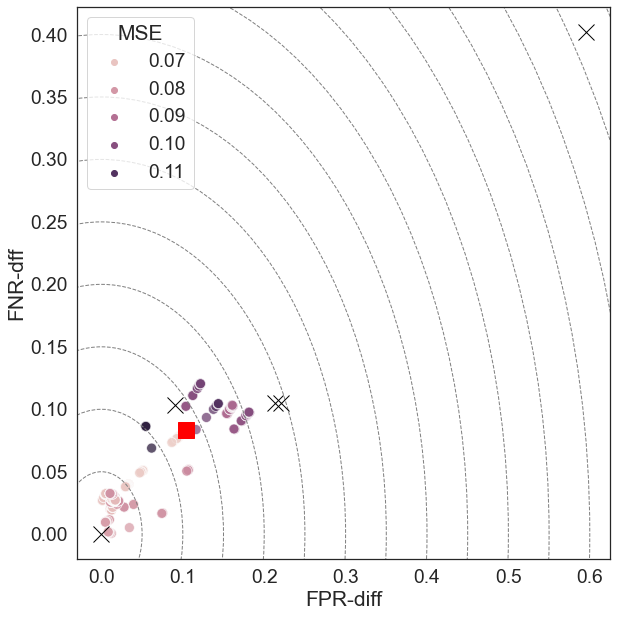

In [406]:
## Filter to low MSE models
low_mse = sim1_results_original.loc[sim1_results_original.error_mse <= 0.12]
sim1.results[('independence', 'cFPR', 'cFNR')]['performance'] = low_mse

fig, ax = sim1.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/simulations/sim1_rate_cFPR_MSE.pdf')

fig, ax = sim1.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/simulations/sim1_rate_cFNR_MSE.pdf')

fig, ax = sim1.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/simulations/sim1_cFPR_cFNR_MSE.pdf')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='FPR-diff', ylabel='FNR-dff'>)

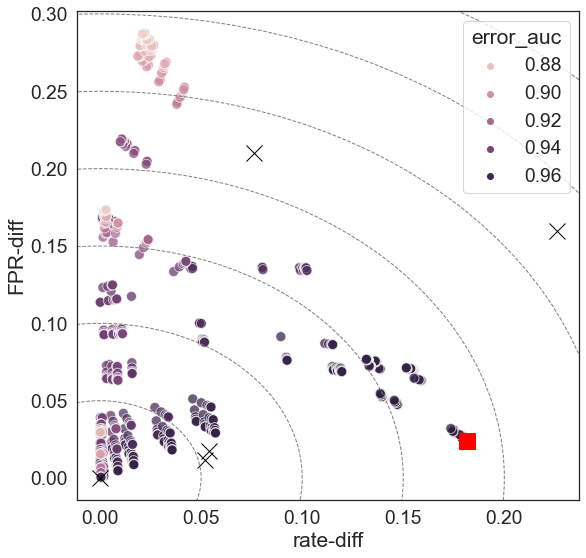

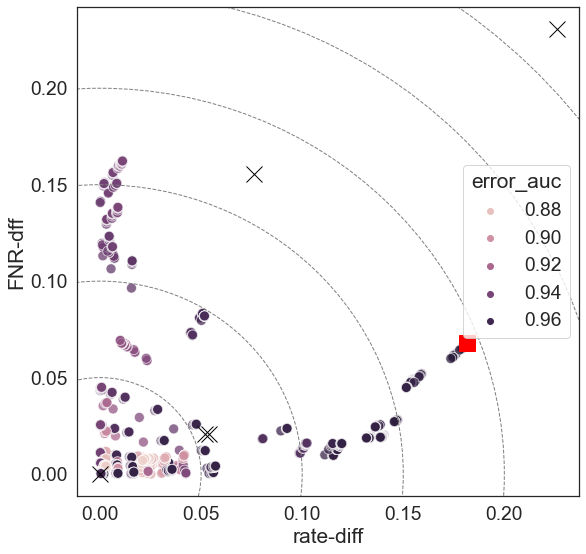

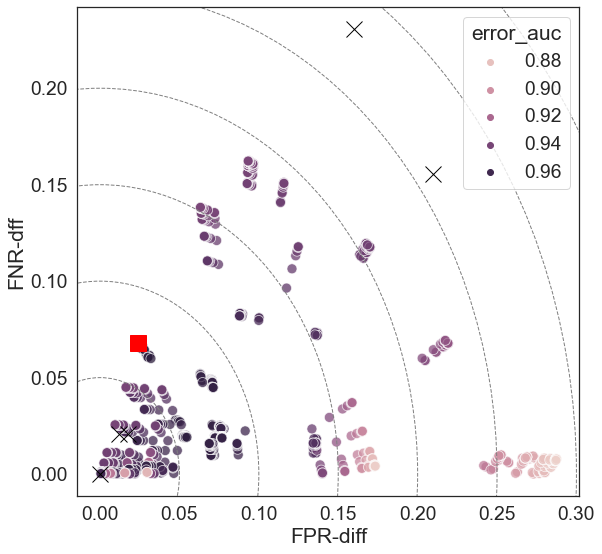

In [264]:
sim1.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_auc')
sim1.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_auc')
sim1.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_auc')

#### Get best performing models

In [424]:
perf = sim1.results[('independence', 'cFPR', 'cFNR')]['performance']
min_rate = get_closest_to_origin(['error_mse', 'rate_diff'], perf)
min_FPR = get_closest_to_origin(['error_mse', 'cFPR_diff'], perf)
min_FNR = get_closest_to_origin(['error_mse', 'cFNR_diff'], perf)
min_rate_FPR = get_closest_to_origin(['error_mse', 'rate_diff', 'cFPR_diff'], perf)
min_rate_FNR = get_closest_to_origin(['error_mse', 'rate_diff', 'cFNR_diff'], perf)
min_FPR_FNR = get_closest_to_origin(['error_mse', 'cFPR_diff', 'cFNR_diff'], perf)
min_all = get_closest_to_origin(['error_mse', 'rate_diff', 'cFPR_diff', 'cFNR_diff'], perf)

idx = [min_rate, min_FPR, min_FNR, min_rate_FPR, min_rate_FNR, min_FPR_FNR, min_all]
tmp = sim1.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[idx][['error_mse', 'error_auc', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
tmp.index = ['MSE + rate-diff', 'MSE + FPR-diff', 'MSE + FNR-diff', 'MSE + rate-diff + FPR-diff',
            'MSE + rate-diff + FNR-diff', 'MSE + FPR-diff + FNR-diff', 'MSE + rate-diff + FPR-diff + FNR-diff']

with open('leastsquares/simulations/sim1_best_performance.tex', 'w') as file_out:
    file_out.write(tmp.to_latex(index=True, float_format='%0.2f'))

### Estimated risk and fairness values on test set

In [338]:
learner_pi_test = RandomForestClassifier()
learner_mu_test = RandomForestClassifier()

data_test_nuis = generate_data_pre(1000, prob_A, beta_X, beta_D_pre, beta_Y0, beta_Y1,
                                     trunc_pi=0.975)

In [339]:
sim1b = FairPredictor(data_basis=data_basis,
                     data_train_nuis=data_train_nuis,
                     data_train_target=data_train_target,
                     data_test_nuis=data_test_nuis,
                     data_test_target=data_test_target,
                     covariates=X, protected=A, decision=D,
                     outcome=Y, predictors=None, outcome_bounds=(0, 1),
                     learners_basis=learners_basis,
                     learner_pi_train=learner_pi_train,
                     learner_mu_train=learner_mu_train,
                     learner_nu_train=None,
                     learner_pi_test=learner_pi_test, learner_mu_test=learner_mu_test,
                     learner_nu_test=None)

In [340]:
sim1b.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                       phihat_train='phihat', phibarhat_train='phihat',
                       phihat_test='phihat', phibarhat_test='phihat',
                       counterfactual=True, continuous=True, recompute=True)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [343]:
perf = sim1b.results[('independence', 'cFPR', 'cFNR')]['performance']
# min_rate = 

In [348]:
perf

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.145186,0.045362,0.145452,NaN,0.051684,0.260845,0.094154,0.037978,0.0,0.000,0.0,
1,0.145141,0.045382,0.145517,NaN,0.051667,0.260293,0.093292,0.037556,0.0,0.001,0.0,cFPR
2,0.144760,0.045558,0.146078,NaN,0.051533,0.255637,0.086043,0.033995,0.0,0.010,0.0,cFPR
3,0.140105,0.050449,0.155692,NaN,0.052368,0.189124,0.013441,0.017128,0.0,1.000,0.0,cFPR
4,0.139576,0.051507,0.157288,NaN,0.052917,0.179762,0.026758,0.024390,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.000046,0.243418,0.488825,NaN,0.146712,0.000276,0.005188,0.000553,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.000015,0.244494,0.489922,NaN,0.147773,0.000369,0.002727,0.000432,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.000003,0.245392,0.490822,NaN,0.148681,0.000445,0.000706,0.000333,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.000002,0.245507,0.490937,NaN,0.148798,0.000454,0.000450,0.000320,2000.0,1000.000,2000.0,ind_cFPR_cFNR


In [354]:
perf[['error_mse', 'rate_diff']].apply(lambda x: np.linalg.norm(x), axis=1)

0       0.264760
1       0.264220
2       0.259665
3       0.195737
4       0.186996
          ...   
1326    0.243418
1327    0.244495
1328    0.245393
1329    0.245507
1330    0.245565
Length: 1331, dtype: float64

In [379]:
idx = [min_rate, min_FPR, min_FNR, min_rate_FPR, min_rate_FNR, min_FPR_FNR, min_all]

perf_est = perf.loc[idx]

betahats = sim1b.results[('independence', 'cFPR', 'cFNR')]['betahats']#[idx]

betahats = [betahats[i] for i in idx]

len(betahats)

preds = predict_basis(data_test_target, sim1b.learners_basis,
                                  sim1b.all_covariates, sim1b.outcome_bounds,
                                  continuous=True)

In [399]:
## Compute true risk and fairness for the chosen models on a validation set
# def eval_model(data, protected, phihat, phibarhat, base_predictions, betahats,
#                unfairness='all', clip=None, lambdas=None, lambda_cols=None,
#                err='all', absval=True)

perf_true = eval_model(data_test_target, 'A', 'Y0', 'Y0', preds, betahats, clip=((0, 1)))

In [397]:
perf_est

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
354,0.126334,0.076774,0.195726,NaN,0.074658,0.039289,0.171253,0.143435,2000.0,0.01,0.01,ind_cFPR_cFNR
1213,0.137215,0.050557,0.158899,NaN,0.049491,0.195303,0.008702,0.006765,0.0,1.00,2000.00,cFPR_cFNR
365,0.144862,0.046988,0.147291,NaN,0.053287,0.226494,0.044099,0.008188,0.0,0.01,1.00,cFPR_cFNR
48,0.089017,0.102182,0.257752,NaN,0.101760,0.050082,0.043248,0.123151,10.0,10.00,0.00,ind_cFPR
531,0.042712,0.122064,0.324870,NaN,0.066697,0.045986,0.102546,0.041718,10.0,1.00,10.00,ind_cFPR_cFNR
1213,0.137215,0.050557,0.158899,NaN,0.049491,0.195303,0.008702,0.006765,0.0,1.00,2000.00,cFPR_cFNR
533,0.028135,0.129608,0.346695,NaN,0.070043,0.057061,0.031320,0.034548,10.0,20.00,10.00,ind_cFPR_cFNR


In [400]:
perf_true

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
0,0.126334,0.092232,0.211185,0.950045,0.057714,0.039289,0.157468,0.103711
1,0.137215,0.069825,0.178167,0.977981,0.038043,0.195303,0.005566,0.036080
2,0.144862,0.067952,0.168255,0.976008,0.039991,0.226494,0.055257,0.054449
3,0.089017,0.117495,0.273065,0.902563,0.076779,0.050082,0.045126,0.083245
4,0.042712,0.128000,0.330805,0.960117,0.059794,0.045986,0.090200,0.023424
5,0.137215,0.069825,0.178167,0.977981,0.038043,0.195303,0.005566,0.036080
6,0.028135,0.136379,0.353465,0.963764,0.061306,0.057061,0.026661,0.014590


## Fourier series

In [314]:
basis_preds_train = get_fourier(data_train_target, X, intercept=True)
# basis_preds_train = np.clip(basis_preds_train, 0, 1)

basis_preds_test = get_fourier(data_test_target, X, intercept=True)
# basis_preds_test = np.clip(basis_preds_test, 0, 1)

In [315]:
sim2 = FairPredictor(data_basis=data_basis,
                     data_train_nuis=data_train_nuis,
                     data_train_target=data_train_target,
                     data_test_nuis=None,
                     data_test_target=data_test_target,
                     covariates=X, protected=A, decision=D,
                     outcome=Y, predictors=None, outcome_bounds=(0, 1),
                     learners_basis=None,
                     learner_pi_train=learner_pi_train,
                     learner_mu_train=learner_mu_train,
                     learner_nu_train=None,
                     learner_pi_test=None, learner_mu_test=None,
                     learner_nu_test=None)

sim2.basis_preds_train = basis_preds_train

Q0 = np.matmul(np.transpose(basis_preds_train),
               basis_preds_train)/len(basis_preds_train)
sim2.Q0_inv = np.linalg.inv(Q0)

sim2.basis_preds_test = basis_preds_test

In [316]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
sim2.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                       phihat_train='phihat', phibarhat_train='phihat',
                       phihat_test='Y0', phibarhat_test='Y0',
                       counterfactual=False, continuous=True, recompute=False)


NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:131: UserWarning: Training data nuisance learners have already been fit. Set recompute=True to recompute them.



FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [881]:
sim2.results[constraints]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,error_threshold_1,rate_diff_binary_1,cFPR_diff_binary_1,...,cFPR_diff_binary_8,cFNR_diff_binary_8,error_threshold_9,rate_diff_binary_9,cFPR_diff_binary_9,cFNR_diff_binary_9,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.006797,0.256451,0.499042,0.481881,0.002265,0.003312,0.000387,0.418,0.0,4.209966e-16,...,0.0,0.0,0.582,0.0,0.0,0.0,0.0,0.000,0.0,
1,0.006797,0.256451,0.499042,0.481889,0.002264,0.003311,0.000387,0.418,0.0,4.209966e-16,...,0.0,0.0,0.582,0.0,0.0,0.0,0.0,0.001,0.0,cFPR
2,0.006794,0.256448,0.499042,0.481881,0.002259,0.003300,0.000390,0.418,0.0,4.209966e-16,...,0.0,0.0,0.582,0.0,0.0,0.0,0.0,0.010,0.0,cFPR
3,0.006587,0.256225,0.499022,0.481692,0.001820,0.002338,0.000626,0.418,0.0,4.209966e-16,...,0.0,0.0,0.582,0.0,0.0,0.0,0.0,1.000,0.0,cFPR
4,0.006215,0.255814,0.498972,0.479953,0.000691,0.000133,0.001232,0.418,0.0,4.209966e-16,...,0.0,0.0,0.582,0.0,0.0,0.0,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.000326,0.246923,0.495786,0.482436,0.001161,0.002010,0.001219,0.418,0.0,4.209966e-16,...,0.0,0.0,0.582,0.0,0.0,0.0,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.000154,0.246592,0.495615,0.482485,0.000717,0.001191,0.000806,0.418,0.0,4.209966e-16,...,0.0,0.0,0.582,0.0,0.0,0.0,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.000045,0.246320,0.495439,0.483644,0.000257,0.000341,0.000377,0.418,0.0,4.209966e-16,...,0.0,0.0,0.582,0.0,0.0,0.0,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.000036,0.246287,0.495413,0.484289,0.000191,0.000218,0.000315,0.418,0.0,4.209966e-16,...,0.0,0.0,0.582,0.0,0.0,0.0,2000.0,1000.000,2000.0,ind_cFPR_cFNR


In [882]:
sim2.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,error_threshold_1,rate_diff_binary_1,cFPR_diff_binary_1,...,cFPR_diff_binary_7,cFNR_diff_binary_7,error_threshold_8,rate_diff_binary_8,cFPR_diff_binary_8,cFNR_diff_binary_8,error_threshold_9,rate_diff_binary_9,cFPR_diff_binary_9,cFNR_diff_binary_9
learner0,0.000000,0.418000,0.418000,0.500000,0.000000,4.209966e-16,3.401723e-16,0.418,0.000000,4.209966e-16,...,4.209966e-16,3.401723e-16,0.418,0.000000,4.209966e-16,3.401723e-16,0.418,0.000000,4.209966e-16,3.401723e-16
learner1,0.037553,0.463928,0.559873,0.488308,0.003384,1.969769e-02,6.622583e-03,0.520,0.014058,6.432749e-02,...,0.000000e+00,0.000000e+00,0.582,0.000000,0.000000e+00,0.000000e+00,0.582,0.000000,0.000000e+00,0.000000e+00
learner2,0.083390,0.482970,0.564308,0.476899,0.013269,3.471012e-03,3.120643e-02,0.534,0.063734,5.409357e-02,...,1.461988e-03,1.238294e-02,0.588,0.014766,7.309942e-03,1.298910e-02,0.583,0.001344,8.771930e-03,5.937875e-04
learner3,0.087153,0.464786,0.541749,0.514650,0.052036,5.090762e-02,6.143339e-02,0.501,0.069324,9.502924e-02,...,2.631579e-02,4.450932e-02,0.562,0.028117,2.777778e-02,3.671586e-02,0.578,0.034768,2.777778e-02,3.942502e-02
learner4,0.088775,0.472097,0.544680,0.500349,0.005742,2.636145e-03,6.784244e-03,0.525,0.004552,3.216374e-02,...,4.239766e-02,1.355815e-02,0.567,0.004128,5.555556e-02,1.651471e-02,0.578,0.005850,2.485380e-02,2.100523e-02
learner5,0.078576,0.470034,0.545059,0.509991,0.017435,1.407810e-03,2.151324e-02,0.509,0.044133,5.263158e-02,...,7.309942e-03,3.884360e-03,0.570,0.008020,1.023392e-02,6.012098e-03,0.572,0.004010,1.315789e-02,8.139837e-03
learner6,0.034930,0.457566,0.550127,0.513232,0.022909,4.224862e-02,1.050527e-02,0.505,0.030074,1.023392e-01,...,0.000000e+00,0.000000e+00,0.582,0.000000,0.000000e+00,0.000000e+00,0.582,0.000000,0.000000e+00,0.000000e+00
learner7,0.083866,0.467438,0.547605,0.487360,0.005511,3.419624e-02,2.408635e-02,0.531,0.020073,7.163743e-02,...,1.461988e-02,4.734218e-02,0.565,0.025640,7.309942e-03,4.698344e-02,0.573,0.015261,5.847953e-03,2.939248e-02
learner8,0.089272,0.465356,0.541265,0.506454,0.013776,2.038393e-02,6.947928e-03,0.511,0.017431,4.824561e-02,...,2.131628e-17,2.205673e-02,0.567,0.007147,5.847953e-03,6.482180e-03,0.570,0.023682,2.923977e-02,1.840741e-02
learner9,0.089891,0.472160,0.549650,0.507837,0.026265,2.606693e-02,5.366644e-02,0.510,0.077887,5.701754e-02,...,5.701754e-02,4.035281e-02,0.572,0.010426,3.508772e-02,3.374692e-02,0.577,0.019413,3.947368e-02,1.039128e-02


(<Figure size 1080x360 with 3 Axes>,
 array([<AxesSubplot:xlabel='lambda_independence', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFPR', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFNR', ylabel='value'>], dtype=object))

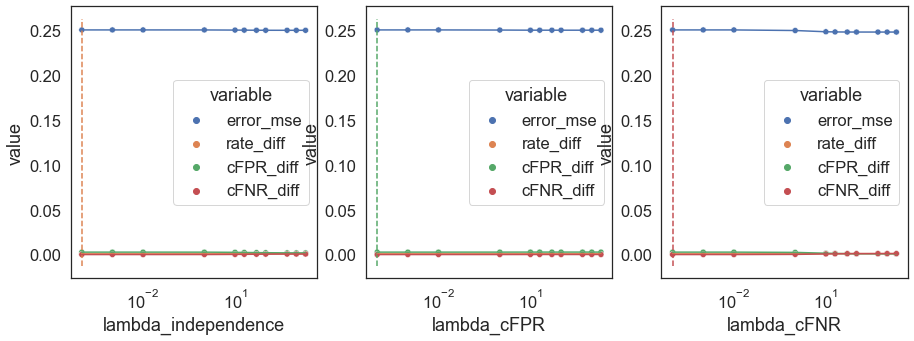

In [282]:
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
sim2.plot_one_constraint(fairness, 'error_mse')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_mse', ylabel='cFNR_diff'>)

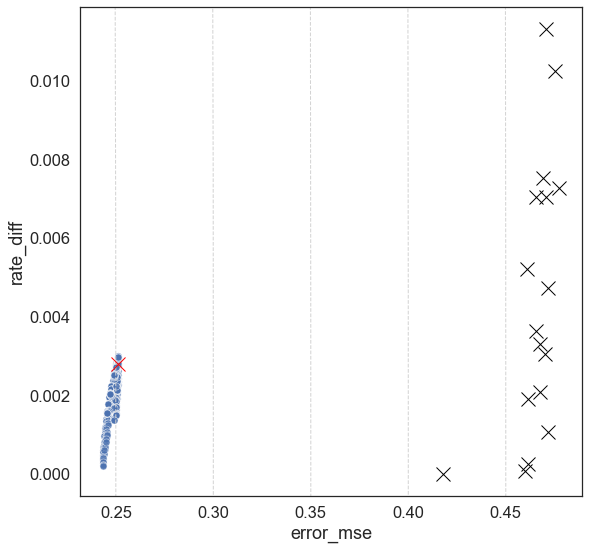

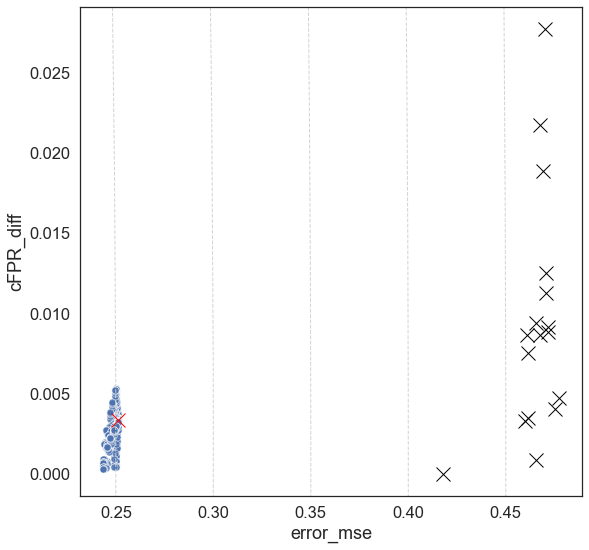

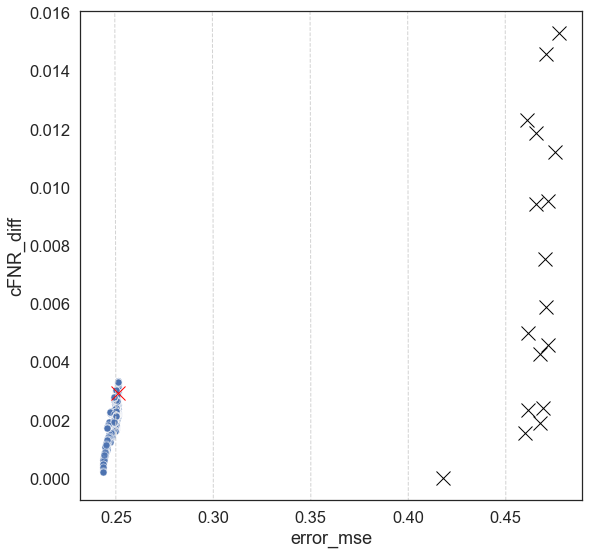

In [317]:
# , hue='lambda_independence')
sim2.plot_two_criteria('error_mse', 'rate_diff')
sim2.plot_two_criteria('error_mse', 'cFPR_diff')  # , hue='lambda_cFPR')
sim2.plot_two_criteria('error_mse', 'cFNR_diff')  # , hue='lambda_cFNR')

In [886]:
preds = np.matmul(sim2.basis_preds_test,
                  sim2.results[constraints]['betahats'][0])

In [891]:
tmp = pd.DataFrame({'preds': preds, 'race': sim2.data_test_target[A]})

<AxesSubplot:xlabel='preds', ylabel='Probability'>

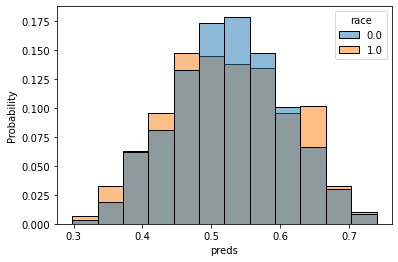

In [894]:
sns.histplot(data=tmp, x='preds', hue='race', bins=12,
             stat='probability', common_norm=False)

<AxesSubplot:>

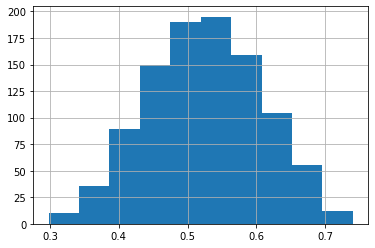

In [890]:
pd.Series(preds).hist()

## Learners + Fourier series

In [319]:
sim3 = FairPredictor(data_basis=data_basis,
                     data_train_nuis=data_train_nuis,
                     data_train_target=data_train_target,
                     data_test_nuis=None,
                     data_test_target=data_test_target,
                     covariates=X, protected=A, decision=D,
                     outcome=Y, predictors=None, outcome_bounds=(0, 1),
                     learners_basis=learners_basis,
                     learner_pi_train=learner_pi_train,
                     learner_mu_train=learner_mu_train,
                     learner_nu_train=None,
                     learner_pi_test=None, learner_mu_test=None,
                     learner_nu_test=None)

In [320]:
# sim3.fit_basis_learners(counterfactual=False, recompute=False)
sim3.predict_basis_train(continuous=True, recompute=False)
sim3.predict_basis_test(continuous=True, recompute=False)

fourier_preds_train = get_fourier(data_train_target, X)
# fourer_preds_train = np.clip(fourier_preds_train, 0, 1)

fourier_preds_test = get_fourier(data_test_target, X)
# fourier_preds_test = np.clip(fourier_preds_test, 0, 1)

sim3.basis_preds_train = np.concatenate(
    [sim3.basis_preds_train, fourier_preds_train], axis=1)
sim3.basis_preds_test = np.concatenate(
    [sim3.basis_preds_test, fourier_preds_test], axis=1)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:81: UserWarning: Basis learners have already been fit.                     Set recompute=True to recompute them.


In [322]:
Q0 = np.matmul(np.transpose(sim3.basis_preds_train),
               sim3.basis_preds_train)/len(sim3.basis_preds_train)
sim3.Q0_inv = np.linalg.inv(Q0)

In [323]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
sim3.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                       phihat_train='phihat', phibarhat_train='phihat',
                       phihat_test='Y0', phibarhat_test='Y0',
                       counterfactual=False, continuous=True, recompute=False)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:81: UserWarning: Basis learners have already been fit.                     Set recompute=True to recompute them.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: UserWarning: Basis predictions on the training data have already             been generated. Set recompute=True to regenerate them.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:114: UserWarning: Basis predictions on the test data have already             been generated. Set recompute=True to regenerate them.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:131: UserWarning: Training data nuisance learners have already been fit. Set recompute=True to recompute them.



FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


(<Figure size 1080x360 with 3 Axes>,
 array([<AxesSubplot:xlabel='lambda_independence', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFPR', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFNR', ylabel='value'>], dtype=object))

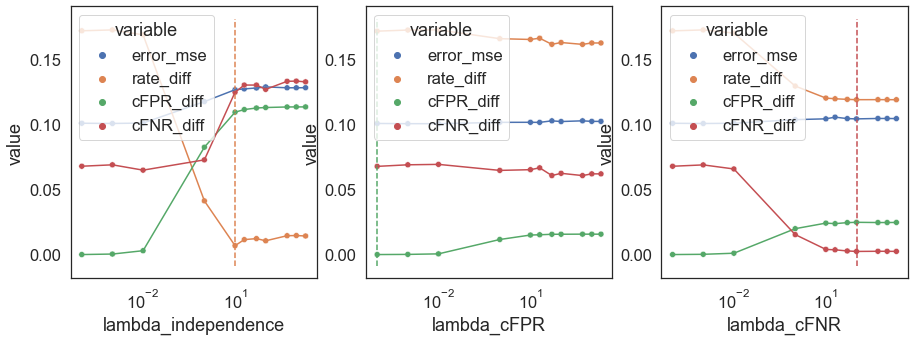

In [324]:
sim3.plot_one_constraint(fairness, 'error_mse')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_mse', ylabel='cFNR_diff'>)

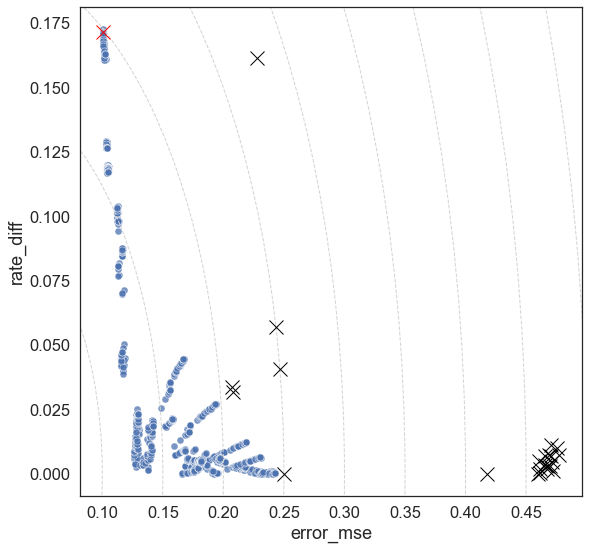

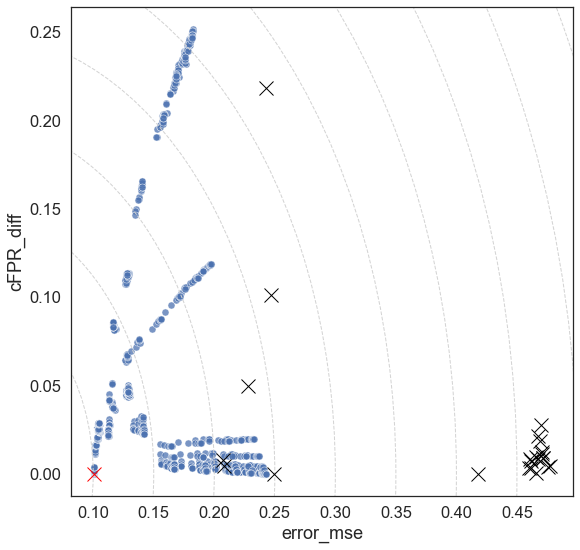

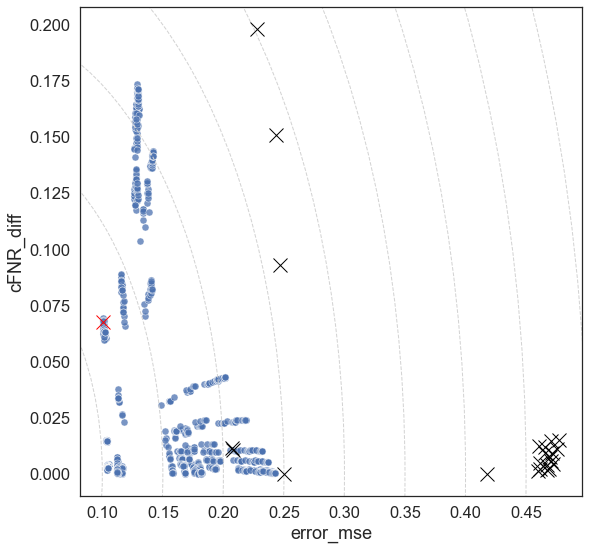

In [325]:
# , hue='lambda_independence')
sim3.plot_two_criteria('error_mse', 'rate_diff')
sim3.plot_two_criteria('error_mse', 'cFPR_diff')  # , hue='lambda_cFPR')
sim3.plot_two_criteria('error_mse', 'cFNR_diff')  # , hue='lambda_cFNR')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='cFPR_diff', ylabel='cFNR_diff'>)

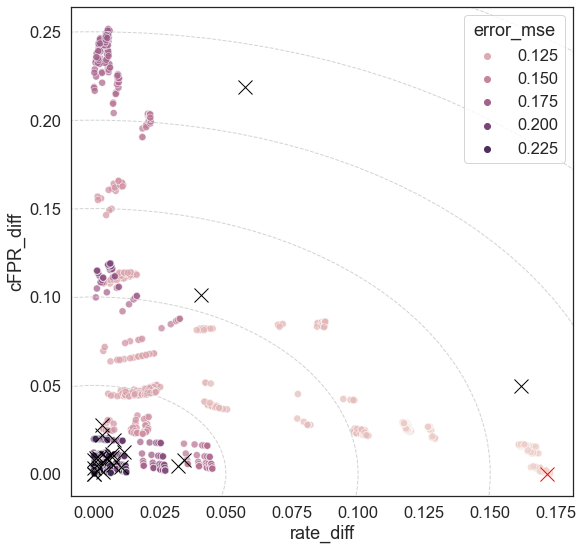

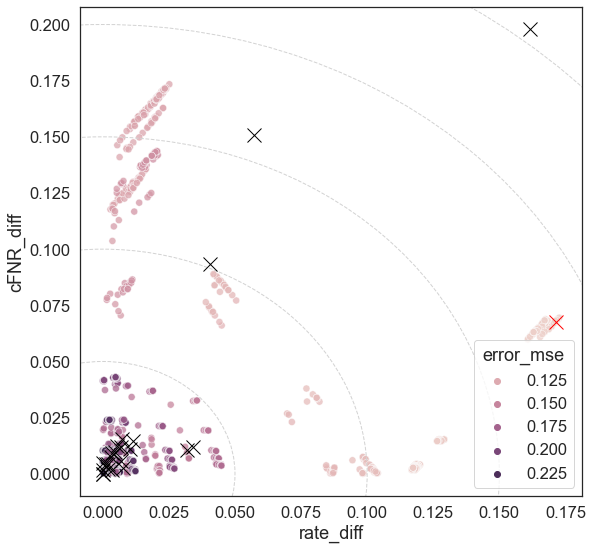

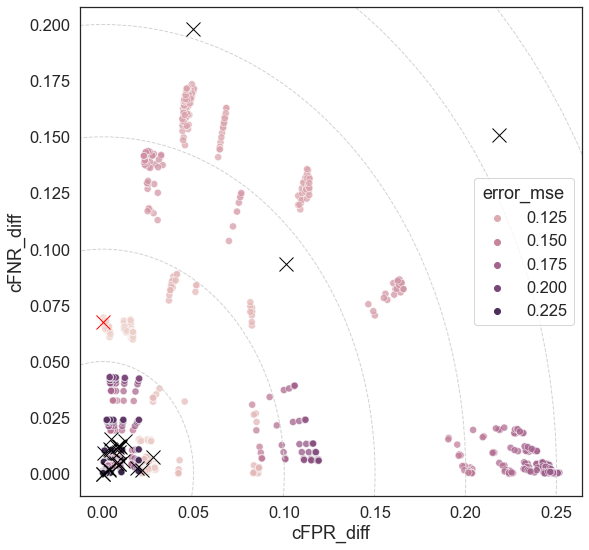

In [327]:
sim3.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
sim3.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
sim3.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')

## Minimize MSE - observable 

In [305]:
learners_basis = [DummyRegressor(strategy='mean'),
                  RandomForestClassifier(),
#                   LogisticRegression(),
#                   svm.NuSVC(probability=True),
                 GradientBoostingClassifier(),
                  GaussianNB(),
                  Ridge(alpha=1)]

In [306]:
sim4 = FairPredictor(data_basis=data_basis,
                     data_train_nuis=data_train_nuis,
                     data_train_target=data_train_target,
                     data_test_nuis=None,
                     data_test_target=data_test_target,
                     covariates=X, protected=A, decision=D,
                     outcome=Y, predictors=None, outcome_bounds=(0, 1),
                     learners_basis=learners_basis,
                     learner_pi_train=None,
                     learner_mu_train=None,
                     learner_nu_train=None,
                     learner_pi_test=None, learner_mu_test=None,
                     learner_nu_test=None)

In [307]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
sim4.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                       phihat_train='Y', phibarhat_train='Y',
                       phihat_test='Y', phibarhat_test='Y',
                       counterfactual=False, continuous=True, recompute=False)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [259]:
sim4.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
learner0,4.930381e-32,0.219808,0.435583,0.500000,0.149589,1.110223e-16,1.534772e-16,2.131628e-17
learner1,3.043945e-02,0.207564,0.395505,0.659581,0.146126,8.061462e-02,7.238826e-02,1.371796e-01
learner2,7.435778e-03,0.216238,0.424090,0.610800,0.148628,5.396653e-02,7.519661e-03,7.808795e-02
learner3,1.639795e-02,0.219242,0.423566,0.566014,0.146275,2.258354e-01,1.755058e-01,2.449606e-01
learner4,7.400636e-03,0.214557,0.422511,0.610335,0.146264,5.168220e-02,1.054312e-02,7.576192e-02


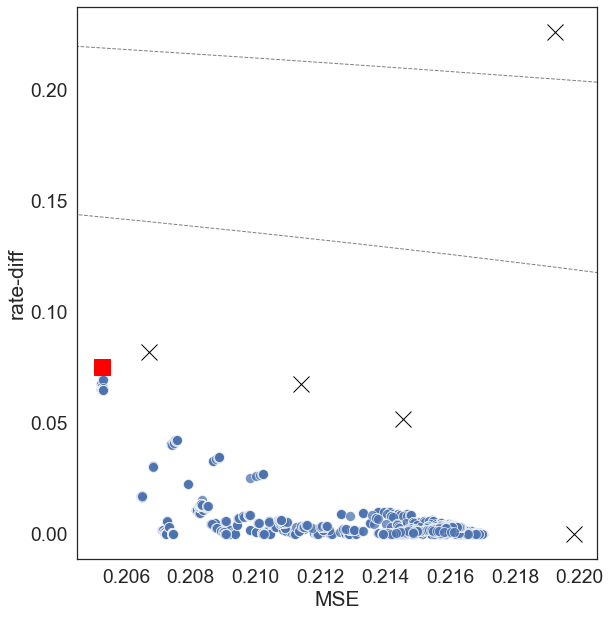

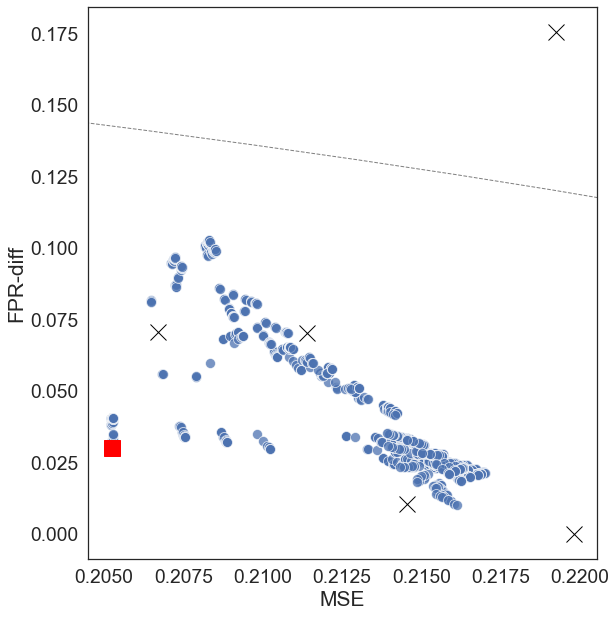

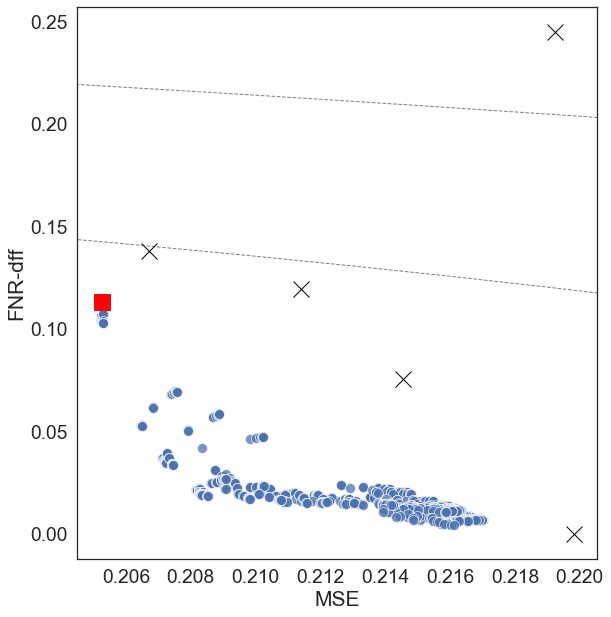

In [309]:
fig, ax = sim4.plot_two_criteria('error_mse', 'rate_diff')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/simulations/sim1_MSE_rate-diff.pdf')

fig, ax = sim4.plot_two_criteria('error_mse', 'cFPR_diff')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/simulations/sim1_MSE_cFPR-diff.pdf')

fig, ax = sim4.plot_two_criteria('error_mse', 'cFNR_diff')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/simulations/sim1_MSE_cFNR-diff.pdf')

# Child welfare data

In [434]:
# Paths for saved data
datapath = '../child_welfare_analysis/'
outpath = '../child_welfare_analysis/'

In [435]:
wel_train = pd.read_csv(os.path.join(datapath, 'child_welfare_train.csv'))
wel_test = pd.read_csv(os.path.join(datapath, 'child_welfare_test.csv'))

wel_train_nuis = wel_train.loc[wel_train.partition2 ==
                               'nuisance'].reset_index().drop('index', axis=1)
wel_train_target = wel_train.loc[wel_train.partition2 ==
                                 'target'].reset_index().drop('index', axis=1)

# wel_train = wel_train.assign(R_obs50 = (wel_train.muhat >= 0.5).astype(int),
#                             R50 = (wel_train.muhat0 >= 0.5).astype(int))
# wel_test = wel_test.assign(R_obs50 = (wel_test.muhat >= 0.5).astype(int),
#                           R50 = (wel_test.muhat0 >= 0.5).astype(int))

wel_test_nuis = wel_test.loc[wel_test.partition2 ==
                             'nuisance'].reset_index().drop('index', axis=1)
wel_test_target = wel_test.loc[wel_test.partition2 ==
                               'target'].reset_index().drop('index', axis=1)

In [436]:
# Split off some data for training base predictors
wel_basis, wel_train_nuis = train_test_split(
    wel_train_nuis, train_size=0.5)

wel_basis = wel_basis.reset_index().drop('index', axis=1)
wel_train_nuis = wel_train_nuis.reset_index().drop('index', axis=1)

In [437]:
A = 'race'
with open(os.path.join(datapath, 'predictors.txt'), 'r') as file_in:
    X = file_in.read().rstrip('\n').split('\t')
R = 'R'  # previously trained counterfactual model
# R = 'R_obs'  # observational model
# R = 'R50'
D = 'SCREEN_IN'
Y = 'REREF'

## Minimize MSE
Results without a constant dummy predictor (intercept)

In [438]:
# Specify learners
learners_basis = [DummyRegressor(strategy='mean'),
                  RandomForestClassifier(),
                  LogisticRegression(),
#                   svm.NuSVC(probability=True),
                  GaussianNB(),
                  Ridge(alpha=1)]

learner_pi_train = RandomForestClassifier(
    n_estimators=200, min_samples_leaf=10, max_features='sqrt')
learner_pi_test = RandomForestClassifier(
    n_estimators=200, min_samples_leaf=10, max_features='sqrt')
learner_mu_train = RandomForestClassifier(
    n_estimators=200, min_samples_leaf=10, max_features='sqrt')
learner_mu_test = RandomForestClassifier(
    n_estimators=200, min_samples_leaf=10, max_features='sqrt')

In [439]:
wel = FairPredictor(data_basis=wel_basis,
                    data_train_nuis=wel_train_nuis,
                    data_train_target=wel_train_target,
                    data_test_nuis=wel_test_nuis,
                    data_test_target=wel_test_target,
                    covariates=X, protected=A, decision=D,
                    outcome=Y, predictors=None, outcome_bounds=(0, 1),
                    learners_basis=learners_basis,
                    learner_pi_train=learner_pi_train,
                    learner_mu_train=learner_mu_train,
                    learner_pi_test=learner_pi_test,
                    learner_mu_test=learner_mu_test)

In [440]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
wel.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                      phihat_train='phihat', phibarhat_train='phihat',
                      phihat_test='phihat', phibarhat_test='phihat',
                      counterfactual=True, continuous=True, recompute=False)

BASIS LEARNERS
...fitting basis learners...


/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [441]:
wel.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
learner0,1.232595e-32,0.217633,0.431372,NaN,0.152621,1.110223e-16,1.580740e-16,1.136651e-15
learner1,1.909743e-02,0.210806,0.408772,NaN,0.142046,4.588255e-03,1.254478e-02,3.876232e-02
learner2,4.651551e-02,0.240296,0.411780,NaN,0.185475,4.237389e-02,3.971936e-02,4.586576e-02
learner3,2.463033e-01,0.505789,0.508392,NaN,0.482217,7.282986e-02,7.495639e-02,6.800897e-02
learner4,8.990144e-02,0.277393,0.393325,NaN,0.219296,3.771161e-02,3.811626e-02,3.400776e-02


In [563]:
wel.results[constraints]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_threshold_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,rate_diff_binary,cFPR_diff_binary,cFNR_diff_binary,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.018462,0.208407,0.407279,0.324135,NaN,0.010227,0.001598,0.026670,0.043698,0.049988,0.027628,0.0,0.000,0.0,
1,0.018461,0.208407,0.407280,0.324135,NaN,0.010231,0.001603,0.026673,0.043698,0.049988,0.027628,0.0,0.001,0.0,cFPR
2,0.018456,0.208405,0.407287,0.324135,NaN,0.010267,0.001642,0.026701,0.043698,0.049988,0.027628,0.0,0.010,0.0,cFPR
3,0.018067,0.208355,0.407824,0.325888,NaN,0.013032,0.004710,0.028842,0.047003,0.053004,0.031757,0.0,1.000,0.0,cFPR
4,0.017519,0.208416,0.408790,0.326003,NaN,0.017997,0.010221,0.032686,0.047605,0.054680,0.030151,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.043118,0.241921,0.356638,0.328542,NaN,0.014515,0.006457,0.029271,0.049434,0.040753,0.063799,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.043075,0.241890,0.356656,0.328659,NaN,0.014500,0.006443,0.029254,0.048905,0.040526,0.062636,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.042849,0.241729,0.356750,0.329078,NaN,0.014420,0.006370,0.029165,0.049045,0.042252,0.059445,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.042708,0.241630,0.356808,0.328436,NaN,0.014369,0.006323,0.029109,0.049157,0.042576,0.059085,2000.0,1000.000,2000.0,ind_cFPR_cFNR


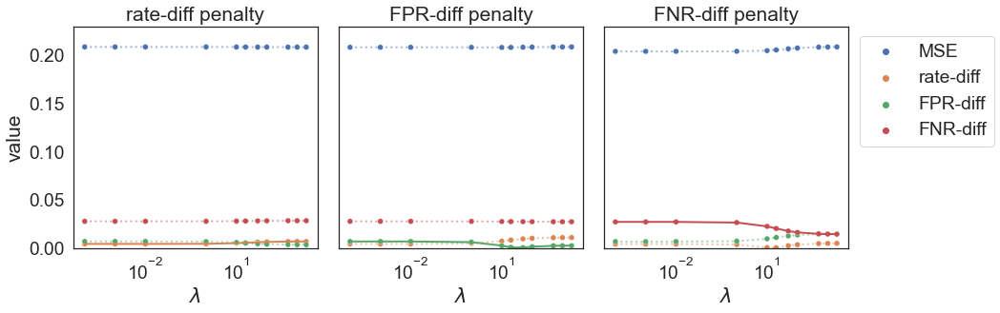

In [442]:
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
fig_wel, ax_wel = wel.plot_one_constraint(fairness, 'error_mse')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='MSE', ylabel='FNR-dff'>)

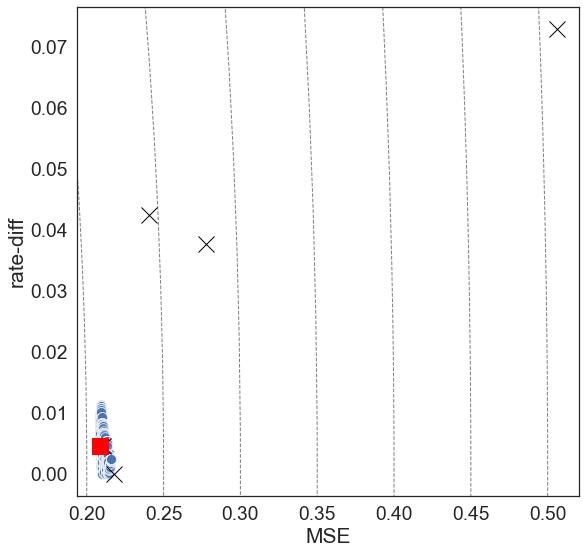

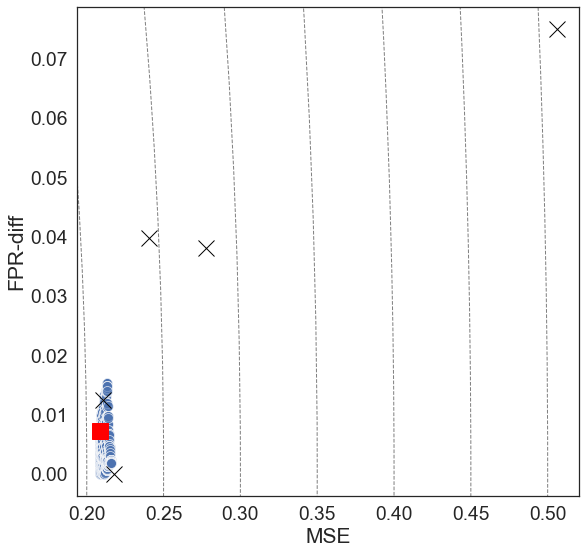

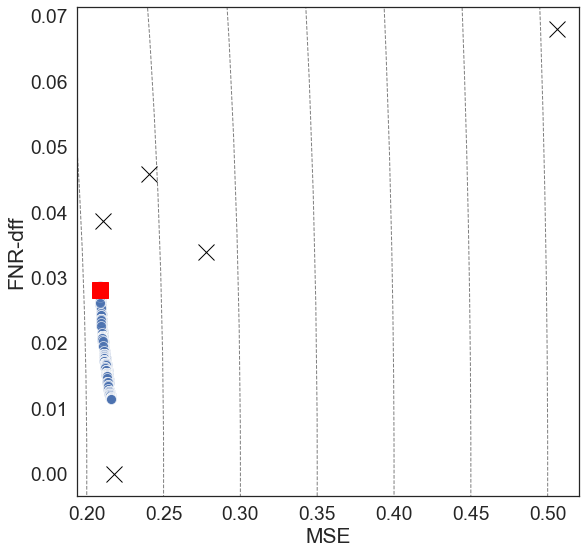

In [443]:
wel.plot_two_criteria('error_mse', 'rate_diff')
wel.plot_two_criteria('error_mse', 'cFPR_diff')
wel.plot_two_criteria('error_mse', 'cFNR_diff')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='FPR-diff', ylabel='FNR-dff'>)

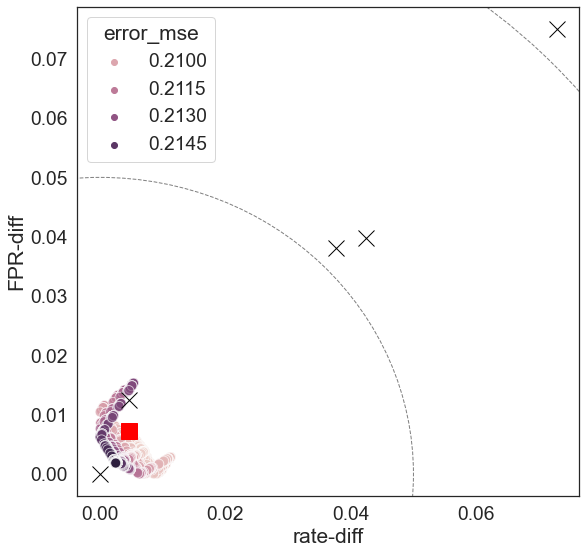

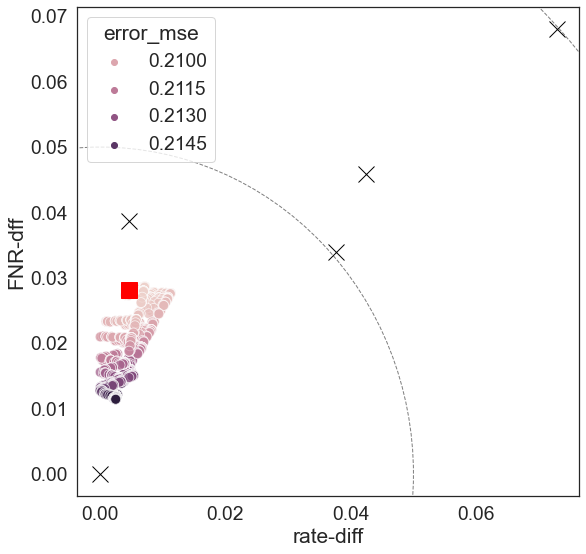

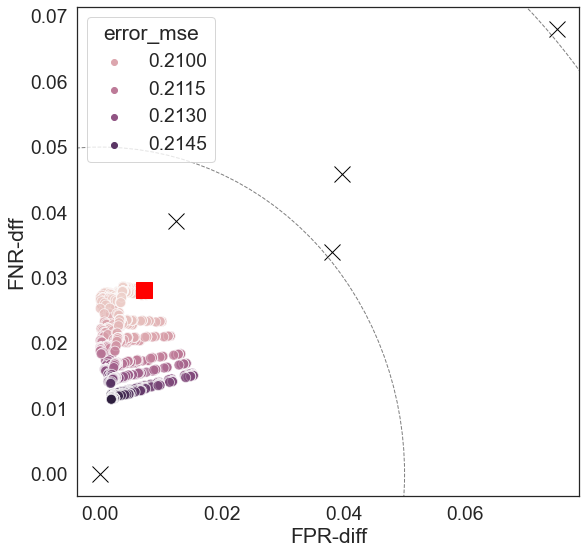

In [444]:
wel.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
wel.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
wel.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')

# COMPAS

## Setup

In [2]:
# Paths for saved data and figures
datapath = '../compas_analysis/'
outpath = '../compas_analysis/'

In [3]:
random_state = 104

In [4]:
dat = pd.read_csv(os.path.join(datapath, 'compas_general_recidivism.csv'))
dat['released'] = (dat['incarceration_duration'] <= 3).astype(int)

In [5]:
compas_train, compas_test = train_test_split(dat, test_size=0.4)
compas_basis, compas_train = train_test_split(compas_train, test_size=0.67)
compas_train_nuis, compas_train_target = train_test_split(
    compas_train, test_size=0.5)
compas_test_nuis, compas_test_target = train_test_split(
    compas_test, test_size=0.5)

In [6]:
compas_basis = compas_basis.reset_index().drop('index', axis=1)
compas_train_nuis = compas_train_nuis.reset_index().drop('index', axis=1)
compas_train_target = compas_train_target.reset_index().drop('index', axis=1)
compas_test_nuis = compas_test_nuis.reset_index().drop('index', axis=1)
compas_test_target = compas_test_target.reset_index().drop('index', axis=1)

In [7]:
compas_basis.to_csv('leastsquares/compas/compas_basis.csv', index=False)
compas_train_nuis.to_csv('leastsquares/compas/compas_train_nuis.csv', index=False)
compas_train_target.to_csv('leastsquares/compas/compas_train_target.csv', index=False)
compas_test_nuis.to_csv('leastsquares/compas/compas_test_nuis.csv', index=False)
compas_test_target.to_csv('leastsquares/compas/compas_test_target.csv', index=False)

In [8]:
A = 'race'
X = ['age_greater_than_45', 'age_less_than_25', 'priors_count']
R = 'score_decile'
D = 'released'
Y = 'two_year_recid'

## Minimize MSE
Results with a constant dummy predictor (intercept)

In [9]:
# Specify learners
learners_basis = [DummyRegressor(strategy='mean'),
    RandomForestClassifier(),
                  LogisticRegression(),
#                   svm.NuSVC(probability=True),
                    GradientBoostingClassifier(),
#                   GaussianNB(),
                  Ridge(alpha=1)]

learner_pi_train = RandomForestClassifier(
    n_estimators=200, min_samples_leaf=10, max_features='sqrt')
learner_mu_train = RandomForestRegressor(
    n_estimators=200, min_samples_leaf=10, max_features='sqrt')
learner_pi_test = RandomForestClassifier(
    n_estimators=200, min_samples_leaf=10, max_features='sqrt')
learner_mu_test = RandomForestRegressor(
    n_estimators=200, min_samples_leaf=10, max_features='sqrt')

In [15]:
compas_deciles = FairPredictor(data_basis=compas_basis,
                               data_train_nuis=compas_train_nuis,
                               data_train_target=compas_train_target,
                               data_test_nuis=compas_test_nuis,
                               data_test_target=compas_test_target,
                               covariates=X, protected=A, decision=D,
                               outcome=Y, predictors=R, outcome_bounds=(0, 1),
                               learners_basis=learners_basis,
                               learner_pi_train=learner_pi_train,
                               learner_mu_train=learner_mu_train,
                               learner_pi_test=learner_pi_test,
                               learner_mu_test=learner_mu_test)

In [16]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
compas_deciles.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                                 phihat_train='phihat', phibarhat_train='phihat',
                                 phihat_test='phihat', phibarhat_test='phihat',
                                 counterfactual=True, continuous=True, recompute=False)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [456]:
compas_deciles.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
learner0,1.232595e-32,0.257379,0.499114,NaN,0.196655,0.000000,3.835316e-16,3.229740e-16
learner1,1.176864e-01,0.276550,0.408267,NaN,0.334891,0.042152,1.482035e-02,4.656691e-03
learner2,5.217368e-02,0.222054,0.419672,NaN,0.214124,0.059322,5.591853e-02,4.338828e-03
learner3,8.133073e-02,0.232517,0.401184,NaN,0.249576,0.063864,1.221344e-02,5.069312e-02
learner4,1.098378e-01,0.242718,0.381255,NaN,0.297982,0.238697,2.294383e-01,1.716738e-01
learner5,4.778116e-02,0.222563,0.424663,NaN,0.209577,0.050238,4.777592e-02,2.548847e-03
score_decile,7.867076e-02,0.237467,0.407979,NaN,0.270105,0.146767,1.542638e-01,7.530085e-02


In [460]:
compas_deciles.results[('independence', 'cFPR', 'cFNR')]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.040269,0.220317,0.427650,NaN,0.214472,0.157728,0.150567,0.120018,0.0,0.000,0.0,
1,0.040240,0.220310,0.427672,NaN,0.214409,0.157467,0.150298,0.119765,0.0,0.001,0.0,cFPR
2,0.039987,0.220252,0.427865,NaN,0.213858,0.155161,0.147931,0.117534,0.0,0.010,0.0,cFPR
3,0.034346,0.221685,0.434884,NaN,0.198943,0.071685,0.062212,0.036744,0.0,1.000,0.0,cFPR
4,0.034044,0.224442,0.437920,NaN,0.196385,0.035570,0.025127,0.001792,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.002414,0.238402,0.484538,NaN,0.143346,0.003096,0.005771,0.012005,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.000977,0.242290,0.489979,NaN,0.142268,0.001751,0.003214,0.007733,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.000164,0.247046,0.495663,NaN,0.145521,0.000347,0.000543,0.003271,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.000105,0.247791,0.496484,NaN,0.146375,0.000144,0.000157,0.002626,2000.0,1000.000,2000.0,ind_cFPR_cFNR


In [47]:
compas_deciles.results[('independence', 'cFPR', 'cFNR')]['betahats'][0]

array([-0.16750449, -0.11009205, -0.19948354,  0.24951214,  0.87194911,
        0.44102321])

In [38]:
## Save results

compas_deciles.results['base_learners'].reset_index().to_csv('leastsquares/compas/compas_deciles_base_performance.csv',
                                                   index=False)

compas_deciles.results[('independence', 'cFPR', 'cFNR')]['performance'].to_csv('leastsquares/compas/compas_deciles_aggregated_performance.csv',
                                                                     index=False)
betahats = pd.DataFrame(compas_deciles.results[('independence', 'cFPR', 'cFNR')]['betahats'])
betahats.to_csv('leastsquares/compas/compas_deciles_aggregated_coefficients.csv')

# Table with base learner and unpenalized least squares performance
base_perf = pd.concat([compas_deciles.results['base_learners'], compas_deciles.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[[0]]],
                      axis=0)
base_perf.index = ['Mean', 'Random Forest', 'Logistic', 'GB Classifier',
                   'Ridge', 'COMPAS', 'Least Squares']
base_perf = base_perf[['error_mse', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
base_perf.columns = ['MSE', 'rate-diff', 'FPR-diff', 'FNR-diff']

with open('leastsquares/compas/compas_deciles_base_performance.tex', 'w') as file_out:
    file_out.write(base_perf.reset_index().to_latex(index=False, float_format='%0.2f'))

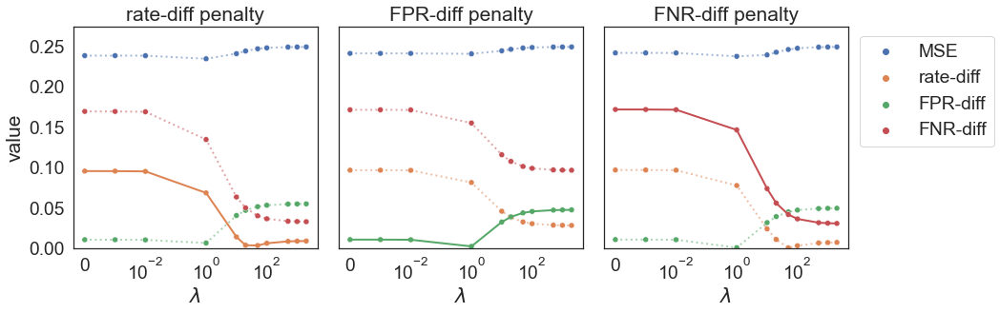

In [39]:
sns.set(font_scale = 1.75, style = 'white')
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
fig, ax = compas_deciles.plot_one_constraint(fairness, 'error_mse')
for axx in ax:
    axx.xaxis.set_ticks([0.0001, 0.01, 1, 100])
    xlabels = axx.xaxis.get_ticklabels()
    xlabels = [mpl.text.Text(1e-04, 0, '0'),
               mpl.text.Text(0.01, 0, '$\\mathdefault{10^{-2}}$'),
               mpl.text.Text(1.0, 0, '$\\mathdefault{10^{0}}$'),
              mpl.text.Text(100.0, 0, '$\\mathdefault{10^{2}}$')]
    axx.xaxis.set_ticklabels(xlabels)
    
fig.savefig('leastsquares/compas/compas_one_constraint.pdf')

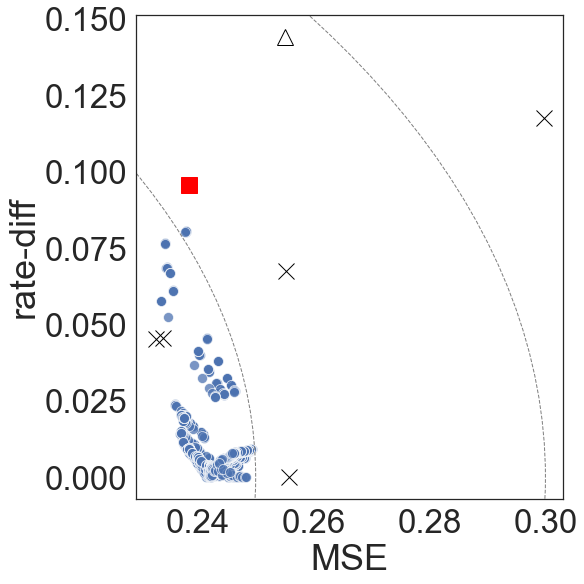

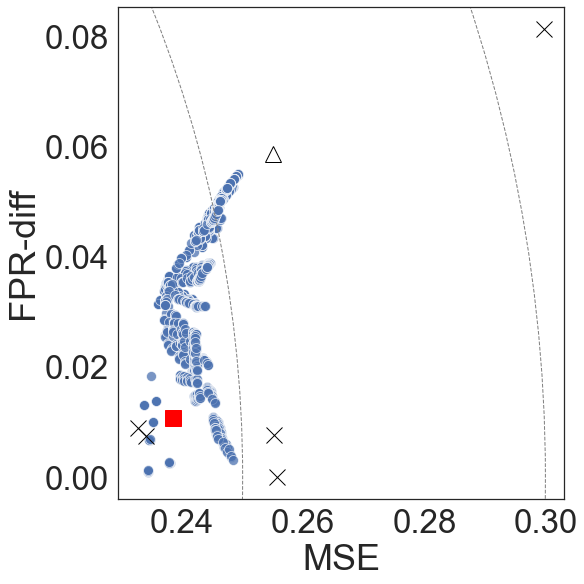

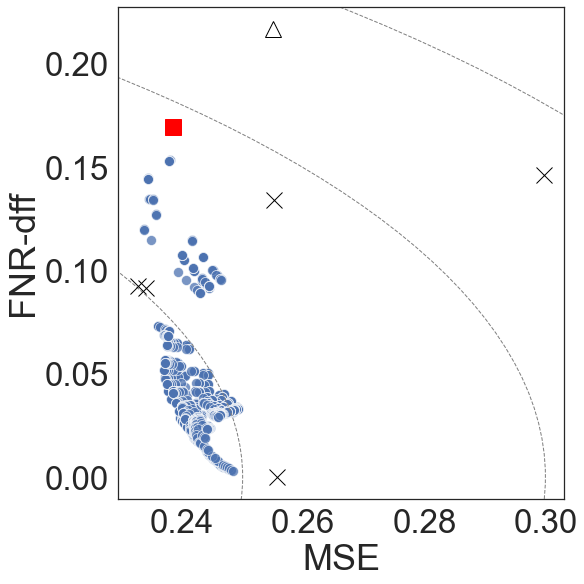

In [40]:
sns.set(font_scale = 3, style = 'white')
fig, ax = compas_deciles.plot_two_criteria('error_mse', 'rate_diff')
fig.set_tight_layout(True)
fig.savefig('leastsquares/compas/compas_deciles_MSE_rate-diff.pdf')

fig, ax = compas_deciles.plot_two_criteria('error_mse', 'cFPR_diff')
fig.set_tight_layout(True)
fig.savefig('leastsquares/compas/compas_deciles_MSE_cFPR-diff.pdf')

fig, ax = compas_deciles.plot_two_criteria('error_mse', 'cFNR_diff')
fig.set_tight_layout(True)
fig.savefig('leastsquares/compas/compas_deciles_MSE_cFNR-diff.pdf')

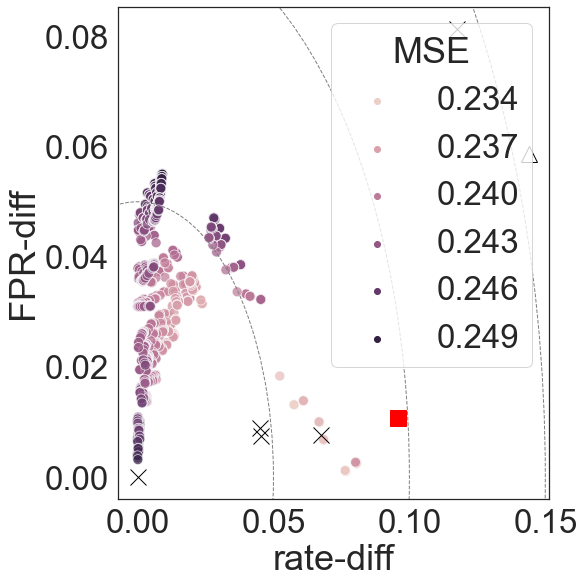

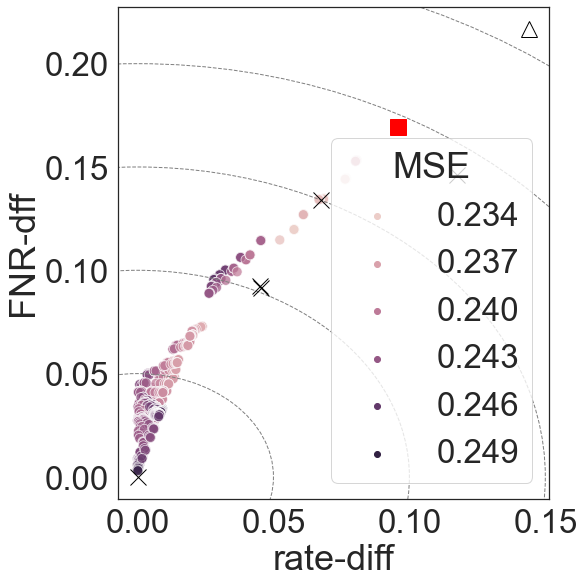

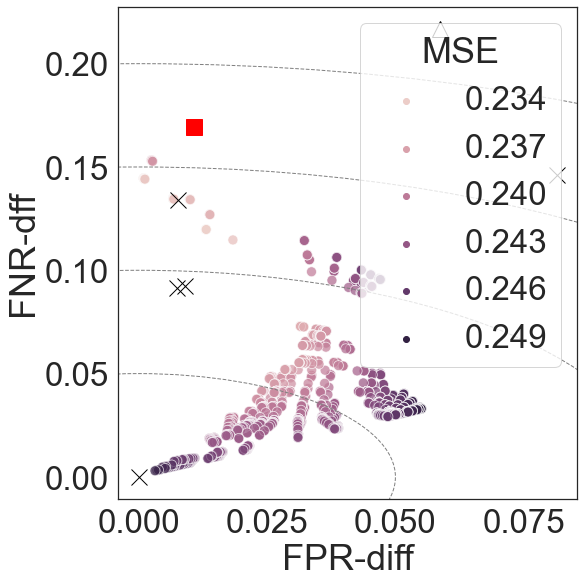

In [41]:
sns.set(font_scale = 3, style = 'white')
fig, ax = compas_deciles.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/compas/compas_deciles_rate_cFPR_MSE.pdf')

fig, ax = compas_deciles.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/compas/compas_deciles_rate_cFNR_MSE.pdf')

fig, ax = compas_deciles.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/compas/compas_deciles_cFPR_cFNR_MSE.pdf')

In [42]:
perf = compas_deciles.results[('independence', 'cFPR', 'cFNR')]['performance']
min_rate = get_closest_to_origin(['error_mse', 'rate_diff'], perf)
min_FPR = get_closest_to_origin(['error_mse', 'cFPR_diff'], perf)
min_FNR = get_closest_to_origin(['error_mse', 'cFNR_diff'], perf)
min_rate_FPR = get_closest_to_origin(['error_mse', 'rate_diff', 'cFPR_diff'], perf)
min_rate_FNR = get_closest_to_origin(['error_mse', 'rate_diff', 'cFNR_diff'], perf)
min_FPR_FNR = get_closest_to_origin(['error_mse', 'cFPR_diff', 'cFNR_diff'], perf)
min_all = get_closest_to_origin(['error_mse', 'rate_diff', 'cFPR_diff', 'cFNR_diff'], perf)

idx = [min_rate, min_FPR, min_FNR, min_rate_FPR, min_rate_FNR, min_FPR_FNR, min_all]
tmp = compas_deciles.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[idx][['error_mse', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
tmp.index = ['MSE + rate-diff', 'MSE + FPR-diff', 'MSE + FNR-diff', 'MSE + rate-diff + FPR-diff',
            'MSE + rate-diff + FNR-diff', 'MSE + FPR-diff + FNR-diff', 'MSE + rate-diff + FPR-diff + FNR-diff']
tmp.columns = ['MSE', 'rate-diff', 'FPR-diff', 'FNR-diff']

# with open('leastsquares/compas/compas_deciles_best_performance.tex', 'w') as file_out:
#     file_out.write(tmp.to_latex(index=True, float_format='%0.2f'))

In [43]:
compas_deciles.results[('independence', 'cFPR', 'cFNR')]['betahats'][idx[6]]

array([ 0.5055518 , -0.06984677,  1.20717258,  0.07827072, -0.67956071,
       -0.09658823])

In [ ]:
## Look at distribution of predictions for the model that minimizes all disparities vs. COMPAS

In [44]:
preds = np.matmul(compas_deciles.basis_preds_test,
                  compas_deciles.results[('independence', 'cFPR', 'cFNR')]['betahats'][min_all])

In [45]:
df = pd.DataFrame({'race': compas_test_target['race'], 'Best': preds, 'D': compas_test_target[D], 'Y': compas_test_target[Y],
                      'COMPAS': compas_test_target[R]})

df_long = df.melt(['race', 'D', 'Y'], var_name = 'model', value_name = 'prediction')

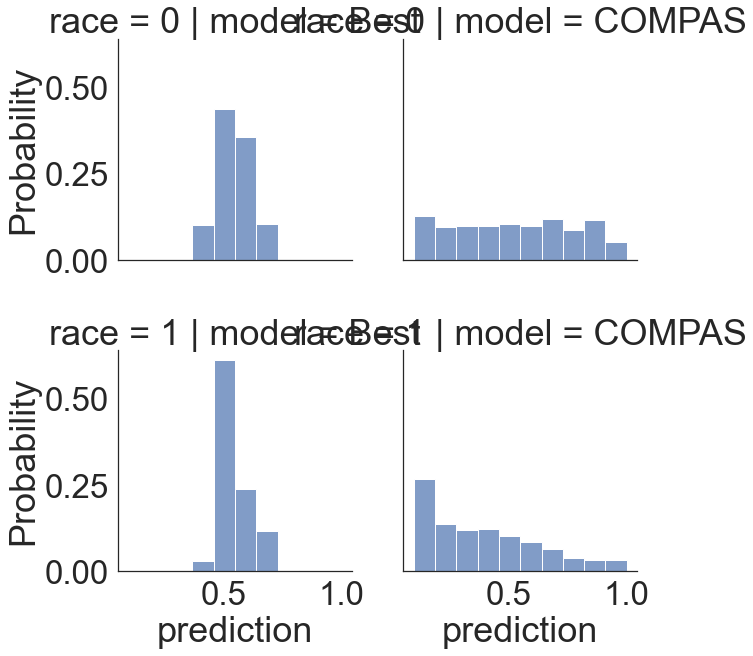

In [46]:
g = sns.displot(df_long, row='race', col='model', x='prediction', bins=10,
           stat='probability', common_norm=False, alpha=0.7, palette='colorblind')

g.savefig('leastsquares/compas/compas_model_histograms.pdf')

In [659]:
df0 = df_long.loc[df_long.D == 0]

In [663]:
def get_calibration(df, Y='Y', preds='prediction'):
    true_prob, pred_prob = calibration_curve(
        df[Y], df[preds], n_bins=10)
    out = pd.DataFrame({'Predicted': pred_prob, 'True': true_prob})
    return out

In [665]:
cal = df0.groupby(['race', 'model']).apply(get_calibration).reset_index()

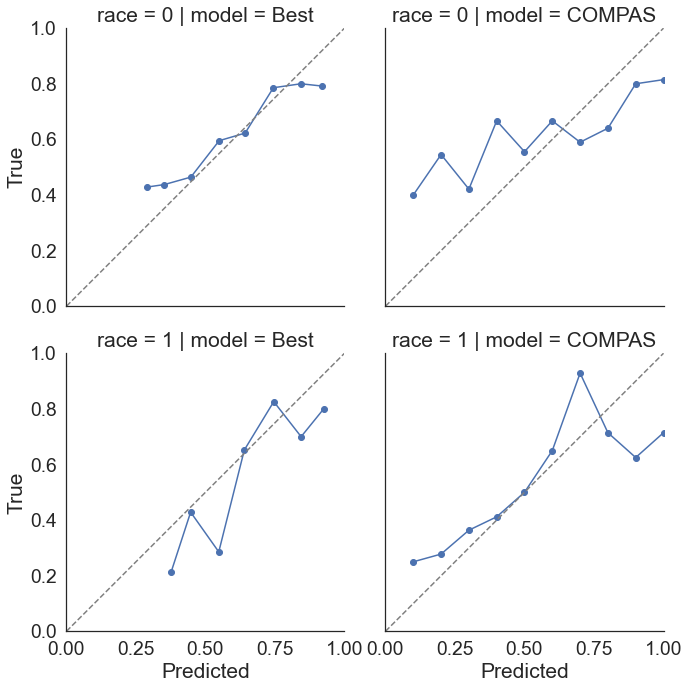

In [698]:
g = sns.FacetGrid(data = cal, row='race', col='model', height=5)
g.map_dataframe(plt.scatter, 'Predicted', 'True')
g.map_dataframe(plt.plot, 'Predicted', 'True')
for ax in g.axes.ravel():
    ax.set_aspect('equal', adjustable='box')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.plot([0, 1], [0, 1], linestyle='--', color='grey')

g.savefig('leastsquares/compas/compas_best_model_calibration.pdf')


## Minimize MSE - Fourier series

In [475]:
compas_fourier = FairPredictor(data_basis=compas_basis,
                               data_train_nuis=compas_train_nuis,
                               data_train_target=compas_train_target,
                               data_test_nuis=compas_test_nuis,
                               data_test_target=compas_test_target,
                               covariates=X, protected=A, decision=D,
                               outcome=Y, predictors=R, outcome_bounds=(0, 1),
                               learners_basis=None,
                               learner_pi_train=learner_pi_train,
                               learner_mu_train=learner_mu_train,
                               learner_pi_test=learner_pi_test,
                               learner_mu_test=learner_mu_test)

In [476]:
min_max_scaler = preprocessing.MinMaxScaler((0, 2*np.pi))

fourier_cols = ['score_decile', 'incarceration_duration']
fourier_dat_train = min_max_scaler.fit_transform(compas_train_target[fourier_cols])
fourier_dat_train = pd.DataFrame(fourier_dat_train, columns = fourier_cols)
fourier_preds_train = get_fourier(fourier_dat_train, fourier_cols)
# fourer_preds_train = np.clip(fourier_preds_train, 0, 1)

fourier_dat_test = min_max_scaler.fit_transform(compas_test_target[fourier_cols])
fourier_dat_test = pd.DataFrame(fourier_dat_test, columns = fourier_cols)
fourier_preds_test = get_fourier(fourier_dat_test, fourier_cols)
# fourier_preds_test = np.clip(fourier_preds_test, 0, 1)

compas_fourier.basis_preds_train = np.concatenate([fourier_preds_train, np.expand_dims(compas_train_target[R], axis=1)], axis = 1)
compas_fourier.basis_preds_test = np.concatenate([fourier_preds_test, np.expand_dims(compas_test_target[R], axis=1)], axis = 1)

Q0 = np.matmul(np.transpose(compas_fourier.basis_preds_train),
               compas_fourier.basis_preds_train)/len(compas_fourier.basis_preds_train)
compas_fourier.Q0_inv = np.linalg.inv(Q0)

In [477]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
compas_fourier.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                       phihat_train='phihat', phibarhat_train='phihat',
                       phihat_test='phihat', phibarhat_test='phihat',
                       counterfactual=True, continuous=True, recompute=False)


NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:136: UserWarning: Training data nuisance learners have already been fit. Set recompute=True to recompute them.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:153: UserWarning: Test data nuisance learners have already been fit. Set recompute=True to recompute them.



BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [479]:
compas_fourier.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
learner0,0.000000,0.499313,0.499313,NaN,0.640738,0.000000,2.119517e-15,1.520669e-15
learner1,0.037905,0.368613,0.463698,NaN,0.450412,0.010142,2.605610e-02,3.948269e-02
learner2,0.030369,0.517360,0.565671,NaN,0.555203,0.013326,9.688420e-02,1.393147e-01
learner3,0.109957,0.367911,0.442320,NaN,0.445415,0.065817,8.433637e-02,7.966462e-04
learner4,0.019542,0.402813,0.496914,NaN,0.387366,0.009766,1.284993e-02,3.849865e-03
score_decile,0.077076,0.207333,0.379492,NaN,0.229622,0.158814,1.100619e-01,1.236677e-01


(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_mse', ylabel='cFNR_diff'>)

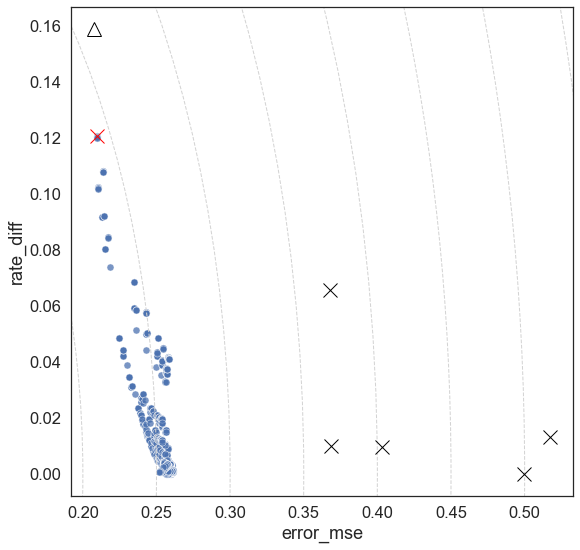

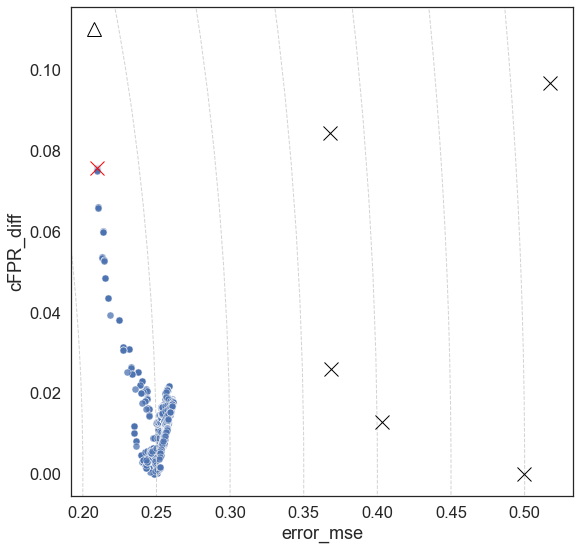

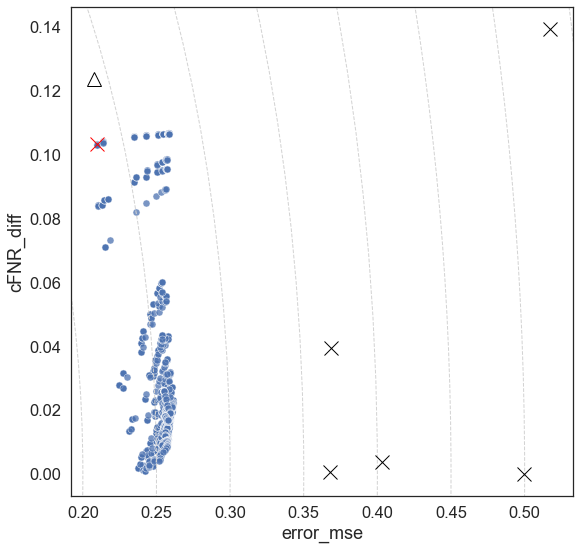

In [488]:
compas_fourier.plot_two_criteria('error_mse', 'rate_diff')
compas_fourier.plot_two_criteria('error_mse', 'cFPR_diff')
compas_fourier.plot_two_criteria('error_mse', 'cFNR_diff')

## Minimize MSE - Learners + Fourier series

In [481]:
compas_comb = FairPredictor(data_basis=compas_basis,
                               data_train_nuis=compas_train_nuis,
                               data_train_target=compas_train_target,
                               data_test_nuis=compas_test_nuis,
                               data_test_target=compas_test_target,
                               covariates=X, protected=A, decision=D,
                               outcome=Y, predictors=R, outcome_bounds=(0, 1),
                               learners_basis=learners_basis,
                               learner_pi_train=learner_pi_train,
                               learner_mu_train=learner_mu_train,
                               learner_pi_test=learner_pi_test,
                               learner_mu_test=learner_mu_test)

In [482]:
compas_comb.predict_basis_train(continuous=True, recompute=False)
compas_comb.predict_basis_test(continuous=True, recompute=False)

In [483]:
min_max_scaler = preprocessing.MinMaxScaler((0, 2*np.pi))

fourier_cols = ['score_decile', 'incarceration_duration']
fourier_dat_train = min_max_scaler.fit_transform(compas_train_target[fourier_cols])
fourier_dat_train = pd.DataFrame(fourier_dat_train, columns = fourier_cols)
fourier_preds_train = get_fourier(fourier_dat_train, fourier_cols)
# fourer_preds_train = np.clip(fourier_preds_train, 0, 1)

fourier_dat_test = min_max_scaler.fit_transform(compas_test_target[fourier_cols])
fourier_dat_test = pd.DataFrame(fourier_dat_test, columns = fourier_cols)
fourier_preds_test = get_fourier(fourier_dat_test, fourier_cols)
# fourier_preds_test = np.clip(fourier_preds_test, 0, 1)

compas_comb.basis_preds_train = np.concatenate([fourier_preds_train, compas_comb.basis_preds_train], axis = 1)
compas_comb.basis_preds_test = np.concatenate([fourier_preds_test, compas_comb.basis_preds_test], axis = 1)

Q0 = np.matmul(np.transpose(compas_comb.basis_preds_train),
               compas_comb.basis_preds_train)/len(compas_comb.basis_preds_train)
compas_comb.Q0_inv = np.linalg.inv(Q0)

In [484]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
compas_comb.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                                 phihat_train='phihat', phibarhat_train='phihat',
                                 phihat_test='phihat', phibarhat_test='phihat',
                                 counterfactual=True, continuous=True, recompute=False)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:86: UserWarning: Basis learners have already been fit.                     Set recompute=True to recompute them.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:105: UserWarning: Basis predictions on the training data have already             been generated. Set recompute=True to regenerate them.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:119: UserWarning: Basis predictions on the test data have already             been generated. Set recompute=True to regenerate them.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:136: UserWarning: Training data nuisance learners have already been fit. Set recompute=True to recompute them.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:153: UserWarning: Test data nuisance learners have already been fit. Set recompute=True to recompute them.



BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_mse', ylabel='cFNR_diff'>)

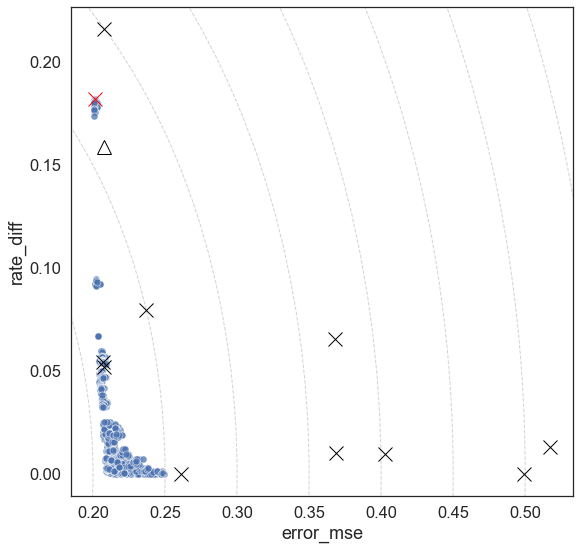

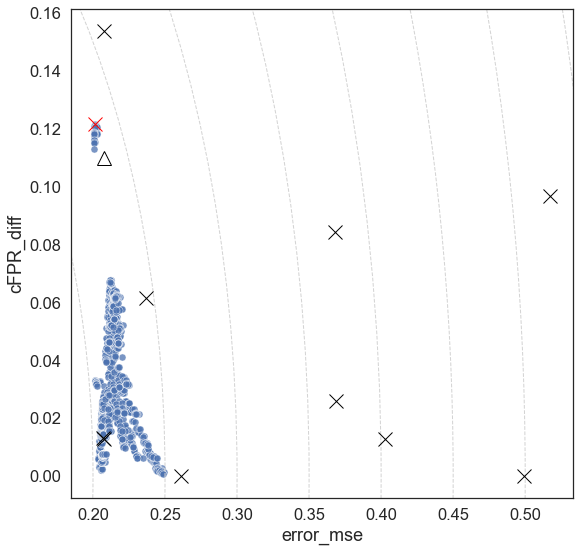

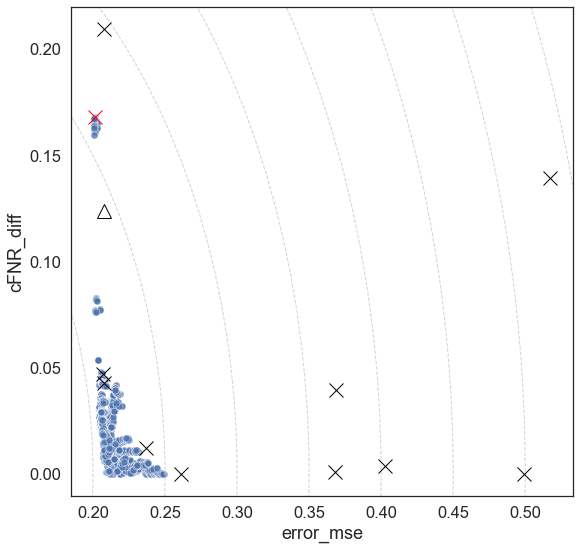

In [485]:
compas_comb.plot_two_criteria('error_mse', 'rate_diff')
compas_comb.plot_two_criteria('error_mse', 'cFPR_diff')
compas_comb.plot_two_criteria('error_mse', 'cFNR_diff')

## Minimize MSE - observable

In [489]:
A = 'race'
X = ['age_greater_than_45', 'age_less_than_25', 'priors_count']
R = 'score_decile'
D = 'released'
Y = 'two_year_recid'

In [490]:
# Specify learners
learners_basis = [DummyRegressor(strategy='mean'),
                 RandomForestClassifier(),
                  LogisticRegression(),
#                   svm.NuSVC(probability=True),
                                      GradientBoostingClassifier(),
                  GaussianNB(),
                  Ridge(alpha=1)]

In [491]:
compas_obs = FairPredictor(data_basis=compas_basis,
                           data_train_nuis=None,
                           data_train_target=compas_train_target,
                           data_test_nuis=None,
                           data_test_target=compas_test_target,
                           covariates=X, protected=A, decision=D,
                           outcome=Y, predictors=R, outcome_bounds=(0, 1),
                           learners_basis=learners_basis,
                           learner_pi_train=None,
                           learner_mu_train=None,
                           learner_pi_test=None,
                           learner_mu_test=None)

In [492]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
compas_obs.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                             phihat_train='two_year_recid', phibarhat_train='two_year_recid',
                             phihat_test='two_year_recid', phibarhat_test='two_year_recid',
                             counterfactual=False, continuous=True, recompute=True)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [493]:
compas_obs.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
learner0,1.232595e-32,0.250845,0.497968,0.500000,0.143513,1.110223e-16,6.728624e-18,1.345725e-17
learner1,9.521412e-02,0.273175,0.426454,0.629889,0.224429,1.091634e-01,8.700890e-02,9.319769e-02
learner2,3.642270e-02,0.214260,0.426229,0.721482,0.140639,1.237654e-01,8.788082e-02,1.250508e-01
learner3,9.742656e-02,0.234421,0.381953,0.717376,0.192961,2.819671e-01,2.214450e-01,2.919251e-01
learner4,3.516024e-02,0.215335,0.428390,0.718213,0.140047,1.202526e-01,8.560987e-02,1.213576e-01
score_decile,7.707630e-02,0.235038,0.407197,0.691124,0.181578,1.588142e-01,1.196350e-01,1.527591e-01


(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_mse', ylabel='cFNR_diff'>)

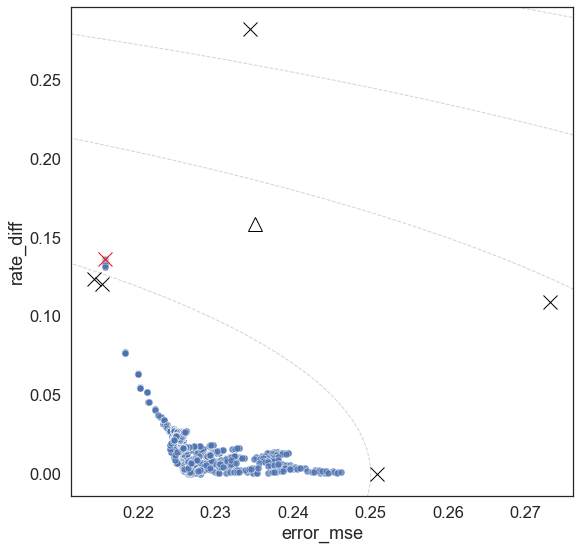

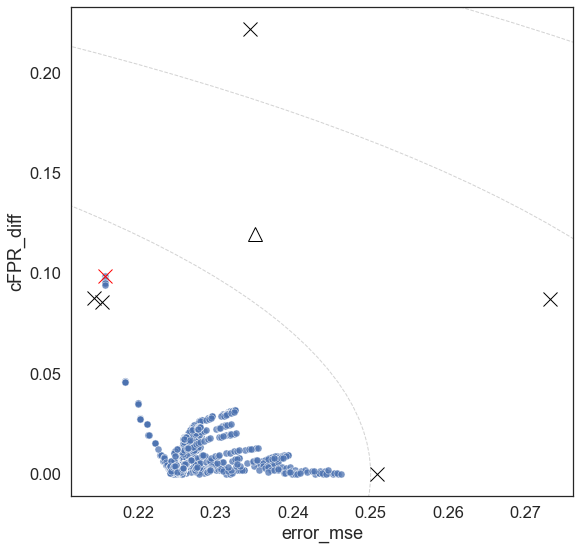

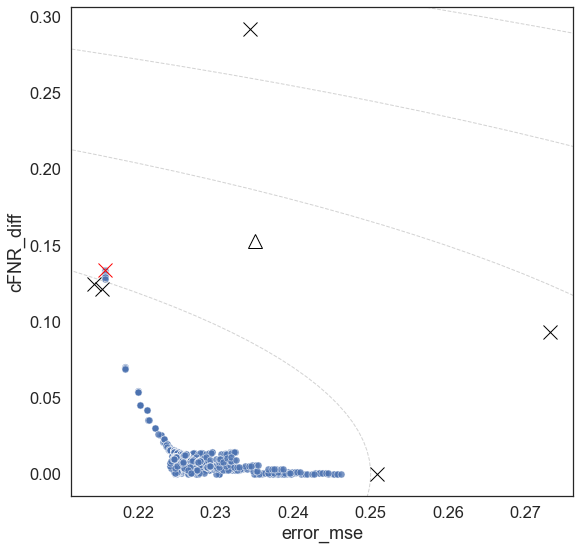

In [494]:
compas_obs.plot_two_criteria('error_mse', 'rate_diff')
compas_obs.plot_two_criteria('error_mse', 'cFPR_diff')
compas_obs.plot_two_criteria('error_mse', 'cFNR_diff')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_logistic', ylabel='cFNR_diff'>)

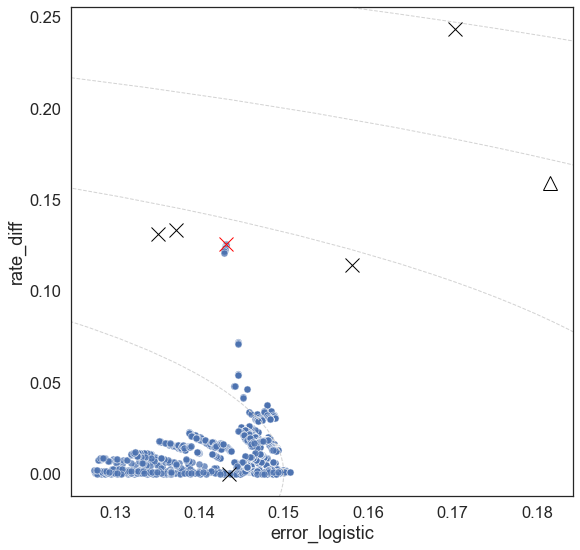

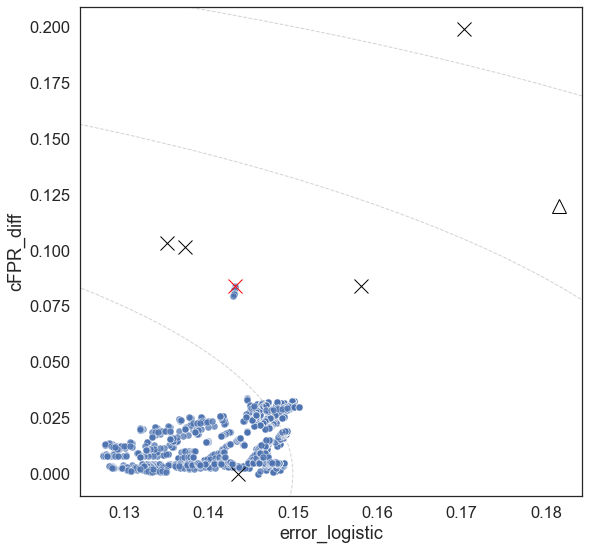

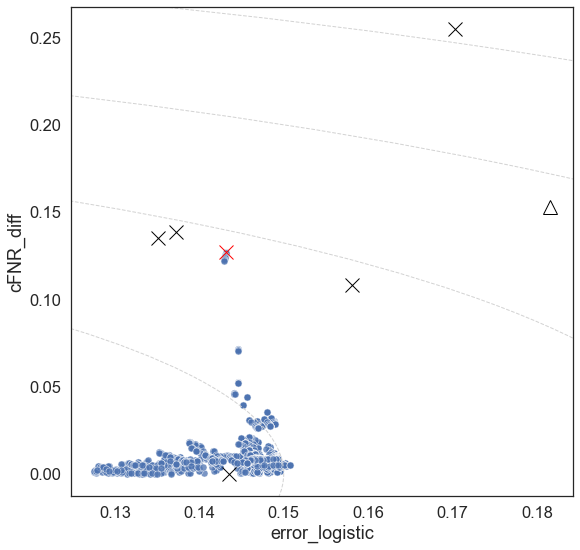

In [461]:
compas_obs.plot_two_criteria('error_logistic', 'rate_diff')
compas_obs.plot_two_criteria('error_logistic', 'cFPR_diff')
compas_obs.plot_two_criteria('error_logistic', 'cFNR_diff')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='cFPR_diff', ylabel='cFNR_diff'>)

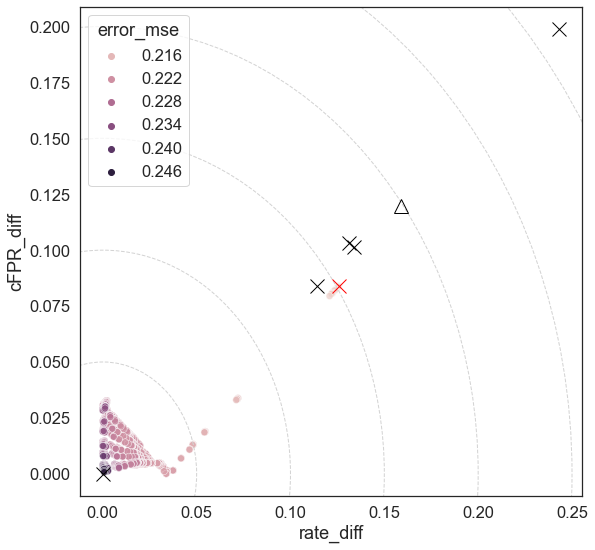

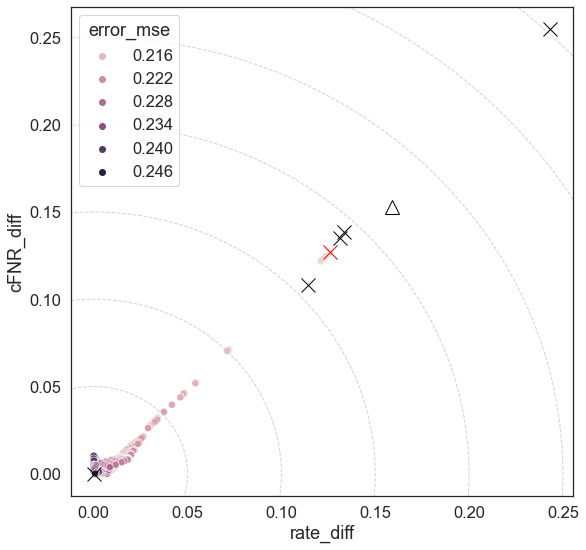

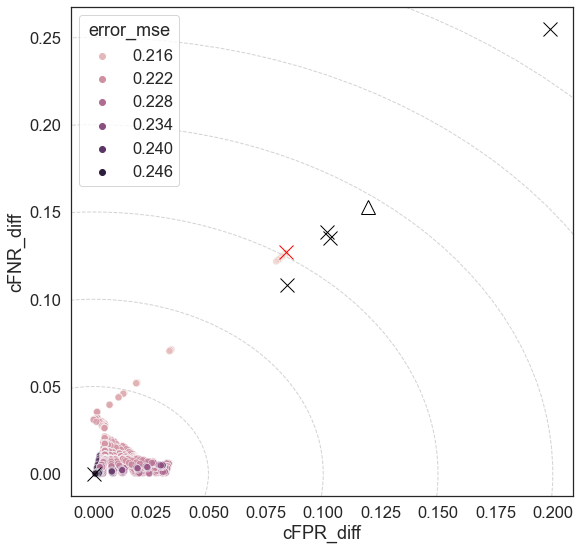

In [462]:
compas_obs.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
compas_obs.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
compas_obs.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')

In [ ]:
compas_obs.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_auc')
compas_obs.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_auc')
compas_obs.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_auc')

## Minimize Bernoulli 0-1 loss

In [519]:
A = 'race'
X = ['age_greater_than_45', 'age_less_than_25', 'priors_count']
R = 'score_decile'
D = 'released'
Y = 'two_year_recid'

In [520]:
compas_binary = FairPredictor(data_basis=compas_basis,
                              data_train_nuis=compas_train_nuis,
                              data_train_target=compas_train_target,
                              data_test_nuis=compas_test_nuis,
                              data_test_target=compas_test_target,
                              covariates=X, protected=A, decision=D,
                              outcome=Y, predictors=R, outcome_bounds=(0, 1),
                              learners_basis=learners_basis,
                              learner_pi_train=learner_pi_train,
                              learner_mu_train=learner_mu_train,
                              learner_pi_test=learner_pi_test,
                              learner_mu_test=learner_mu_test)

### Smoothing $\lambda = 0.1$

In [528]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
compas_binary.simulate_fairness(lambdas=lambdas, loss='0-1', lambda_smooth=0.1,
                                constraints='all', phihat_train='phihat', phibarhat_train='phihat',
                                phihat_test='phihat', phibarhat_test='phihat',
                                counterfactual=False, continuous=True, recompute=True)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [530]:
compas_binary.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_threshold_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,rate_diff_binary,cFPR_diff_binary,cFNR_diff_binary
learner0,0.059007,0.250525,0.440401,0.407530,NaN,0.135427,0.161426,0.086684,0.285913,0.303045,0.221092
learner1,0.036908,0.244941,0.456560,0.430417,NaN,0.137571,0.140357,0.112684,0.308571,0.319040,0.258724
learner2,0.000002,0.262408,0.510425,0.616175,NaN,0.000224,0.000267,0.000159,0.000000,0.000000,0.000000
learner3,0.066530,0.273049,0.449639,0.432750,NaN,0.245995,0.233579,0.226253,0.481943,0.459112,0.463163
learner4,0.032552,0.245140,0.460914,0.426933,NaN,0.139010,0.139800,0.117575,0.302124,0.312777,0.245563
score_decile,0.082820,0.251105,0.416872,0.363711,NaN,0.175708,0.144792,0.153476,0.259354,0.173659,0.238458


In [531]:
compas_binary.results[constraints]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_threshold_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,rate_diff_binary,cFPR_diff_binary,cFNR_diff_binary,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.0,0.383825,0.383825,0.383825,NaN,0.0,6.728624e-17,1.413011e-16,0.0,6.728624e-17,1.413011e-16,0.0,0.000,0.0,
1,0.0,0.383825,0.383825,0.383825,NaN,0.0,6.728624e-17,1.413011e-16,0.0,6.728624e-17,1.413011e-16,0.0,0.001,0.0,cFPR
2,0.0,0.383825,0.383825,0.383825,NaN,0.0,6.728624e-17,1.413011e-16,0.0,6.728624e-17,1.413011e-16,0.0,0.010,0.0,cFPR
3,0.0,0.383825,0.383825,0.383825,NaN,0.0,6.728624e-17,1.413011e-16,0.0,6.728624e-17,1.413011e-16,0.0,1.000,0.0,cFPR
4,0.0,0.383825,0.383825,0.383825,NaN,0.0,6.728624e-17,1.413011e-16,0.0,6.728624e-17,1.413011e-16,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.0,0.383825,0.383825,0.383825,NaN,0.0,6.728624e-17,1.413011e-16,0.0,6.728624e-17,1.413011e-16,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.0,0.383825,0.383825,0.383825,NaN,0.0,6.728624e-17,1.413011e-16,0.0,6.728624e-17,1.413011e-16,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.0,0.383825,0.383825,0.383825,NaN,0.0,6.728624e-17,1.413011e-16,0.0,6.728624e-17,1.413011e-16,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.0,0.383825,0.383825,0.383825,NaN,0.0,6.728624e-17,1.413011e-16,0.0,6.728624e-17,1.413011e-16,2000.0,1000.000,2000.0,ind_cFPR_cFNR


(<Figure size 1080x360 with 3 Axes>,
 array([<AxesSubplot:xlabel='lambda_independence', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFPR', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFNR', ylabel='value'>], dtype=object))

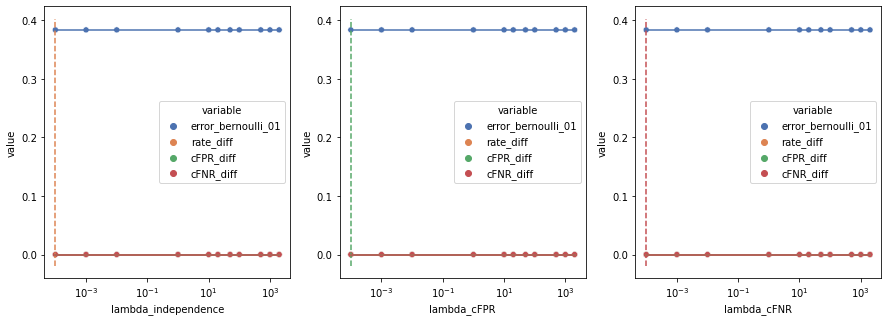

In [529]:
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
compas_binary.plot_one_constraint(fairness, 'error_bernoulli_01')

### Smoothing $\lambda = 1$

In [521]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
compas_binary.simulate_fairness(lambdas=lambdas, loss='0-1', lambda_smooth=1,
                                constraints='all', phihat_train='phihat', phibarhat_train='phihat',
                                phihat_test='phihat', phibarhat_test='phihat',
                                counterfactual=False, continuous=True, recompute=True)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...


<ipython-input-472-d83a345f7d32>:80: UserWarning: Basis learners have already been fit.                     Set recompute=True to recompute them.
  warnings.warn("Basis learners have already been fit. \



NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...


<ipython-input-472-d83a345f7d32>:130: UserWarning: Training data nuisance learners have already been fit. Set recompute=True to recompute them.
  warnings.warn(
<ipython-input-472-d83a345f7d32>:147: UserWarning: Test data nuisance learners have already been fit. Set recompute=True to recompute them.
  warnings.warn(



FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


(<Figure size 1080x360 with 3 Axes>,
 array([<AxesSubplot:xlabel='lambda_independence', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFPR', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFNR', ylabel='value'>], dtype=object))

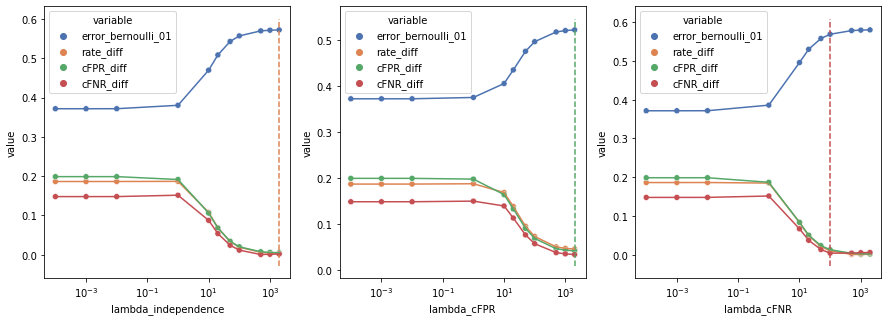

In [523]:
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
compas_binary.plot_one_constraint(fairness, 'error_bernoulli_01')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_bernoulli_01', ylabel='cFNR_diff'>)

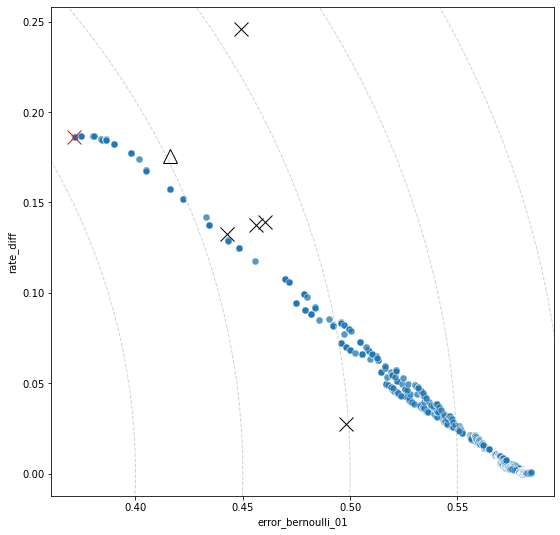

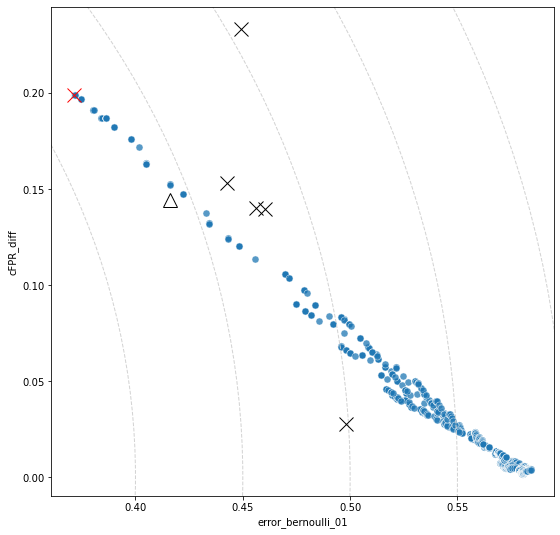

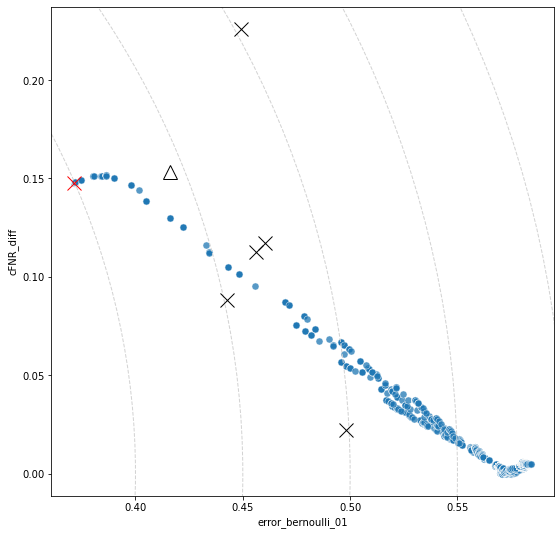

In [524]:
compas_binary.plot_two_criteria('error_bernoulli_01', 'rate_diff')
compas_binary.plot_two_criteria('error_bernoulli_01', 'cFPR_diff')
compas_binary.plot_two_criteria('error_bernoulli_01', 'cFNR_diff')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='cFPR_diff', ylabel='cFNR_diff'>)

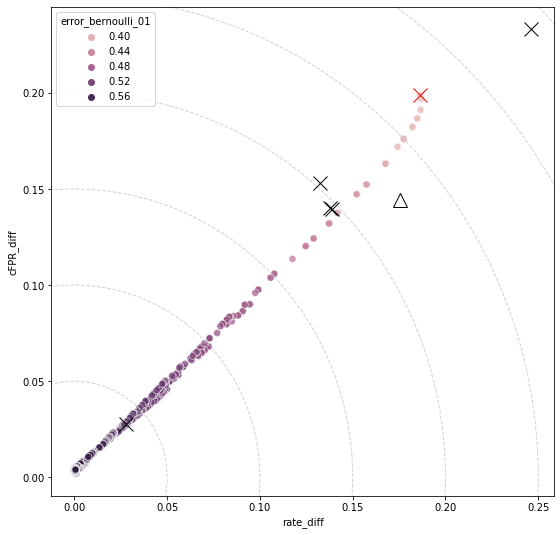

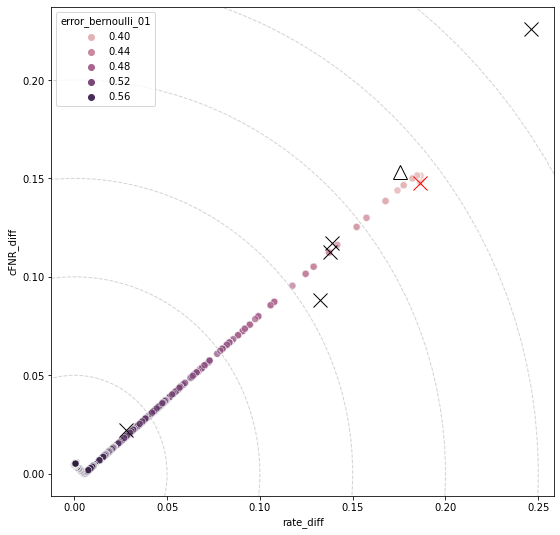

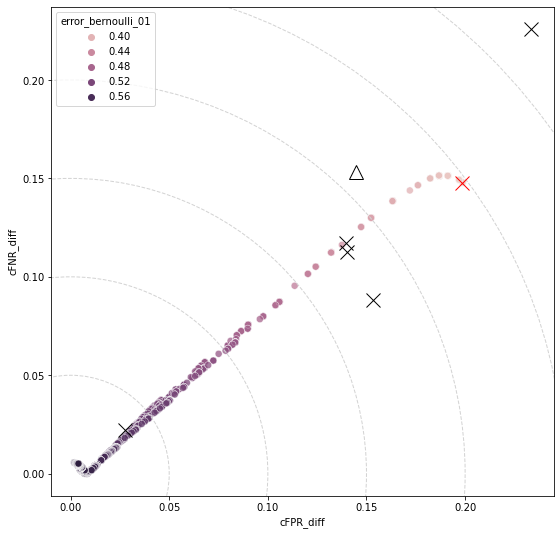

In [526]:
compas_binary.plot_two_criteria(
    'rate_diff', 'cFPR_diff', hue='error_bernoulli_01')
compas_binary.plot_two_criteria(
    'rate_diff', 'cFNR_diff', hue='error_bernoulli_01')
compas_binary.plot_two_criteria(
    'cFPR_diff', 'cFNR_diff', hue='error_bernoulli_01')

# Adult dataset: sex
Observable outcome and fairness constraints

In [715]:
data_adult_basis = pd.read_csv('data/split/data_adult_basis.csv')
data_adult_train = pd.read_csv('data/split/data_adult_betahats.csv')
data_adult_test = pd.read_csv('data/split/data_adult_test.csv')
data_adult_validate = pd.read_csv('data/split/data_adult_validate.csv')

In [712]:
data_adult_basis.shape

(14653, 20)

In [713]:
data_adult_train.shape

(14652, 20)

In [714]:
data_adult_test.shape

(9768, 23)

In [792]:
data_adult_validate.head()

,Unnamed: 0,race,sex,Age (decade)=10,Age (decade)=20,Age (decade)=30,Age (decade)=40,Age (decade)=50,Age (decade)=60,Age (decade)=>=70,Education Years=6,Education Years=7,Education Years=8,Education Years=9,Education Years=10,Education Years=11,Education Years=12,Education Years=<6,Education Years=>12,Income Binary
0,35708,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,36189,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,34801,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,15462,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2479,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [707]:
A = 'sex'
X_cols = [1] + list(range(3, data_adult_basis.shape[1] - 1))
X = data_adult_basis.columns[X_cols].to_list()
pred_cols = [A] + X
Y = 'Income Binary'

In [512]:
# Specify learners
learners_basis = [DummyRegressor(strategy='mean'),
                  RandomForestClassifier(),
                  LogisticRegression(),
                  GradientBoostingClassifier(),
                  #                   svm.NuSVC(probability=True),
                  #                   GaussianNB(),
                  Ridge(alpha=1)]

In [513]:
adult_binary1 = FairPredictor(data_basis=data_adult_basis,
                             data_train_target=data_adult_train,
                             data_test_target=data_adult_test,
                             covariates=X, protected=A,
                             outcome=Y, predictors=None, outcome_bounds=(0, 1),
                             learners_basis=learners_basis)

## Minimize MSE

In [839]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
adult_binary1.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                               phihat_train=Y, phibarhat_train=Y,
                               phihat_test=Y, phibarhat_test=Y,
                               counterfactual=False, continuous=True, recompute=True)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [505]:
adult_binary1.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
learner0,7.703720e-34,0.181596,0.365137,0.500000,0.137386,5.551115e-17,1.454838e-17,1.454838e-17
learner1,4.888275e-02,0.138866,0.273236,0.811104,0.101156,1.938939e-01,1.370949e-01,2.415645e-01
learner2,4.647897e-02,0.137809,0.274761,0.814421,0.100014,1.952148e-01,1.388579e-01,2.459098e-01
learner3,4.558568e-02,0.137891,0.275772,0.815183,0.100677,1.889063e-01,1.332110e-01,2.373501e-01
learner4,3.651913e-02,0.140901,0.292847,0.808476,0.094623,1.709661e-01,1.311366e-01,1.647493e-01


In [743]:
adult_binary1.results[('independence', 'cFPR', 'cFNR')]['betahats'][0]

array([0.02578849, 0.2858965 , 0.65104853, 0.02714836, 0.00535026])

In [576]:
adult_binary1.results[constraints]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_threshold_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,rate_diff_binary,cFPR_diff_binary,cFNR_diff_binary,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.044840,0.137728,0.274579,0.195434,0.814803,0.190815,0.135972,0.237101,0.213527,0.107205,0.460222,0.0,0.000,0.0,
1,0.044823,0.137728,0.274575,0.195434,0.814803,0.190779,0.135947,0.237049,0.213527,0.107205,0.460222,0.0,0.001,0.0,cFPR
2,0.044674,0.137728,0.274540,0.195434,0.814800,0.190457,0.135729,0.236581,0.213527,0.107205,0.460222,0.0,0.010,0.0,cFPR
3,0.031945,0.139945,0.271262,0.203726,0.813974,0.160459,0.115353,0.192983,0.135729,0.060330,0.310675,0.0,1.000,0.0,cFPR
4,0.005993,0.177650,0.261685,0.238124,0.791752,0.060136,0.046189,0.050331,0.000758,0.000217,0.002014,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.000135,0.235227,0.240702,0.238432,0.574619,0.000791,0.000925,0.002905,0.000000,0.000000,0.000000,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.000133,0.235250,0.240681,0.238432,0.574819,0.000781,0.000914,0.002878,0.000000,0.000000,0.000000,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.000120,0.235374,0.240573,0.238432,0.575397,0.000726,0.000857,0.002734,0.000000,0.000000,0.000000,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.000112,0.235451,0.240507,0.238432,0.575568,0.000693,0.000823,0.002646,0.000000,0.000000,0.000000,2000.0,1000.000,2000.0,ind_cFPR_cFNR


In [736]:
## Save results

adult_binary1.results['base_learners'].reset_index().to_csv('leastsquares/adult/adult_base_performance.csv',
                                                   index=False)

adult_binary1.results[('independence', 'cFPR', 'cFNR')]['performance'].to_csv('leastsquares/adult/adult_aggregated_performance.csv',
                                                                     index=False)

# Table with base learner and unpenalized least squares performance
base_perf = pd.concat([adult_binary1.results['base_learners'], adult_binary1.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[[0]]],
                      axis=0)
base_perf.index = ['Mean', 'Random Forest', 'Logistic', 'GB Classifier',
                   'Ridge', 'Least Squares']
base_perf = base_perf[['error_mse', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
base_perf.columns = ['MSE', 'rate-diff', 'FPR-diff', 'FNR-diff']

with open('leastsquares/adult/adult1_base_performance.tex', 'w') as file_out:
    file_out.write(base_perf.reset_index().to_latex(index=False, float_format='%0.2f'))

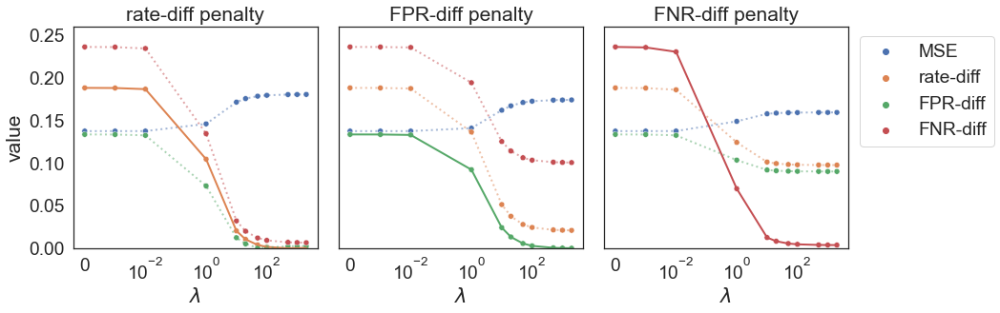

In [762]:
sns.set(font_scale = 1.75, style = 'white')
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
fig, ax = adult_binary1.plot_one_constraint(fairness, 'error_mse')
for axx in ax:
    axx.xaxis.set_ticks([0.0001, 0.01, 1, 100])
    xlabels = axx.xaxis.get_ticklabels()
    xlabels = [mpl.text.Text(1e-04, 0, '0'),
               mpl.text.Text(0.01, 0, '$\\mathdefault{10^{-2}}$'),
               mpl.text.Text(1.0, 0, '$\\mathdefault{10^{0}}$'),
              mpl.text.Text(100.0, 0, '$\\mathdefault{10^{2}}$')]
    axx.xaxis.set_ticklabels(xlabels)
    
fig.savefig('leastsquares/adult/adult_binary1_one_constraint.pdf')

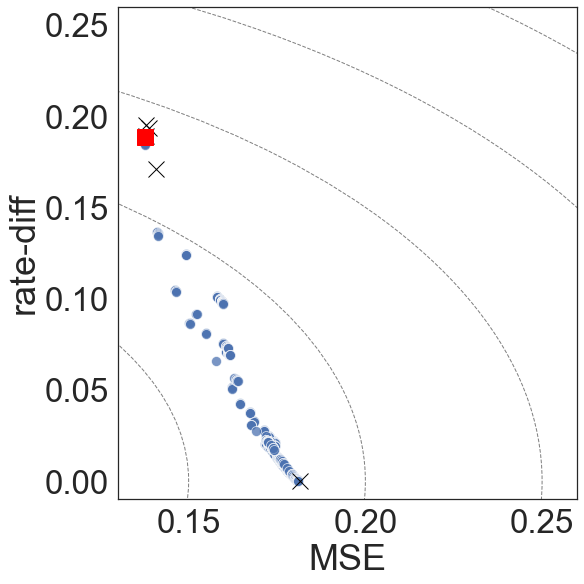

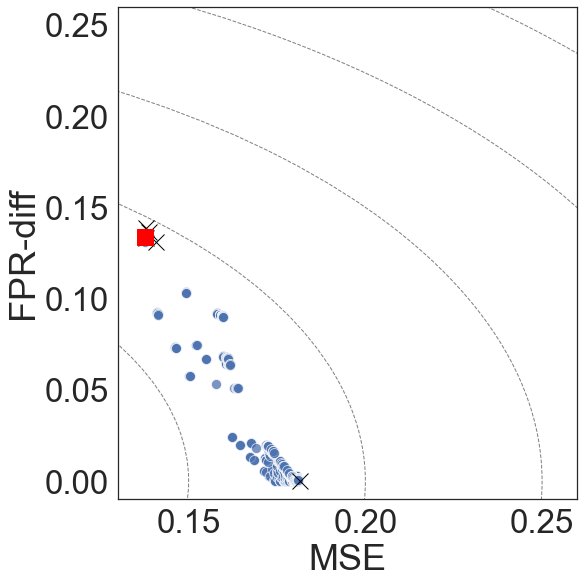

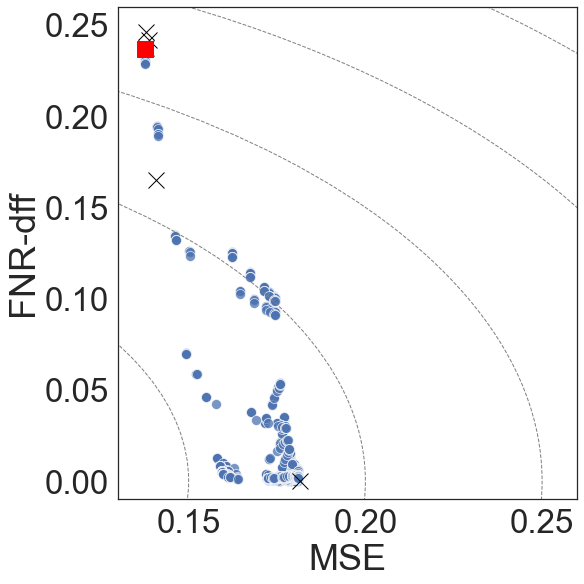

In [761]:
sns.set(font_scale = 3, style = 'white')
fig, ax = adult_binary1.plot_two_criteria('error_mse', 'rate_diff')
ax.set_xlim((0.13, 0.26))
ax.set_ylim((-0.01, 0.26))
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary1_MSE_rate-diff.pdf')

fig, ax = adult_binary1.plot_two_criteria('error_mse', 'cFPR_diff')
ax.set_xlim((0.13, 0.26))
ax.set_ylim((-0.01, 0.26))
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary1_MSE_cFPR-diff.pdf')

fig, ax = adult_binary1.plot_two_criteria('error_mse', 'cFNR_diff')
ax.set_xlim((0.13, 0.26))
ax.set_ylim((-0.01, 0.26))
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary1_MSE_cFNR-diff.pdf')

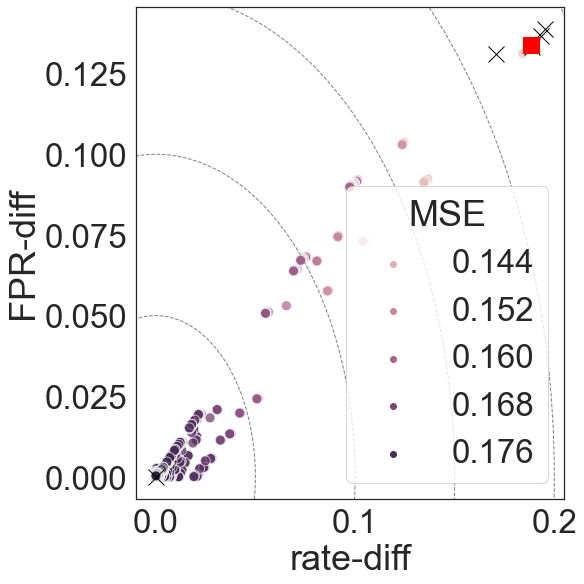

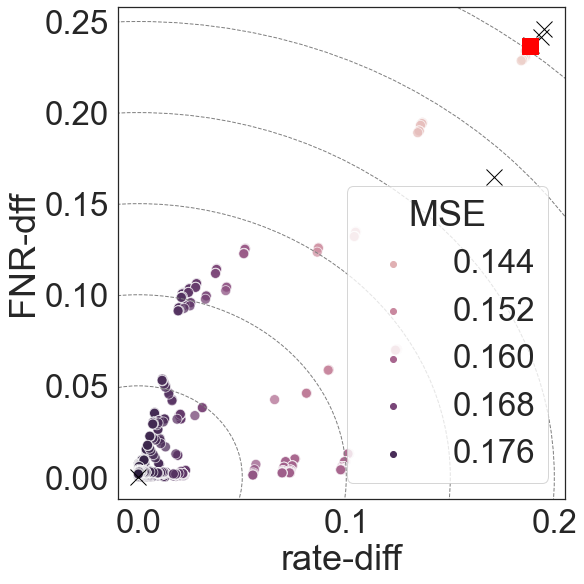

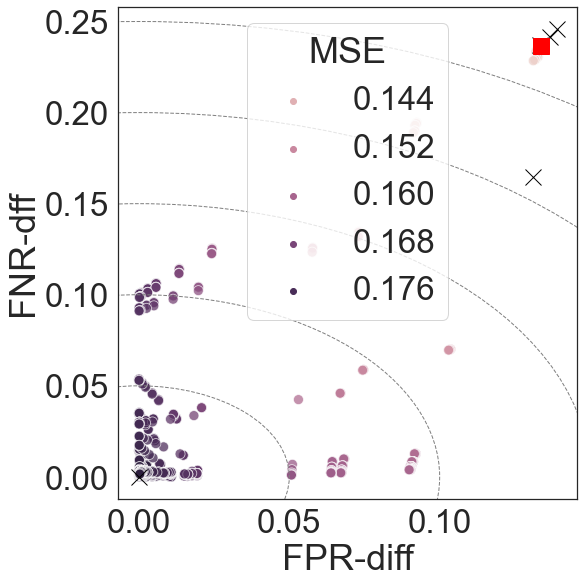

In [752]:
sns.set(font_scale = 3, style = 'white')
fig, ax = adult_binary1.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary1_rate_cFPR_MSE.pdf')

fig, ax = adult_binary1.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary1_rate_cFNR_MSE.pdf')

fig, ax = adult_binary1.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary1_cFPR_cFNR_MSE.pdf')

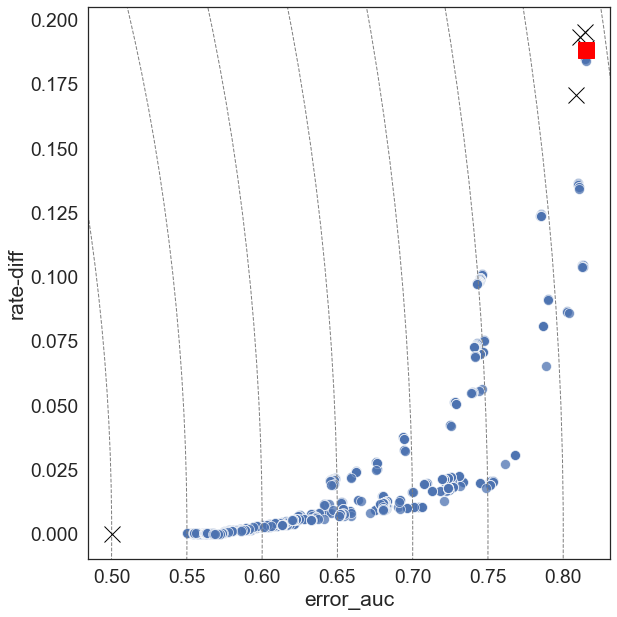

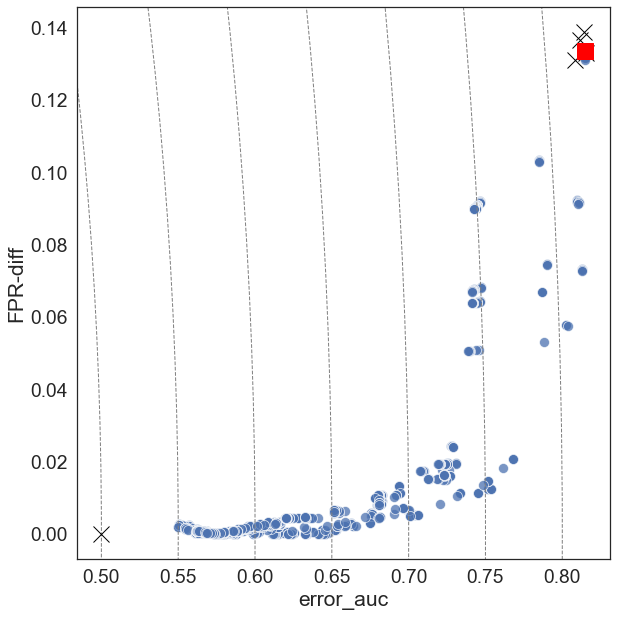

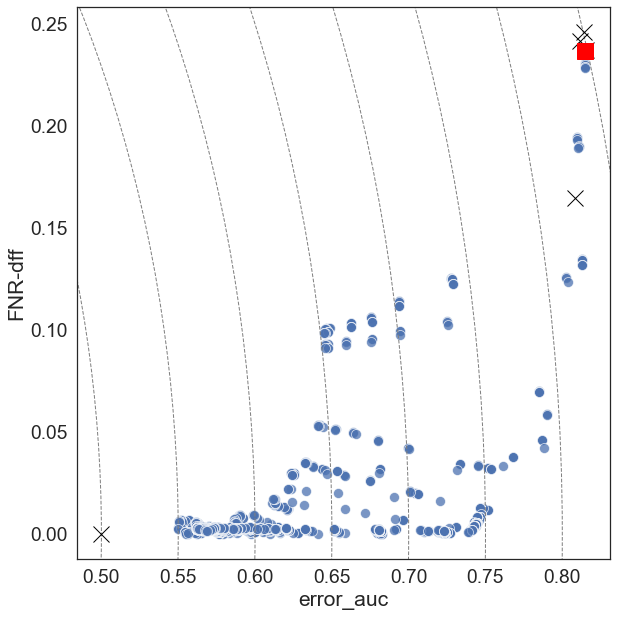

In [585]:
fig, ax = adult_binary1.plot_two_criteria('error_auc', 'rate_diff')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/adult/adult_binary1_MSE_rate-diff.pdf')

fig, ax = adult_binary1.plot_two_criteria('error_auc', 'cFPR_diff')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/adult/adult_binary1_MSE_cFPR-diff.pdf')

fig, ax = adult_binary1.plot_two_criteria('error_auc', 'cFNR_diff')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/adult/adult_binary1_MSE_cFNR-diff.pdf')

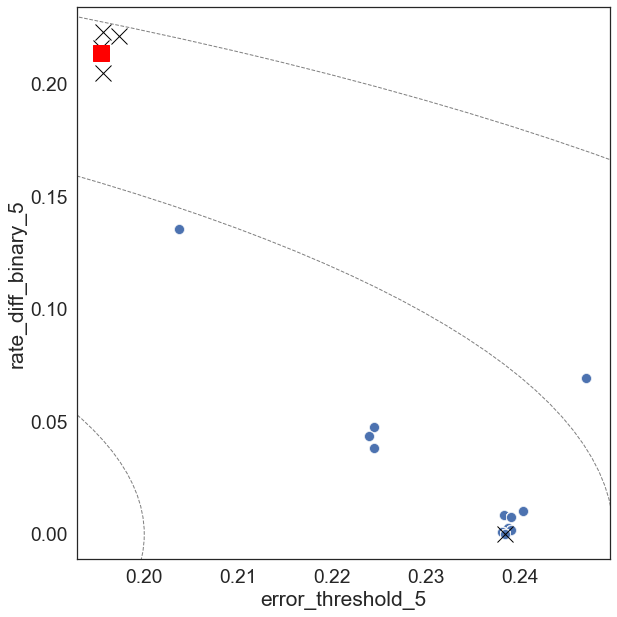

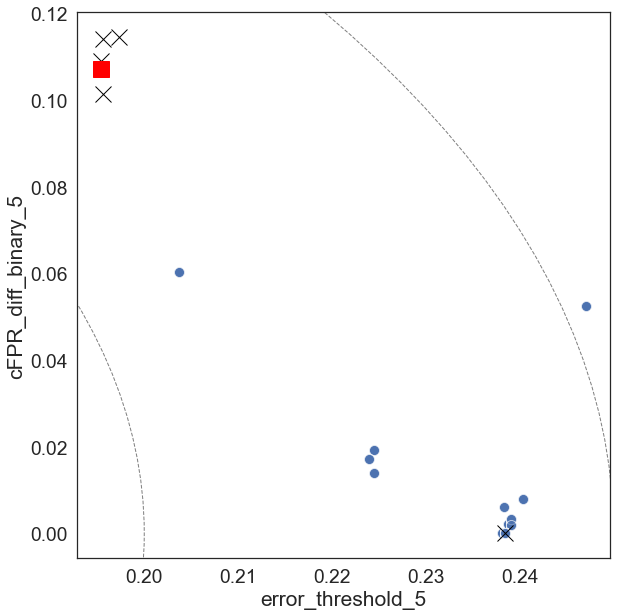

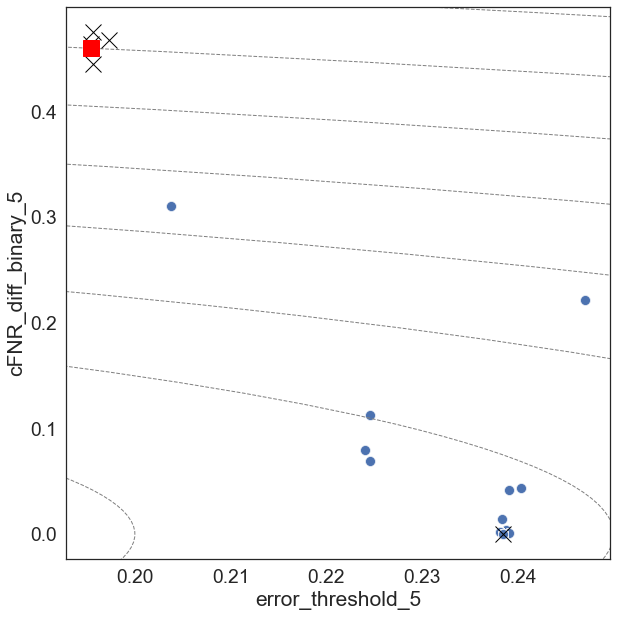

In [587]:
fig, ax = adult_binary1.plot_two_criteria('error_threshold_5', 'rate_diff_binary_5')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/adult/adult_binary1_MSE_rate-diff.pdf')

fig, ax = adult_binary1.plot_two_criteria('error_threshold_5', 'cFPR_diff_binary_5')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/adult/adult_binary1_MSE_cFPR-diff.pdf')

fig, ax = adult_binary1.plot_two_criteria('error_threshold_5', 'cFNR_diff_binary_5')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/adult/adult_binary1_MSE_cFNR-diff.pdf')

In [784]:
perf = adult_binary1.results[('independence', 'cFPR', 'cFNR')]['performance']
min_rate = get_closest_to_origin(['error_mse', 'rate_diff'], perf)
min_FPR = get_closest_to_origin(['error_mse', 'cFPR_diff'], perf)
min_FNR = get_closest_to_origin(['error_mse', 'cFNR_diff'], perf)
min_rate_FPR = get_closest_to_origin(['error_mse', 'rate_diff', 'cFPR_diff'], perf)
min_rate_FNR = get_closest_to_origin(['error_mse', 'rate_diff', 'cFNR_diff'], perf)
min_FPR_FNR = get_closest_to_origin(['error_mse', 'cFPR_diff', 'cFNR_diff'], perf)
min_all = get_closest_to_origin(['error_mse', 'rate_diff', 'cFPR_diff', 'cFNR_diff'], perf)

idx = [min_rate, min_FPR, min_FNR, min_rate_FPR, min_rate_FNR, min_FPR_FNR, min_all]
tmp = adult_binary1.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[idx][['error_mse', 'error_auc', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
tmp.index = ['MSE + rate-diff', 'MSE + FPR-diff', 'MSE + FNR-diff', 'MSE + rate-diff + FPR-diff',
            'MSE + rate-diff + FNR-diff', 'MSE + FPR-diff + FNR-diff', 'MSE + rate-diff + FPR-diff + FNR-diff']
tmp.columns = ['MSE', 'AUC', 'rate-diff', 'FPR-diff', 'FNR-diff']

with open('leastsquares/adult/adult_binary1_best_performance.tex', 'w') as file_out:
    file_out.write(tmp.to_latex(index=True, float_format='%0.2f'))

In [790]:
## Evaluate 'best' models on validation set
betahats1 = [adult_binary1.results[('independence', 'cFPR', 'cFNR')]['betahats'][i] for i in idx]

basis_preds_validate = predict_basis(data_adult_validate, adult_binary1.learners_basis,
                      adult_binary1.all_covariates, adult_binary1.outcome_bounds, continuous=True)

In [813]:
perf_val1 = eval_model(data_adult_validate, A, Y, Y, base_predictions = basis_preds_validate,
          betahats=betahats1)

perf_val1 = perf_val1[['error_mse', 'error_auc', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
perf_val1.index = ['MSE + rate-diff', 'MSE + FPR-diff', 'MSE + FNR-diff', 'MSE + rate-diff + FPR-diff',
            'MSE + rate-diff + FNR-diff', 'MSE + FPR-diff + FNR-diff', 'MSE + rate-diff + FPR-diff + FNR-diff']
perf_val1.columns = ['MSE', 'AUC', 'rate-diff', 'FPR-diff', 'FNR-diff']

with open('leastsquares/adult/adult_binary1_best_performance_validation.tex', 'w') as file_out:
    file_out.write(perf_val1.to_latex(index=True, float_format='%0.2f'))

In [812]:
perf_val

,MSE,AUC,rate-diff,FPR-diff,FNR-diff
MSE + rate-diff,0.164293,0.730532,0.044097,0.021638,0.104828
MSE + FPR-diff,0.149395,0.808813,0.086471,0.056884,0.127968
MSE + FNR-diff,0.155854,0.757870,0.097914,0.087408,0.012495
MSE + rate-diff + FPR-diff,0.164293,0.730532,0.044097,0.021638,0.104828
MSE + rate-diff + FNR-diff,0.161404,0.757244,0.054011,0.047813,0.006920
MSE + FPR-diff + FNR-diff,0.161404,0.757244,0.054011,0.047813,0.006920
MSE + rate-diff + FPR-diff + FNR-diff,0.170996,0.738874,0.022428,0.018972,0.004339


In [833]:
fair_predictors = ['adversarial', 'reductions', 'meta']
perf_fair = eval_model(data_adult_validate, A, Y, Y, base_predictions = data_adult_validate[fair_predictors].values,
          betahats=np.identity(3))

perf_fair = perf_fair[['error_mse', 'error_auc', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
perf_fair.columns = ['MSE', 'AUC', 'rate-diff', 'FPR-diff', 'FNR-diff']

with open('leastsquares/adult/aif360_predictors_validation.tex', 'w') as file_out:
    file_out.write(perf_fair.to_latex(index=False, float_format='%0.2f'))

In [840]:
perf = adult_binary1.results[('independence', 'cFPR', 'cFNR')]['performance']
min_rate = get_closest_to_origin(['error_threshold_5', 'rate_diff_binary_5'], perf)
min_FPR = get_closest_to_origin(['error_threshold_5', 'cFPR_diff_binary_5'], perf)
min_FNR = get_closest_to_origin(['error_threshold_5', 'cFNR_diff_binary_5'], perf)
min_rate_FPR = get_closest_to_origin(['error_threshold_5', 'rate_diff_binary_5', 'cFPR_diff_binary_5'], perf)
min_rate_FNR = get_closest_to_origin(['error_threshold_5', 'rate_diff_binary_5', 'cFNR_diff_binary_5'], perf)
min_FPR_FNR = get_closest_to_origin(['error_threshold_5', 'cFPR_diff_binary_5', 'cFNR_diff_binary_5'], perf)
min_all = get_closest_to_origin(['error_threshold_5', 'rate_diff_binary_5', 'cFPR_diff_binary_5', 'cFNR_diff_binary_5'], perf)

idx = [min_rate, min_FPR, min_FNR, min_rate_FPR, min_rate_FNR, min_FPR_FNR, min_all]
tmp = adult_binary1.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[idx]#[['error_threshold_5', 'rate_diff_binary_5', 'cFPR_diff_binary_5', 'cFNR_diff_binary_5']]


In [841]:
tmp[['error_threshold_5', 'rate_diff_binary_5', 'cFPR_diff_binary_5', 'cFNR_diff_binary_5']]

,error_threshold_5,rate_diff_binary_5,cFPR_diff_binary_5,cFNR_diff_binary_5
363,0.224509,0.038167,0.014016,0.069561
3,0.203726,0.135729,0.060330,0.310675
363,0.224509,0.038167,0.014016,0.069561
363,0.224509,0.038167,0.014016,0.069561
363,0.224509,0.038167,0.014016,0.069561
363,0.224509,0.038167,0.014016,0.069561
4,0.238124,0.000758,0.000217,0.002014


## Minimize MSE: aif360 plus new learners
Observable outcome and fairness constraints

In [796]:
data_adult_basis = pd.read_csv('data/split/data_adult_basis.csv')
data_adult_betahats = pd.read_csv('data/split/data_adult_betahats.csv')
data_adult_test = pd.read_csv('data/split/data_adult_test.csv')

In [794]:
preds_adult_betahats = pd.read_csv(
    'data/predictions_betahats.csv').reset_index(drop=True)
preds_adult_test = pd.read_csv(
    'data/predictions_test.csv').reset_index(drop=True)
preds_adult_validate = pd.read_csv(
    'data/predictions_validate.csv').reset_index(drop=True)

In [795]:
preds_adult_betahats = preds_adult_betahats.rename(columns={'adv': 'adversarial',
                                                            'red':'reductions'})
preds_adult_test = preds_adult_test.rename(columns={'adv': 'adversarial',
                                                            'red':'reductions'})
preds_adult_validate = preds_adult_validate.rename(columns={'adv': 'adversarial',
                                                            'red':'reductions'})

In [797]:
data_adult_betahats = pd.concat(
    [data_adult_betahats, preds_adult_betahats], axis=1)
data_adult_test = pd.concat([data_adult_test, preds_adult_test], axis=1)
data_adult_validate = pd.concat([data_adult_validate, preds_adult_validate], axis=1)

In [731]:
A = 'sex'
X_cols = [1] + list(range(3, data_adult_basis.shape[1] - 1))
X = data_adult_basis.columns[X_cols].to_list()
pred_cols = [A] + X
# Previously learned fair classifiers, learned with aif360
predictors = ['adversarial', 'reductions', 'meta']
Y = 'Income Binary'

In [732]:
# Specify learners
learners_basis = [DummyRegressor(strategy='mean'),
                  RandomForestClassifier(),
                  LogisticRegression(),
                  GradientBoostingClassifier(),
                  #                   svm.NuSVC(probability=True),
                  #                   GaussianNB(),
                  Ridge(alpha=1)]

In [733]:
adult_binary2 = FairPredictor(data_basis=data_adult_basis,
                              data_train_target=data_adult_betahats,
                              data_test_target=data_adult_test,
                              covariates=X, protected=A,
                              outcome=Y, predictors=predictors, outcome_bounds=(
                                  0, 1),
                              learners_basis=learners_basis)

adult_binary2.all_covariates = [A] + X  # Remove aif360 predictors from covariates

In [734]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
adult_binary2.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                                phihat_train=Y, phibarhat_train=Y,
                                phihat_test=Y, phibarhat_test=Y,
                                counterfactual=False, continuous=True, recompute=True)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [735]:
adult_binary2.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
learner0,7.703720e-34,0.181596,0.365137,0.500000,0.137386,5.551115e-17,1.454838e-17,1.454838e-17
learner1,4.911309e-02,0.138946,0.273263,0.811079,0.101219,1.935991e-01,1.366162e-01,2.416841e-01
learner2,4.647897e-02,0.137809,0.274761,0.814421,0.100014,1.952148e-01,1.388579e-01,2.459098e-01
learner3,4.558568e-02,0.137891,0.275772,0.815183,0.100677,1.889063e-01,1.332110e-01,2.373501e-01
learner4,3.651913e-02,0.140901,0.292847,0.808476,0.094623,1.709661e-01,1.311366e-01,1.647493e-01
adversarial,1.455429e-01,0.207617,0.207617,0.669767,0.208680,7.335276e-02,4.185969e-03,3.191730e-02
reductions,1.122776e-01,0.218059,0.218059,0.620882,0.219108,1.498039e-02,2.640364e-02,7.397849e-02
meta,2.325321e-01,0.302621,0.302621,0.676557,0.303556,1.780490e-01,2.583296e-01,2.550330e-01


In [744]:
adult_binary2.results[('independence', 'cFPR', 'cFNR')]['betahats'][0]

array([-0.01044567,  0.25633043,  0.55980575,  0.18313568,  0.04093626,
       -0.02067638, -0.03446887, -0.00122978])

In [741]:
## Save results

adult_binary2.results['base_learners'].reset_index().to_csv('leastsquares/adult/adult_base_performance.csv',
                                                   index=False)

adult_binary2.results[('independence', 'cFPR', 'cFNR')]['performance'].to_csv('leastsquares/adult/adult_aggregated_performance.csv',
                                                                     index=False)

# Table with base learner and unpenalized least squares performance
base_perf = pd.concat([adult_binary2.results['base_learners'],
                       adult_binary1.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[[0]],
                       adult_binary2.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[[0]]],
                      axis=0)
base_perf.index = ['Mean', 'Random Forest', 'Logistic', 'GB Classifier',
                   'Ridge', 'Adversarial', 'Reductions', 'Meta', 'Least Squares - 5', 'Least Squares - all']
base_perf = base_perf[['error_mse', 'error_auc', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
base_perf.columns = ['MSE', 'AUC', 'rate-diff', 'FPR-diff', 'FNR-diff']

with open('leastsquares/adult/adult2_base_performance.tex', 'w') as file_out:
    file_out.write(base_perf.reset_index().to_latex(index=False, float_format='%0.2f'))

In [630]:
adult_binary2.results[constraints]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_threshold_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,rate_diff_binary,cFPR_diff_binary,cFNR_diff_binary,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.044050,0.137859,0.276794,0.197072,0.814806,0.198244,0.143164,0.251953,0.225963,0.117839,0.476838,0.0,0.000,0.0,
1,0.044036,0.137856,0.276777,0.197072,0.814816,0.197989,0.142915,0.251624,0.225963,0.117839,0.476838,0.0,0.001,0.0,cFPR
2,0.043913,0.137831,0.276625,0.197072,0.814869,0.195736,0.140715,0.248710,0.225963,0.117839,0.476838,0.0,0.010,0.0,cFPR
3,0.043001,0.141281,0.270740,0.197686,0.800472,0.106565,0.053710,0.133015,0.225660,0.118273,0.474824,0.0,1.000,0.0,cFPR
4,0.045422,0.146158,0.267924,0.195844,0.791537,0.062703,0.010973,0.075941,0.218077,0.110894,0.466767,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.013055,0.183199,0.279541,0.238432,0.723258,0.000991,0.014357,0.001310,0.000000,0.000000,0.000000,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.011641,0.194694,0.282576,0.238432,0.661079,0.000865,0.008113,0.001480,0.000000,0.000000,0.000000,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.011569,0.208601,0.286587,0.238432,0.531276,0.004252,0.004479,0.019363,0.000000,0.000000,0.000000,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.011509,0.209655,0.286994,0.238432,0.492772,0.004492,0.003872,0.021374,0.000000,0.000000,0.000000,2000.0,1000.000,2000.0,ind_cFPR_cFNR


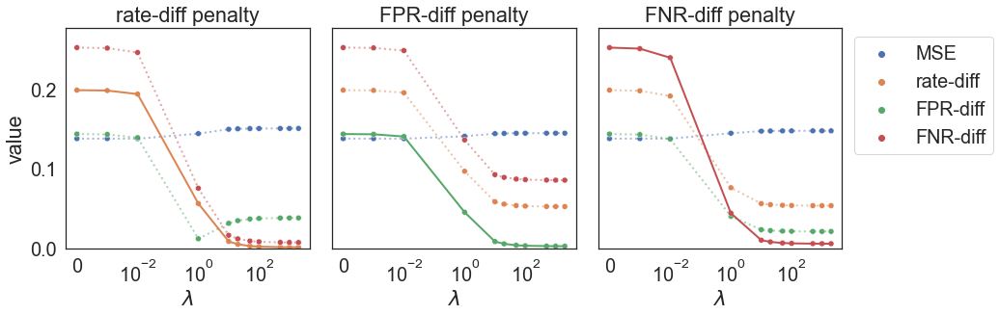

In [782]:
sns.set(font_scale = 1.8, style = 'white')
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
fig, ax = adult_binary2.plot_one_constraint(fairness, 'error_mse')
for axx in ax:
    axx.xaxis.set_ticks([0.0001, 0.01, 1, 100])
    xlabels = axx.xaxis.get_ticklabels()
    xlabels = [mpl.text.Text(1e-04, 0, '0'),
               mpl.text.Text(0.01, 0, '$\\mathdefault{10^{-2}}$'),
               mpl.text.Text(1.0, 0, '$\\mathdefault{10^{0}}$'),
              mpl.text.Text(100.0, 0, '$\\mathdefault{10^{2}}$')]
    axx.xaxis.set_ticklabels(xlabels)
    
fig.savefig('leastsquares/adult/adult_binary2_one_constraint.pdf')

In [770]:
fig.savefig('leastsquares/adult/adult_binary2_one_constraint.pdf')

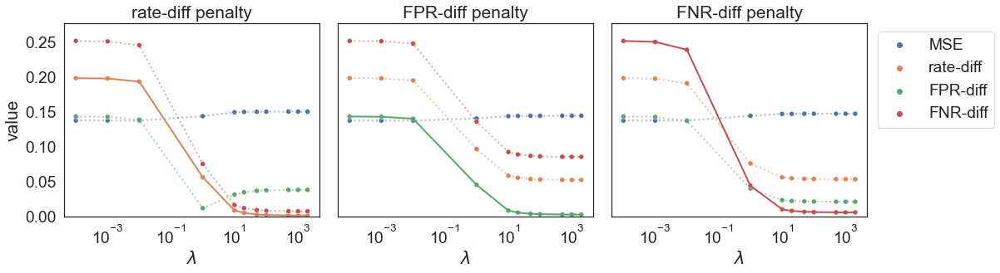

In [767]:
fig, ax = adult_binary2.plot_one_constraint(fairness, 'error_mse')


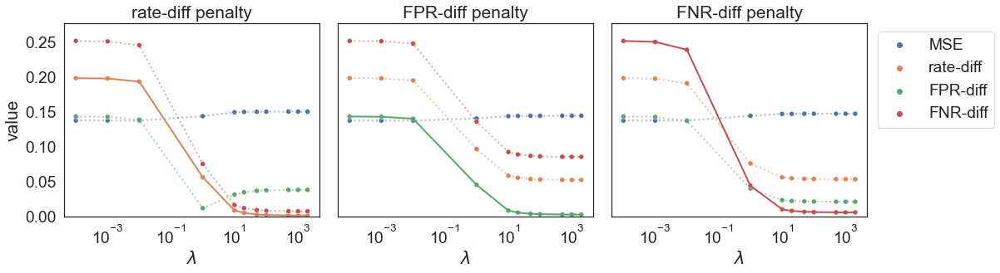

In [768]:
fig

(<Figure size 1080x360 with 3 Axes>,
 array([<AxesSubplot:title={'center':'rate-diff penalty'}, xlabel='$\\lambda$', ylabel='value'>,
        <AxesSubplot:title={'center':'FPR-diff penalty'}, xlabel='$\\lambda$', ylabel='value'>,
        <AxesSubplot:title={'center':'FNR-diff penalty'}, xlabel='$\\lambda$', ylabel='value'>],
       dtype=object))

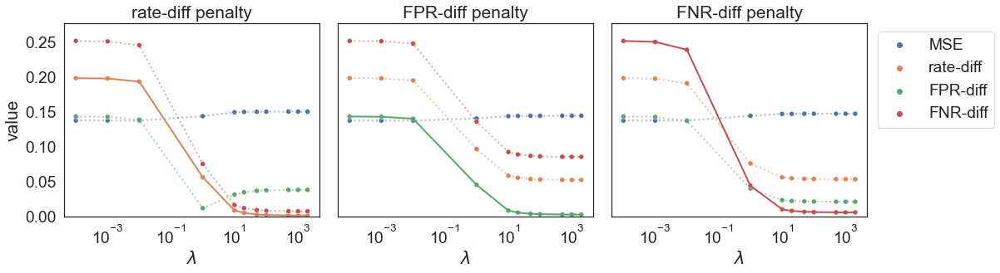

In [746]:
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
adult_binary2.plot_one_constraint(fairness, 'error_mse')

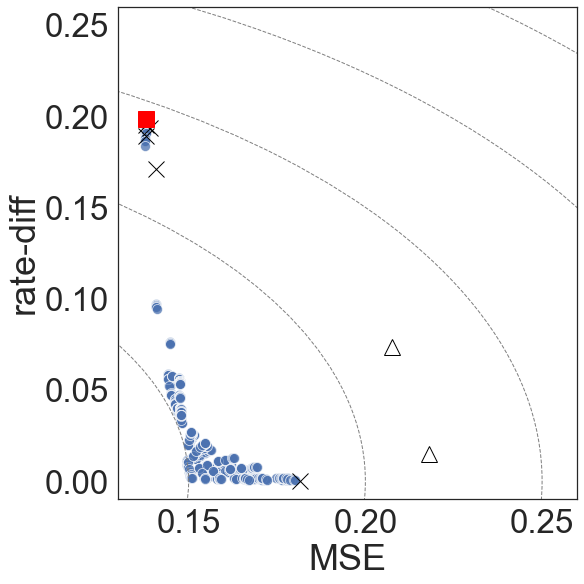

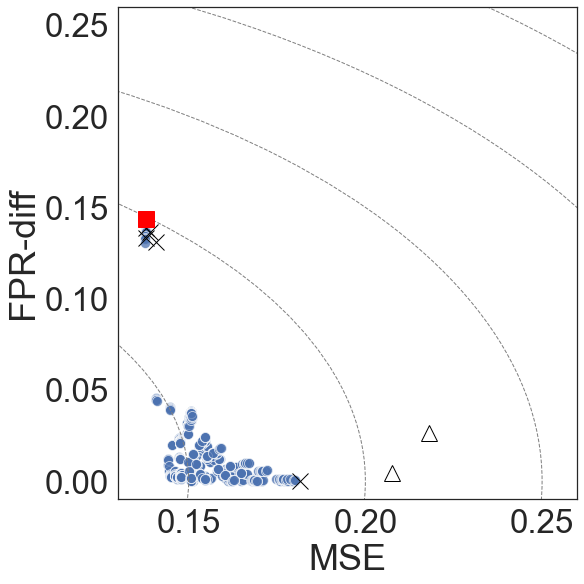

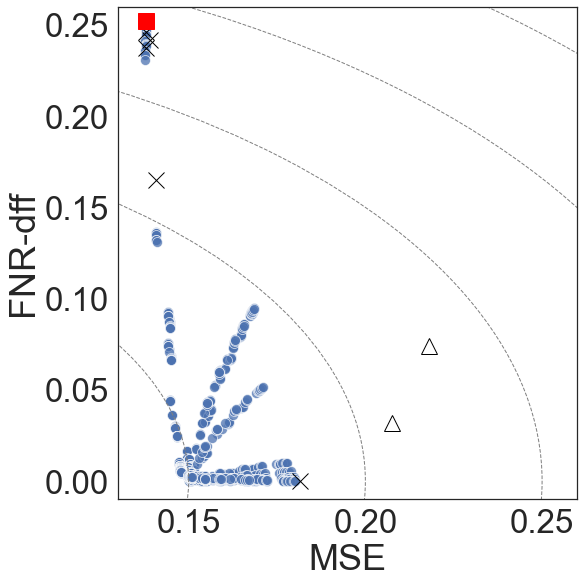

In [760]:
sns.set(font_scale = 3, style = 'white')
fig, ax = adult_binary2.plot_two_criteria('error_mse', 'rate_diff')
ax.set_xlim((0.13, 0.26))
ax.set_ylim((-0.01, 0.26))
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary2_MSE_rate-diff.pdf')

fig, ax = adult_binary2.plot_two_criteria('error_mse', 'cFPR_diff')
ax.set_xlim((0.13, 0.26))
ax.set_ylim((-0.01, 0.26))
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary2_MSE_cFPR-diff.pdf')

fig, ax = adult_binary2.plot_two_criteria('error_mse', 'cFNR_diff')
ax.set_xlim((0.13, 0.26))
ax.set_ylim((-0.01, 0.26))
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary2_MSE_cFNR-diff.pdf')

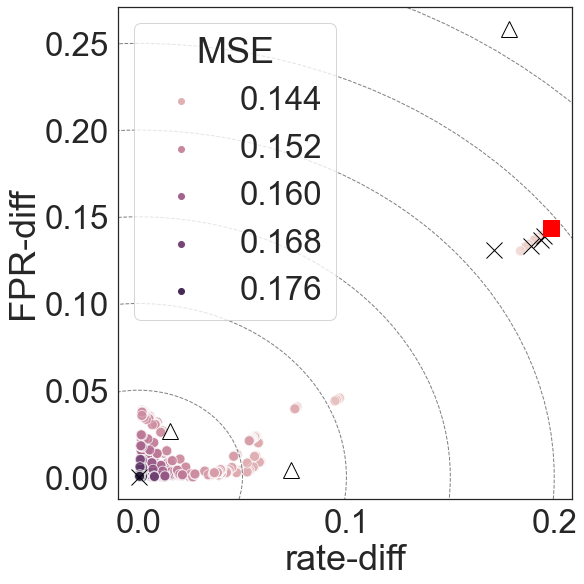

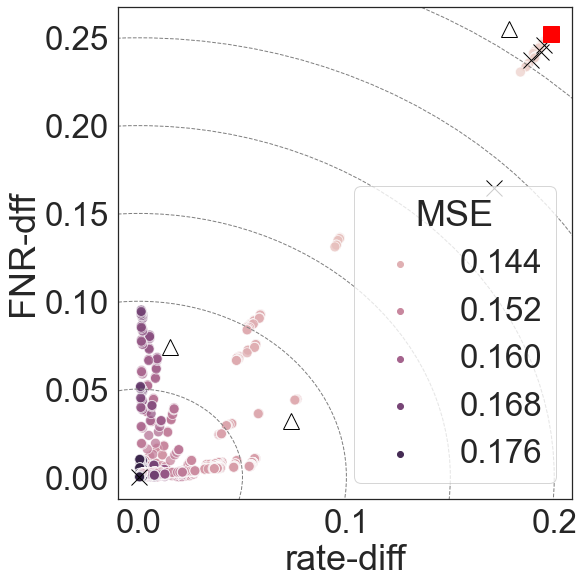

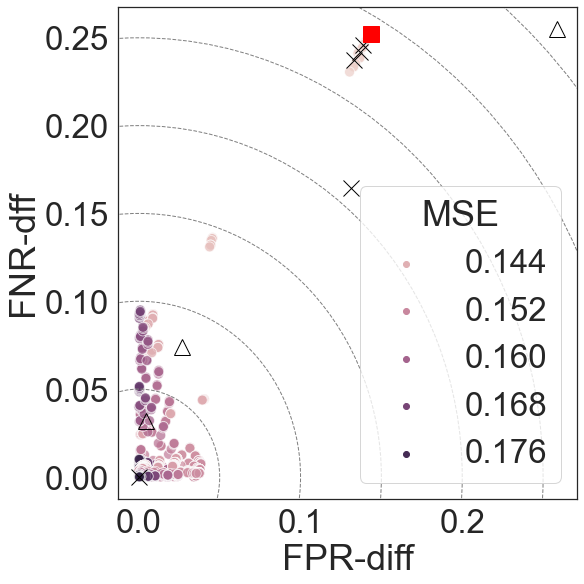

In [842]:
sns.set(font_scale = 3, style = 'white')
fig, ax = adult_binary2.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary2_rate_cFPR_MSE.pdf')

fig, ax = adult_binary2.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary2_rate_cFNR_MSE.pdf')

fig, ax = adult_binary2.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')
ax.legend(title='MSE')
fig.set_tight_layout(True)
fig.savefig('leastsquares/adult/adult_binary2_cFPR_cFNR_MSE.pdf')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_auc', ylabel='FNR-dff'>)

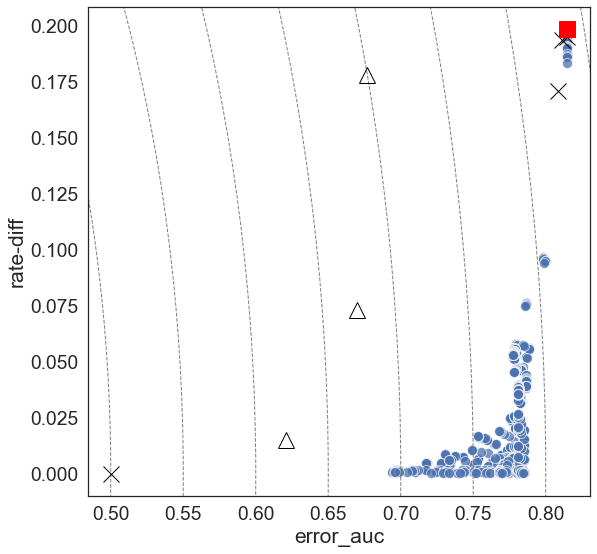

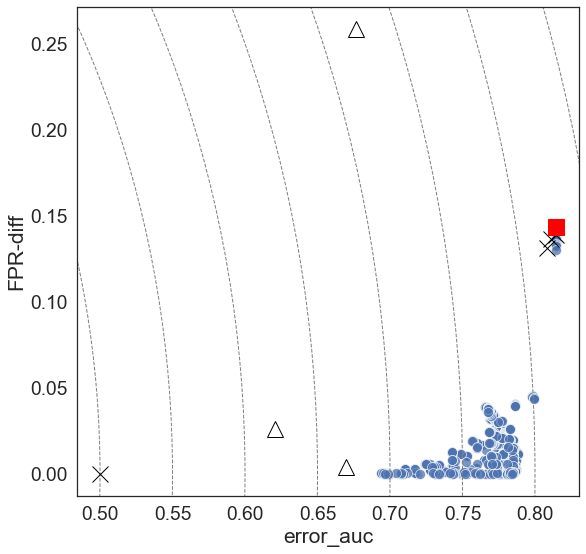

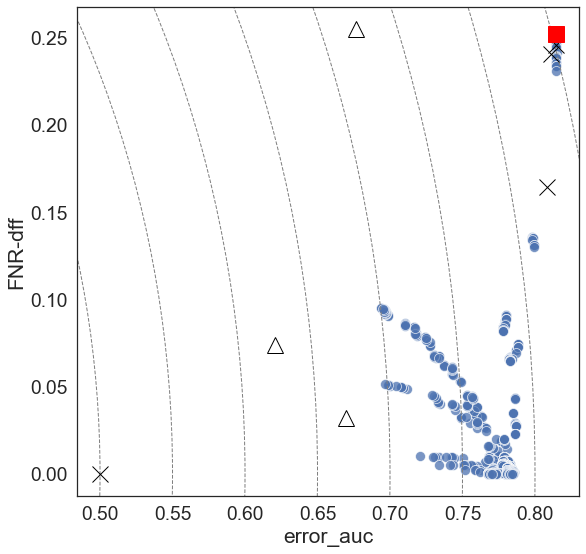

In [589]:
adult_binary2.plot_two_criteria('error_auc', 'rate_diff')
adult_binary2.plot_two_criteria('error_auc', 'cFPR_diff')
adult_binary2.plot_two_criteria('error_auc', 'cFNR_diff')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_bernoulli_01', ylabel='FNR-dff'>)

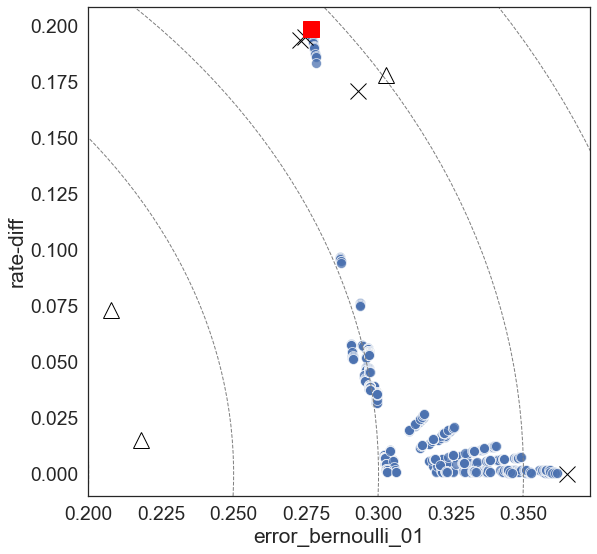

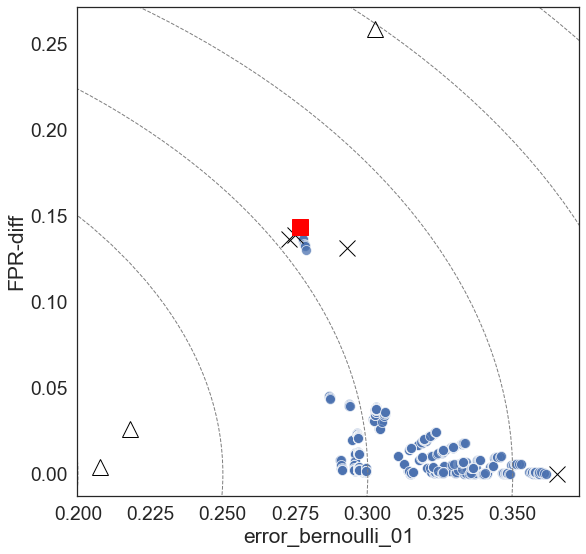

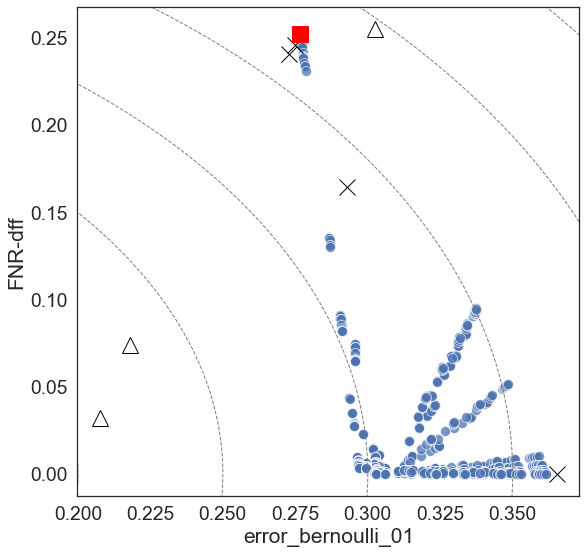

In [590]:
adult_binary2.plot_two_criteria('error_bernoulli_01', 'rate_diff')
adult_binary2.plot_two_criteria('error_bernoulli_01', 'cFPR_diff')
adult_binary2.plot_two_criteria('error_bernoulli_01', 'cFNR_diff')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_threshold_5', ylabel='cFNR_diff_binary_5'>)

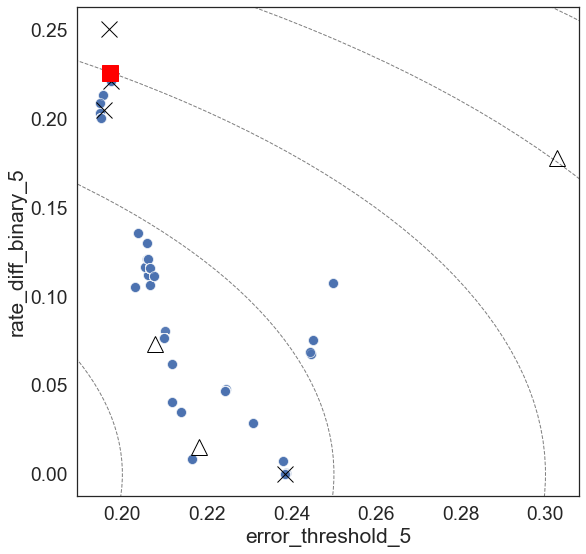

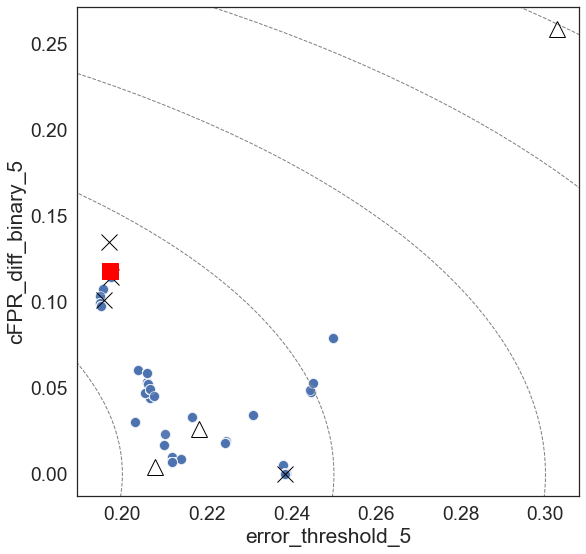

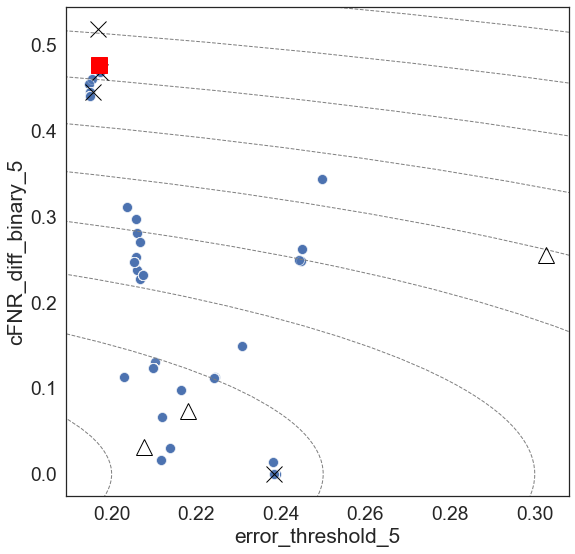

In [591]:
adult_binary2.plot_two_criteria('error_threshold_5', 'rate_diff_binary_5')
adult_binary2.plot_two_criteria('error_threshold_5', 'cFPR_diff_binary_5')
adult_binary2.plot_two_criteria('error_threshold_5', 'cFNR_diff_binary_5')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='cFPR_diff', ylabel='cFNR_diff'>)

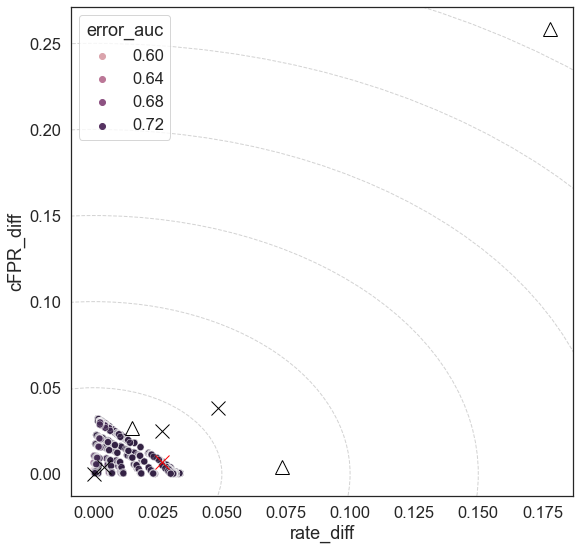

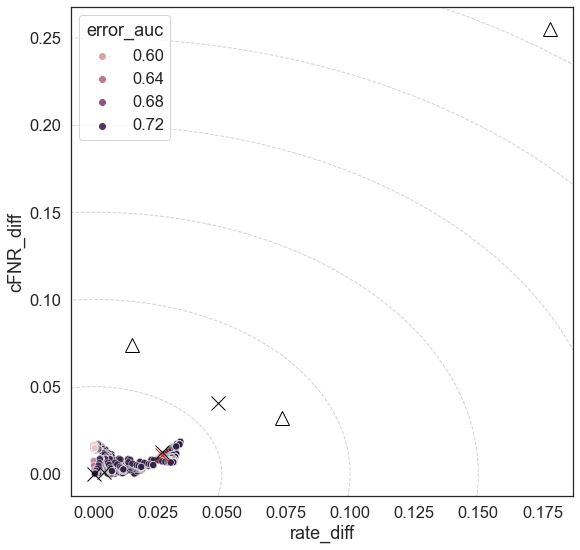

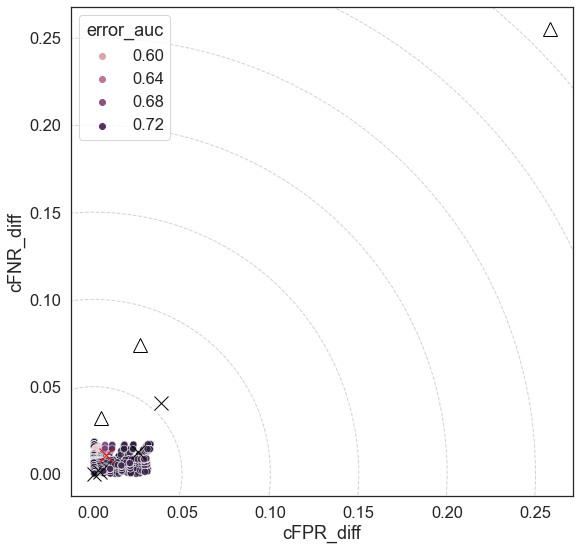

In [525]:
adult_binary2.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_auc')
adult_binary2.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_auc')
adult_binary2.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_auc')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_bernoulli_01', ylabel='cFNR_diff'>)

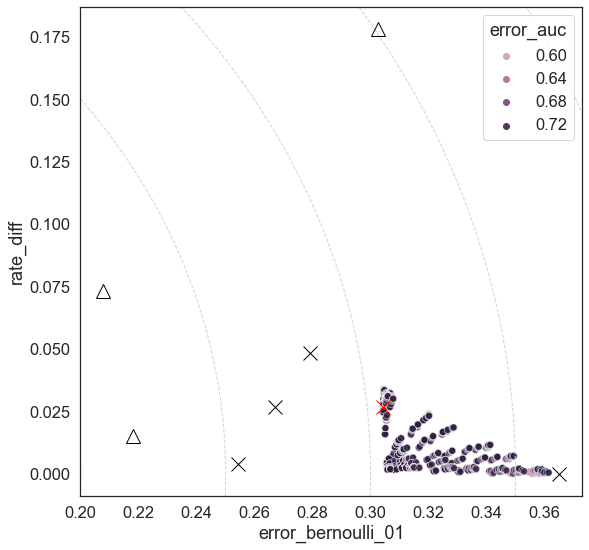

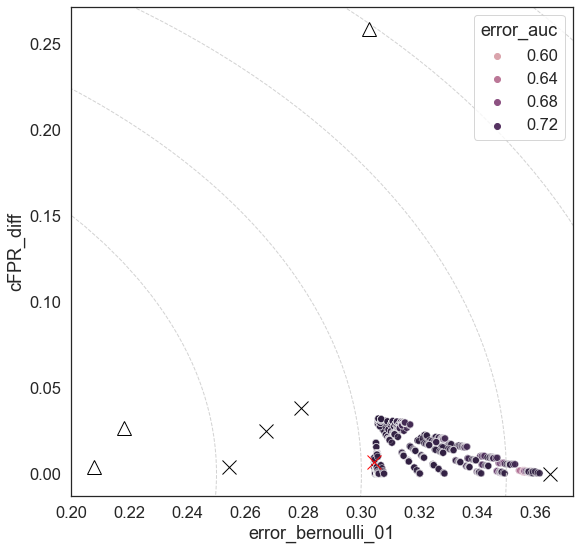

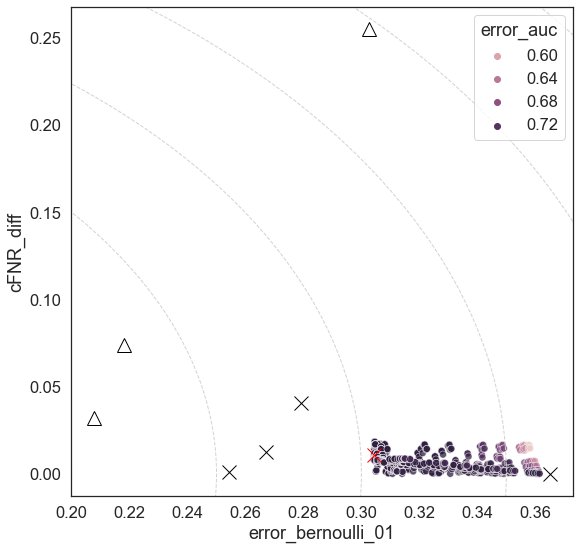

In [526]:
adult_binary2.plot_two_criteria(
    'error_bernoulli_01', 'rate_diff', hue='error_auc')
adult_binary2.plot_two_criteria(
    'error_bernoulli_01', 'cFPR_diff', hue='error_auc')
adult_binary2.plot_two_criteria(
    'error_bernoulli_01', 'cFNR_diff', hue='error_auc')

KeyError: 'error_threshold_01'

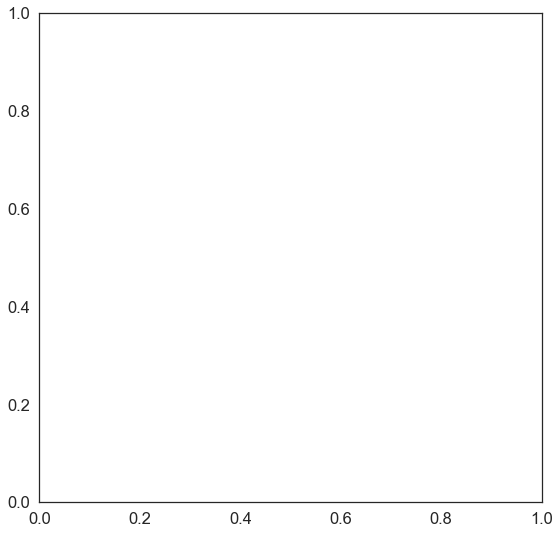

In [527]:
adult_binary2.plot_two_criteria(
    'error_threshold_01', 'rate_diff', hue='error_auc')
adult_binary2.plot_two_criteria(
    'error_threshold_01', 'cFPR_diff', hue='error_auc')
adult_binary2.plot_two_criteria(
    'error_threshold_01', 'cFNR_diff', hue='error_auc')

In [565]:
# np.argmin(adult_binary2.results[('independence', 'cFPR', 'cFNR')]['performance']['error_threshold_5'])
np.argmin(adult_binary2.results[('independence', 'cFPR', 'cFNR')]['performance']['error_threshold_5'])

245

In [566]:
adult_binary2.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[245]

learner_variance       0.0361169
error_mse                0.14085
error_bernoulli_01      0.286898
error_auc               0.799228
error_logistic          0.102899
rate_diff              0.0951596
cFPR_diff              0.0443947
cFNR_diff               0.131563
error_threshold_1       0.458538
rate_diff_binary_1      0.155112
cFPR_diff_binary_1     0.0979871
cFNR_diff_binary_1      0.048058
error_threshold_2       0.331593
rate_diff_binary_2     0.0912722
cFPR_diff_binary_2     0.0116811
cFNR_diff_binary_2     0.0102892
error_threshold_3       0.221233
rate_diff_binary_3      0.162553
cFPR_diff_binary_3     0.0744103
cFNR_diff_binary_3      0.146504
error_threshold_4       0.210074
rate_diff_binary_4      0.250759
cFPR_diff_binary_4      0.141665
cFNR_diff_binary_4      0.412102
error_threshold_5       0.194717
rate_diff_binary_5       0.20913
cFPR_diff_binary_5      0.103299
cFNR_diff_binary_5      0.454683
error_threshold_6       0.205774
rate_diff_binary_6       0.13027
cFPR_diff_

In [814]:
perf = adult_binary2.results[('independence', 'cFPR', 'cFNR')]['performance']
min_rate = get_closest_to_origin(['error_mse', 'rate_diff'], perf)
min_FPR = get_closest_to_origin(['error_mse', 'cFPR_diff'], perf)
min_FNR = get_closest_to_origin(['error_mse', 'cFNR_diff'], perf)
min_rate_FPR = get_closest_to_origin(['error_mse', 'rate_diff', 'cFPR_diff'], perf)
min_rate_FNR = get_closest_to_origin(['error_mse', 'rate_diff', 'cFNR_diff'], perf)
min_FPR_FNR = get_closest_to_origin(['error_mse', 'cFPR_diff', 'cFNR_diff'], perf)
min_all = get_closest_to_origin(['error_mse', 'rate_diff', 'cFPR_diff', 'cFNR_diff'], perf)

idx = [min_rate, min_FPR, min_FNR, min_rate_FPR, min_rate_FNR, min_FPR_FNR, min_all]
tmp = adult_binary2.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[idx][['error_mse', 'error_auc', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
tmp.index = ['MSE + rate-diff', 'MSE + FPR-diff', 'MSE + FNR-diff', 'MSE + rate-diff + FPR-diff',
            'MSE + rate-diff + FNR-diff', 'MSE + FPR-diff + FNR-diff', 'MSE + rate-diff + FPR-diff + FNR-diff']
tmp.columns = ['MSE', 'AUC', 'rate-diff', 'FPR-diff', 'FNR-diff']

with open('leastsquares/adult/adult_binary2_best_performance.tex', 'w') as file_out:
    file_out.write(tmp.to_latex(index=True, float_format='%0.2f'))

In [826]:
## Evaluate 'best' models on validation set
betahats2 = [adult_binary2.results[('independence', 'cFPR', 'cFNR')]['betahats'][i] for i in idx]

basis_preds_validate = predict_basis(data_adult_validate, adult_binary2.learners_basis,
                      adult_binary2.all_covariates, adult_binary2.outcome_bounds, continuous=True)

basis_preds_validate = np.concatenate([basis_preds_validate, data_adult_validate[['adversarial', 'reductions', 'meta']]], axis=1)

In [829]:
perf_val2 = eval_model(data_adult_validate, A, Y, Y, base_predictions = basis_preds_validate,
          betahats=betahats2)

perf_val2 = perf_val2[['error_mse', 'error_auc', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
perf_val2.index = ['MSE + rate-diff', 'MSE + FPR-diff', 'MSE + FNR-diff', 'MSE + rate-diff + FPR-diff',
            'MSE + rate-diff + FNR-diff', 'MSE + FPR-diff + FNR-diff', 'MSE + rate-diff + FPR-diff + FNR-diff']
perf_val2.columns = ['MSE', 'AUC', 'rate-diff', 'FPR-diff', 'FNR-diff']

with open('leastsquares/adult/adult_binary2_best_performance_validation.tex', 'w') as file_out:
    file_out.write(perf_val2.to_latex(index=True, float_format='%0.2f'))

In [827]:
basis_preds_validate.shape

(9769, 8)

In [830]:
perf_val2

,MSE,AUC,rate-diff,FPR-diff,FNR-diff
MSE + rate-diff,0.148330,0.785496,0.011664,0.026946,0.016844
MSE + FPR-diff,0.142760,0.787982,0.058716,0.007803,0.097456
MSE + FNR-diff,0.145993,0.789764,0.045325,0.010030,0.012119
MSE + rate-diff + FPR-diff,0.146622,0.790260,0.031440,0.004859,0.010292
MSE + rate-diff + FNR-diff,0.148586,0.788726,0.010639,0.026473,0.007259
MSE + FPR-diff + FNR-diff,0.146241,0.790200,0.037728,0.001028,0.011485
MSE + rate-diff + FPR-diff + FNR-diff,0.146816,0.790055,0.030498,0.005465,0.007647


In [820]:
pd.concat([perf_val2, perf_val1], axis=0, keys = ['LS-5', 'LS-all'])

MSE       AUC  rate-diff  \
LS-5   MSE + rate-diff                        0.164184  0.733187   0.044263   
       MSE + FPR-diff                         0.149338  0.809710   0.086594   
       MSE + FNR-diff                         0.155821  0.758503   0.097984   
       MSE + rate-diff + FPR-diff             0.164184  0.733187   0.044263   
       MSE + rate-diff + FNR-diff             0.161333  0.758410   0.054115   
       MSE + FPR-diff + FNR-diff              0.161333  0.758410   0.054115   
       MSE + rate-diff + FPR-diff + FNR-diff  0.170877  0.740753   0.022575   
LS-all MSE + rate-diff                        0.164293  0.730532   0.044097   
       MSE + FPR-diff                         0.149395  0.808813   0.086471   
       MSE + FNR-diff                         0.155854  0.757870   0.097914   
       MSE + rate-diff + FPR-diff             0.164293  0.730532   0.044097   
       MSE + rate-diff + FNR-diff             0.161404  0.757244   0.054011   
       MSE + FPR-diff + FNR-diff              0.161404  0.757244   0.054011   
       MSE + rate-diff + FPR-diff + FNR-diff  0.170996  0.738874   0.022428   

                                              FPR-diff  FNR-diff  
LS-5   MSE + rate-diff                        0.021691  0.105039  
       MSE + FPR-diff                         0.056923  0.128125  
       MSE + FNR-diff                         0.087431  0.012584  
       MSE + rate-diff + FPR-diff             0.021691  0.105039  
       MSE + rate-diff + FNR-diff             0.047847  0.007052  
       MSE + FPR-diff + FNR-diff              0.047847  0.007052  
       MSE + rate-diff + FPR-diff + FNR-diff  0.019019  0.004527  
LS-all MSE + rate-diff                        0.021638  0.104828  
       MSE + FPR-diff                         0.056884  0.127968  
       MSE + FNR-diff                         0.087408  0.012495  
       MSE + rate-diff + FPR-diff             0.021638  0.104828  
       MSE + rate-diff + FNR-diff             0.047813  0.006920  
       MSE + FPR-diff + FNR-diff              0.047813  0.006920  
       MSE + rate-diff + FPR-diff + FNR-diff  0.018972  0.004339

## Minimize MSE: aif360 learners only

In [529]:
adult_binary3 = FairPredictor(data_basis=data_adult_basis,
                              data_train_target=data_adult_betahats,
                              data_test_target=data_adult_test,
                              covariates=X, protected=A,
                              outcome=Y, predictors=predictors, outcome_bounds=(
                                  0, 1),
                              learners_basis=None)


preds_train = data_adult_betahats[predictors].values
adult_binary3.basis_preds_train = preds_train

Q0 = np.matmul(np.transpose(preds_train), preds_train)/len(preds_train)
adult_binary3.Q0_inv = np.linalg.inv(Q0)

preds_test = data_adult_test[predictors].values
adult_binary3.basis_preds_test = preds_test

In [530]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
adult_binary3.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                                phihat_train=Y, phibarhat_train=Y,
                                phihat_test=Y, phibarhat_test=Y,
                                counterfactual=False, continuous=True, recompute=False)


NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [534]:
adult_binary3.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff
adv,0.145543,0.207617,0.207617,0.669767,0.208680,0.073353,0.004186,0.031917
red,0.112278,0.218059,0.218059,0.620882,0.219108,0.014980,0.026404,0.073978
meta,0.232532,0.302621,0.302621,0.676557,0.303556,0.178049,0.258330,0.255033


In [533]:
adult_binary3.results[('independence', 'cFPR', 'cFNR')]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.047202,0.165350,0.244801,0.709050,0.138433,0.023178,0.064968,0.058681,0.0,0.000,0.0,
1,0.047199,0.165350,0.244792,0.709050,0.138439,0.023155,0.064944,0.058652,0.0,0.001,0.0,cFPR
2,0.047168,0.165350,0.244714,0.709050,0.138493,0.022940,0.064723,0.058393,0.0,0.010,0.0,cFPR
3,0.045401,0.166147,0.238555,0.709050,0.143305,0.005919,0.047214,0.037810,0.0,1.000,0.0,cFPR
4,0.045830,0.172184,0.227012,0.706525,0.154170,0.025983,0.014397,0.000769,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.009193,0.208446,0.243860,0.661934,0.202214,0.005659,0.019221,0.000437,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.005138,0.213495,0.242359,0.661934,0.209905,0.003980,0.014247,0.000258,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.000622,0.227380,0.239451,0.661934,0.227874,0.000726,0.004610,0.000089,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.000219,0.231188,0.238807,0.703742,0.232066,0.000005,0.002475,0.000166,2000.0,1000.000,2000.0,ind_cFPR_cFNR


(<Figure size 1080x360 with 3 Axes>,
 array([<AxesSubplot:xlabel='lambda_independence', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFPR', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFNR', ylabel='value'>], dtype=object))

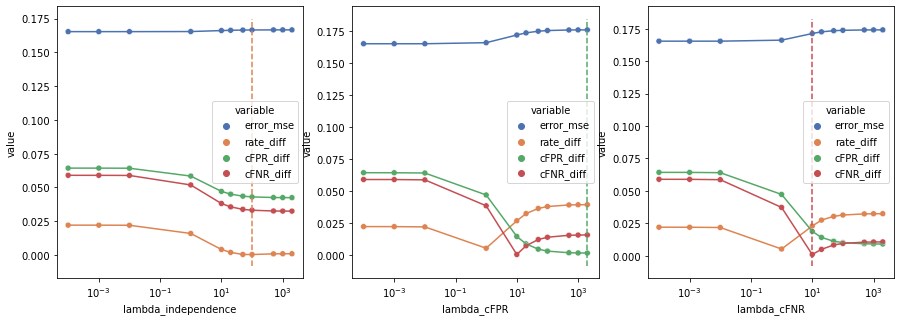

In [663]:
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
adult_binary3.plot_one_constraint(fairness, 'error_mse')

In [667]:
adult_binary3.results['base_learners'] = pd.DataFrame()

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_mse', ylabel='cFNR_diff'>)

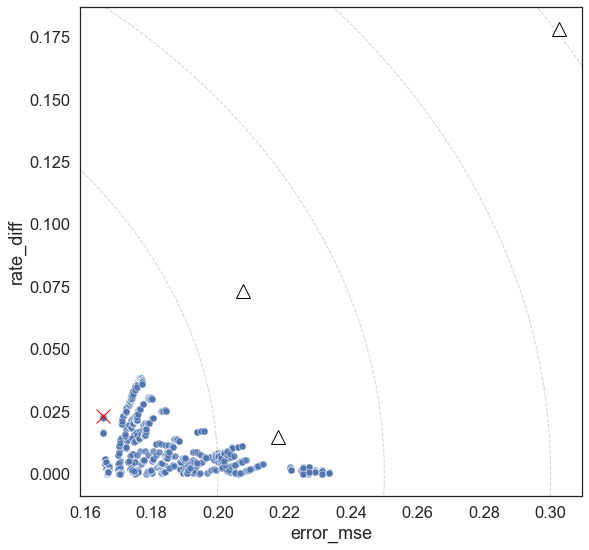

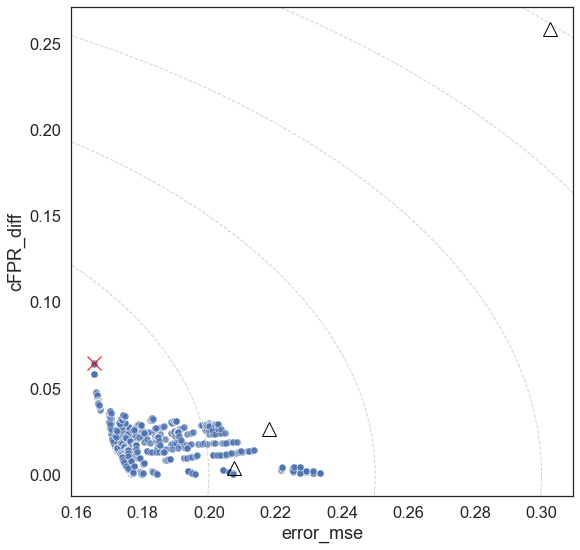

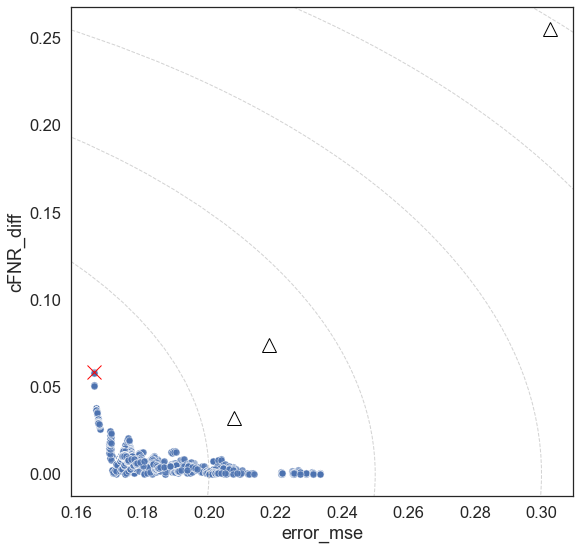

In [536]:
adult_binary3.plot_two_criteria('error_mse', 'rate_diff')
adult_binary3.plot_two_criteria('error_mse', 'cFPR_diff')
adult_binary3.plot_two_criteria('error_mse', 'cFNR_diff')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='cFPR_diff', ylabel='cFNR_diff'>)

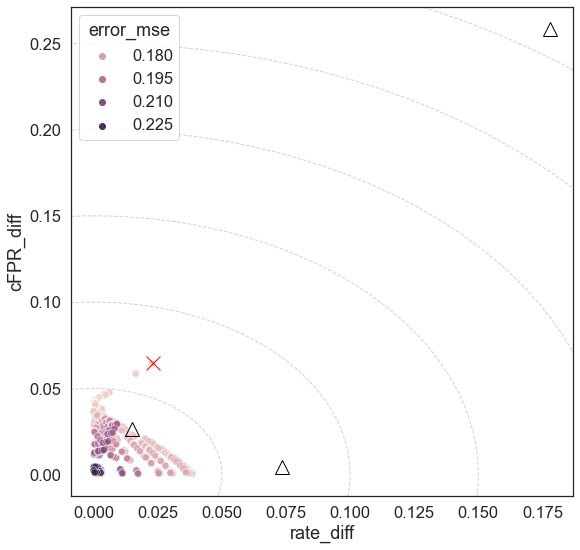

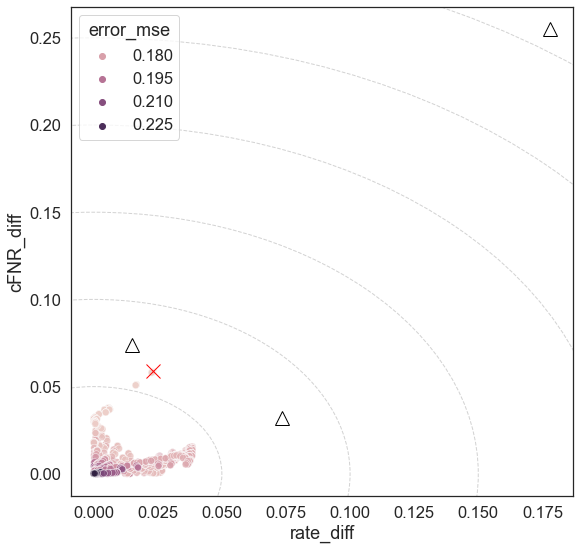

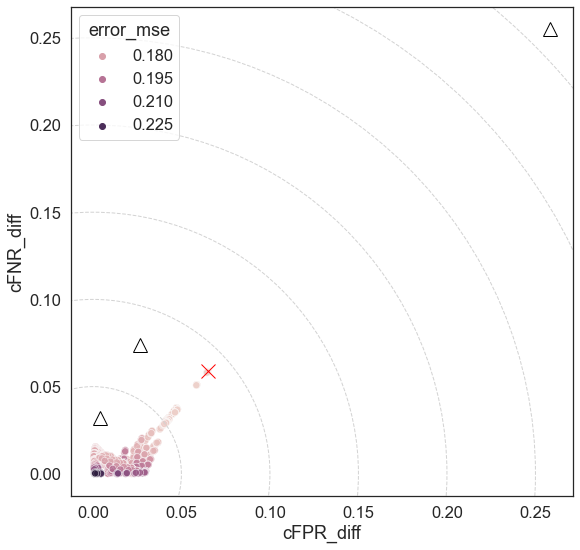

In [535]:
adult_binary3.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
adult_binary3.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
adult_binary3.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='cFPR_diff', ylabel='cFNR_diff'>)

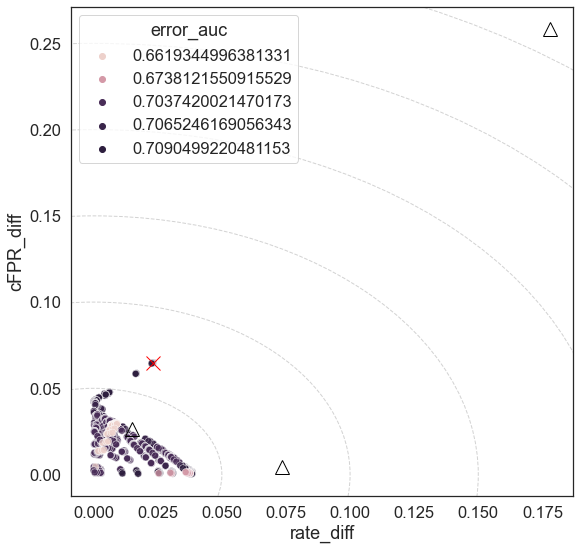

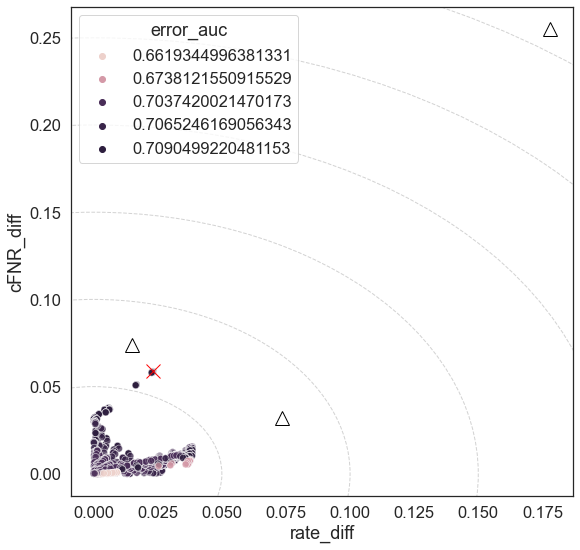

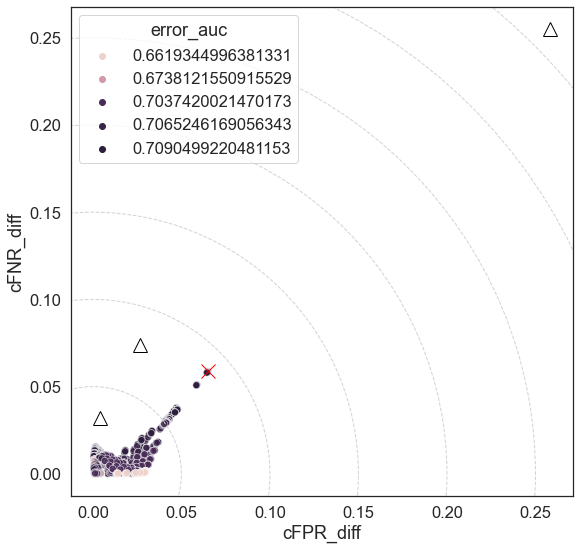

In [532]:
adult_binary3.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_auc')
adult_binary3.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_auc')
adult_binary3.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_auc')

### Minimize MSE: aif360 plus intercept

In [516]:
# Specify learners
learners_basis = [DummyRegressor(strategy='mean')]

In [522]:
adult_binary4 = FairPredictor(data_basis=data_adult_basis,
                              data_train_target=data_adult_betahats,
                              data_test_target=data_adult_test,
                              covariates=X, protected=A,
                              outcome=Y, predictors=predictors, outcome_bounds=(
                                  0, 1),
                              learners_basis=learners_basis)

adult_binary4.all_covariates = [A] + X  # Remove aif360 predictors from covariates

In [543]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
adult_binary4.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                                phihat_train=Y, phibarhat_train=Y,
                                phihat_test=Y, phibarhat_test=Y,
                                counterfactual=False, continuous=True, recompute=True)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [537]:
adult_binary4.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff,error_threshold_1,rate_diff_binary_1,...,cFPR_diff_binary_7,cFNR_diff_binary_7,error_threshold_8,rate_diff_binary_8,cFPR_diff_binary_8,cFNR_diff_binary_8,error_threshold_9,rate_diff_binary_9,cFPR_diff_binary_9,cFNR_diff_binary_9
learner0,7.703720e-34,0.181596,0.365137,0.500000,0.137386,5.551115e-17,1.454838e-17,1.454838e-17,0.761568,0.000000,...,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000
adv,1.455429e-01,0.207617,0.207617,0.669767,0.208680,7.335276e-02,4.185969e-03,3.191730e-02,0.207617,0.073353,...,0.004186,0.031917,0.207617,0.073353,0.004186,0.031917,0.207617,0.073353,0.004186,0.031917
red,1.122776e-01,0.218059,0.218059,0.620882,0.219108,1.498039e-02,2.640364e-02,7.397849e-02,0.218059,0.014980,...,0.026404,0.073978,0.218059,0.014980,0.026404,0.073978,0.218059,0.014980,0.026404,0.073978
meta,2.325321e-01,0.302621,0.302621,0.676557,0.303556,1.780490e-01,2.583296e-01,2.550330e-01,0.302621,0.178049,...,0.258330,0.255033,0.302621,0.178049,0.258330,0.255033,0.302621,0.178049,0.258330,0.255033


In [544]:
adult_binary4.results[('independence', 'cFPR', 'cFNR')]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_auc,error_logistic,rate_diff,cFPR_diff,cFNR_diff,error_threshold_1,rate_diff_binary_1,...,cFPR_diff_binary_8,cFNR_diff_binary_8,error_threshold_9,rate_diff_binary_9,cFPR_diff_binary_9,cFNR_diff_binary_9,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.025483,0.153489,0.308827,0.709050,0.116839,0.001667,0.028926,0.023074,0.761568,0.00000,...,0.0,0.0,0.238432,0.0,0.0,0.0,0.0,0.000,0.0,
1,0.025481,0.153489,0.308828,0.709050,0.116840,0.001680,0.028912,0.023058,0.761568,0.00000,...,0.0,0.0,0.238432,0.0,0.0,0.0,0.0,0.001,0.0,cFPR
2,0.025466,0.153489,0.308843,0.709050,0.116849,0.001794,0.028786,0.022916,0.761568,0.00000,...,0.0,0.0,0.238432,0.0,0.0,0.0,0.0,0.010,0.0,cFPR
3,0.024550,0.153673,0.309910,0.709050,0.117621,0.010216,0.019532,0.012418,0.761568,0.00000,...,0.0,0.0,0.238432,0.0,0.0,0.0,0.0,1.000,0.0,cFPR
4,0.023854,0.154671,0.311552,0.709050,0.119190,0.023178,0.005289,0.003739,0.761568,0.00000,...,0.0,0.0,0.238432,0.0,0.0,0.0,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.002582,0.174478,0.353329,0.659152,0.131475,0.000313,0.007546,0.005219,0.756962,0.01908,...,0.0,0.0,0.238432,0.0,0.0,0.0,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.001364,0.175711,0.355733,0.659152,0.132695,0.000094,0.005443,0.003763,0.761568,0.00000,...,0.0,0.0,0.238432,0.0,0.0,0.0,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.000149,0.178892,0.360046,0.700959,0.136109,0.000298,0.001671,0.001149,0.761568,0.00000,...,0.0,0.0,0.238432,0.0,0.0,0.0,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.000052,0.179712,0.360945,0.700959,0.136968,0.000380,0.000885,0.000604,0.761568,0.00000,...,0.0,0.0,0.238432,0.0,0.0,0.0,2000.0,1000.000,2000.0,ind_cFPR_cFNR


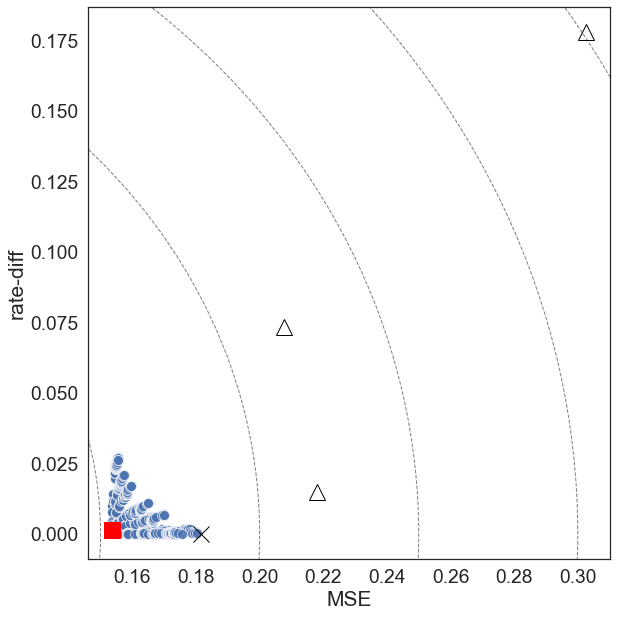

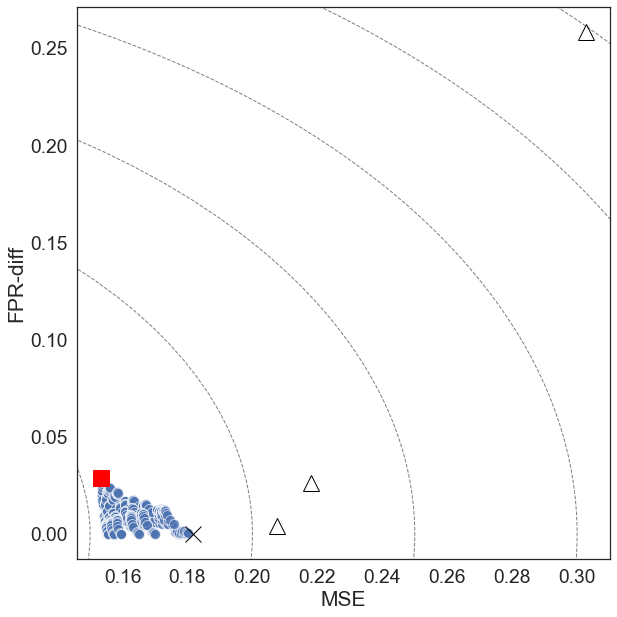

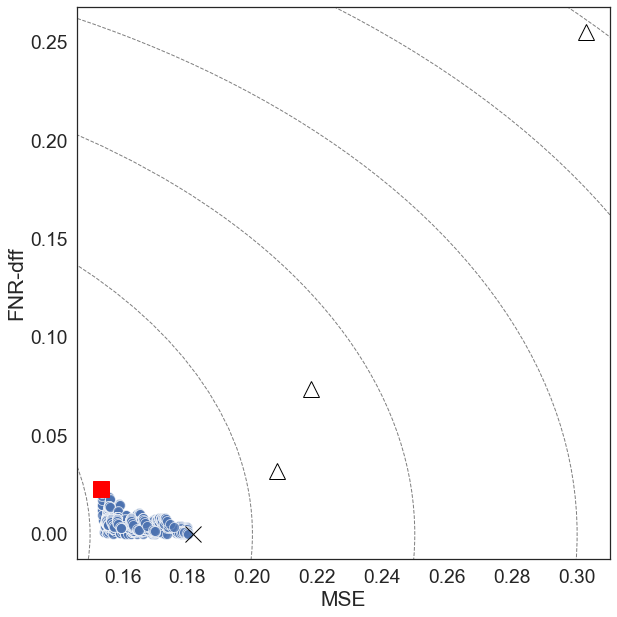

In [524]:
fig, ax = adult_binary4.plot_two_criteria('error_mse', 'rate_diff')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/adult/adult_binary4_MSE_rate-diff.pdf')

fig, ax = adult_binary4.plot_two_criteria('error_mse', 'cFPR_diff')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/adult/adult_binary4_MSE_cFPR-diff.pdf')

fig, ax = adult_binary4.plot_two_criteria('error_mse', 'cFNR_diff')
fig.set_tight_layout(True)
# fig.savefig('leastsquares/adult/adult_binary4_MSE_cFNR-diff.pdf')

In [579]:
perf = adult_binary4.results[('independence', 'cFPR', 'cFNR')]['performance']
min_rate = get_closest_to_origin(['error_threshold_5', 'rate_diff_binary_5'], perf)
min_FPR = get_closest_to_origin(['error_mse', 'cFPR_diff'], perf)
min_FNR = get_closest_to_origin(['error_mse', 'cFNR_diff'], perf)
min_rate_FPR = get_closest_to_origin(['error_mse', 'rate_diff', 'cFPR_diff'], perf)
min_rate_FNR = get_closest_to_origin(['error_mse', 'rate_diff', 'cFNR_diff'], perf)
min_FPR_FNR = get_closest_to_origin(['error_mse', 'cFPR_diff', 'cFNR_diff'], perf)
min_all = get_closest_to_origin(['error_mse', 'rate_diff', 'cFPR_diff', 'cFNR_diff'], perf)

idx = [min_rate, min_FPR, min_FNR, min_rate_FPR, min_rate_FNR, min_FPR_FNR, min_all]
tmp = adult_binary4.results[('independence', 'cFPR', 'cFNR')]['performance'].iloc[idx]#[['error_mse', 'error_bernoulli_01', 'rate_diff', 'cFPR_diff', 'cFNR_diff']]
tmp.index = ['MSE + rate-diff', 'MSE + FPR-diff', 'MSE + FNR-diff', 'MSE + rate-diff + FPR-diff',
            'MSE + rate-diff + FNR-diff', 'MSE + FPR-diff + FNR-diff', 'MSE + rate-diff + FPR-diff + FNR-diff']
# tmp.columns = ['MSE', 'error_bernoulli', 'rate-diff', 'FPR-diff', 'FNR-diff']

# with open('leastsquares/adult/adult_binary4_best_performance.tex', 'w') as file_out:
#     file_out.write(tmp.to_latex(index=True, float_format='%0.2f'))

In [581]:
min_rate = get_closest_to_origin(['error_bernoulli_01', 'rate_diff'], perf)

In [582]:
perf.iloc[min_rate]

learner_variance         0.0254826
error_mse                 0.153489
error_bernoulli_01        0.308827
error_auc                  0.70905
error_logistic            0.116839
rate_diff               0.00166698
cFPR_diff                0.0289259
cFNR_diff                0.0230742
error_threshold_1         0.761568
rate_diff_binary_1               0
cFPR_diff_binary_1     1.23661e-17
cFNR_diff_binary_1     2.41503e-16
error_threshold_2         0.302621
rate_diff_binary_2        0.178049
cFPR_diff_binary_2         0.25833
cFNR_diff_binary_2        0.255033
error_threshold_3         0.212224
rate_diff_binary_3       0.0542729
cFPR_diff_binary_3       0.0126123
cFNR_diff_binary_3       0.0110996
error_threshold_4         0.207617
rate_diff_binary_4       0.0733528
cFPR_diff_binary_4      0.00418597
cFNR_diff_binary_4       0.0319173
error_threshold_5         0.207617
rate_diff_binary_5       0.0733528
cFPR_diff_binary_5      0.00418597
cFNR_diff_binary_5       0.0319173
error_threshold_6   

In [555]:
tmp

,MSE,error_bernoulli,rate-diff,FPR-diff,FNR-diff
MSE + rate-diff,0.154704,0.317050,0.012120,0.013445,0.007302
MSE + FPR-diff,0.153885,0.310348,0.014193,0.015269,0.007108
MSE + FNR-diff,0.153885,0.310348,0.014193,0.015269,0.007108
MSE + rate-diff + FPR-diff,0.153794,0.310688,0.011724,0.017617,0.009853
MSE + rate-diff + FNR-diff,0.153657,0.309775,0.009859,0.020071,0.012374
MSE + FPR-diff + FNR-diff,0.154479,0.311109,0.021296,0.007705,0.002572
MSE + rate-diff + FPR-diff + FNR-diff,0.153885,0.310348,0.014193,0.015269,0.007108


(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_threshold_5', ylabel='cFNR_diff_binary_5'>)

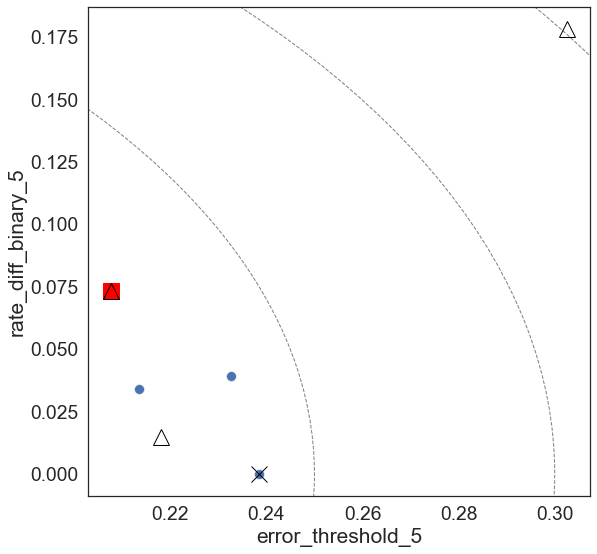

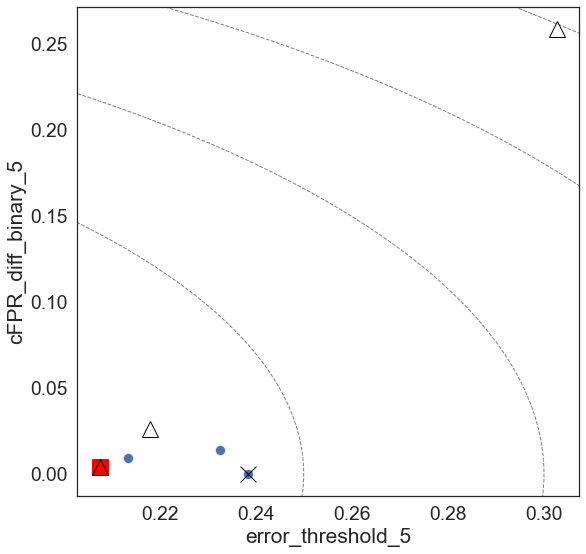

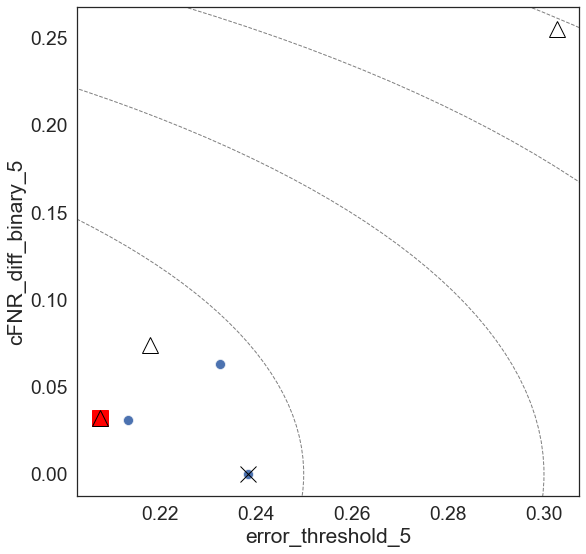

In [545]:
adult_binary4.plot_two_criteria('error_threshold_5', 'rate_diff_binary_5')
adult_binary4.plot_two_criteria('error_threshold_5', 'cFPR_diff_binary_5')
adult_binary4.plot_two_criteria('error_threshold_5', 'cFNR_diff_binary_5')

## Minimize Bernoulli 0-1 loss

In [579]:
adult_binary2 = FairPredictor(data_basis=data_adult_basis,
                              data_train_target=data_adult_train,
                              data_test_target=data_adult_test,
                              covariates=X, protected=A,
                              outcome=Y, predictors=None, outcome_bounds=(0, 1),
                              learners_basis=learners_basis)

### Smoothing $\lambda = 0.1$

In [586]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
adult_binary2.simulate_fairness(lambdas=lambdas, lambda_smooth=0.1, loss='0-1',
                                constraints='all', phihat_train=Y, phibarhat_train=Y,
                                phihat_test=Y, phibarhat_test=Y,
                                counterfactual=False, recompute=True)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [587]:
adult_binary2.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_threshold_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,rate_diff_binary,cFPR_diff_binary,cFNR_diff_binary
learner0,0.049131,0.138843,0.272918,0.195127,0.811066,0.193345,0.136181,0.241970,0.214286,0.107422,0.462236
learner1,0.046479,0.137809,0.274761,0.197277,0.814421,0.195215,0.138858,0.245910,0.221110,0.114583,0.468278
learner2,0.036519,0.140901,0.292847,0.195639,0.808476,0.170966,0.131137,0.164749,0.205035,0.101345,0.445619


In [588]:
adult_binary2.results[constraints]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_threshold_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,rate_diff_binary,cFPR_diff_binary,cFNR_diff_binary,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,1.414761e-01,0.299739,0.402430,0.364558,0.792946,0.352430,0.300546,0.244097,0.489755,0.435423,0.351054,0.0,0.000,0.0,
1,1.414620e-01,0.299616,0.402343,0.364558,0.792946,0.352373,0.300469,0.244094,0.489755,0.435423,0.351054,0.0,0.001,0.0,cFPR
2,1.413376e-01,0.298521,0.401565,0.364558,0.792946,0.351860,0.299775,0.244065,0.489755,0.435423,0.351054,0.0,0.010,0.0,cFPR
3,1.171616e-01,0.205719,0.336129,0.289414,0.811600,0.315072,0.244575,0.303797,0.402632,0.318687,0.376614,0.0,1.000,0.0,cFPR
4,1.038505e-02,0.163383,0.258900,0.238432,0.813843,0.091591,0.066466,0.106835,0.000000,0.000000,0.000000,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,3.219864e-07,0.237876,0.238720,0.238432,0.726131,0.000317,0.000296,0.000047,0.000000,0.000000,0.000000,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,3.134983e-07,0.237886,0.238714,0.238432,0.725426,0.000311,0.000289,0.000047,0.000000,0.000000,0.000000,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,2.641226e-07,0.237952,0.238675,0.238432,0.723549,0.000263,0.000241,0.000046,0.000000,0.000000,0.000000,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,2.294512e-07,0.238012,0.238642,0.238432,0.715440,0.000215,0.000193,0.000048,0.000000,0.000000,0.000000,2000.0,1000.000,2000.0,ind_cFPR_cFNR


(<Figure size 1080x360 with 3 Axes>,
 array([<AxesSubplot:xlabel='lambda_independence', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFPR', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFNR', ylabel='value'>], dtype=object))

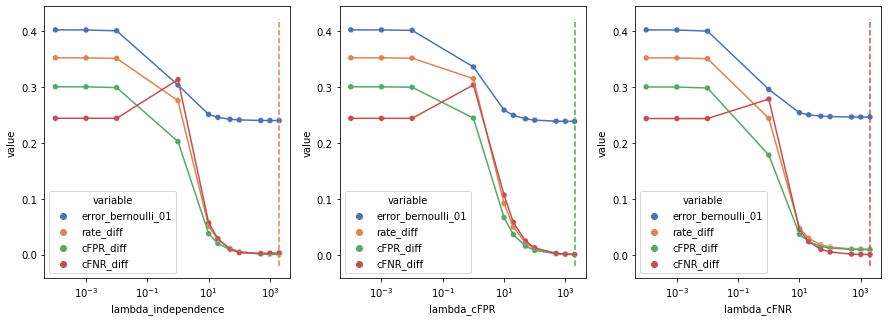

In [589]:
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
adult_binary2.plot_one_constraint(fairness, 'error_bernoulli_01')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_mse', ylabel='cFNR_diff'>)

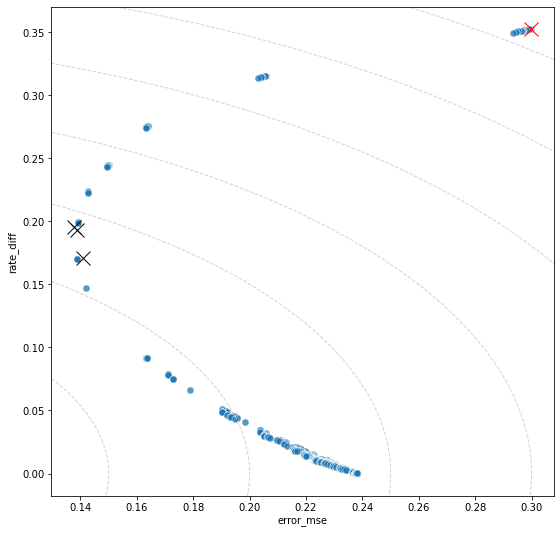

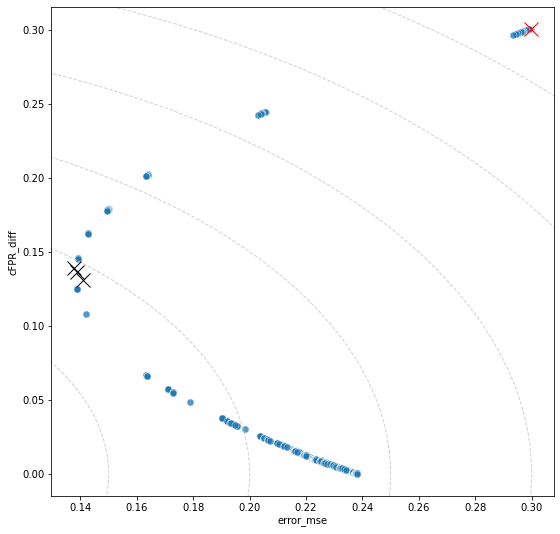

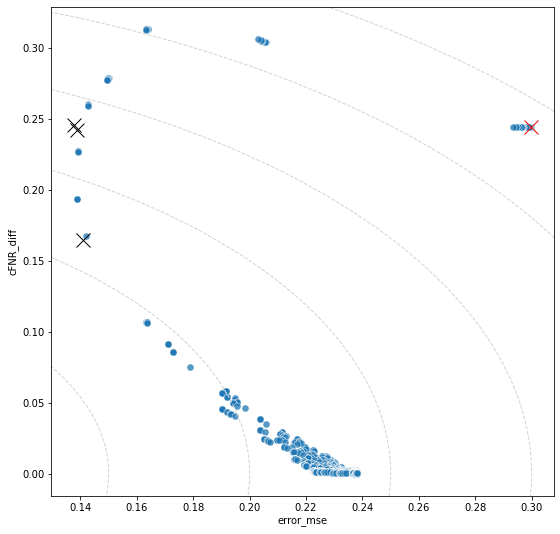

In [590]:
adult_binary2.plot_two_criteria('error_mse', 'rate_diff')
adult_binary2.plot_two_criteria('error_mse', 'cFPR_diff')
adult_binary2.plot_two_criteria('error_mse', 'cFNR_diff')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='cFPR_diff', ylabel='cFNR_diff'>)

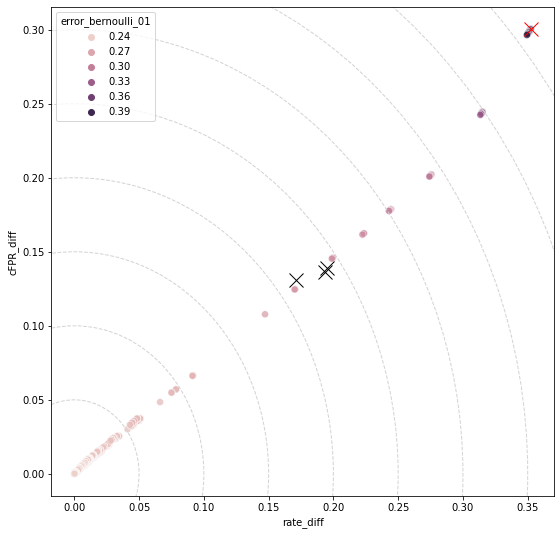

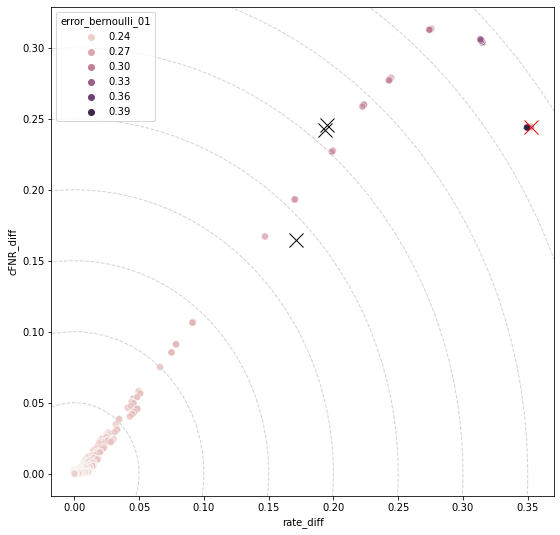

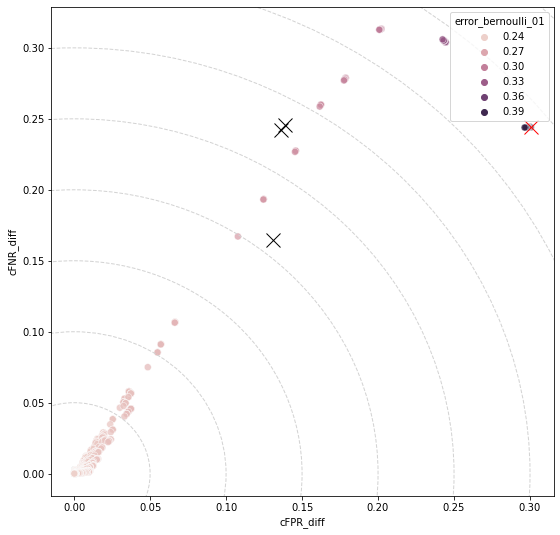

In [592]:
adult_binary2.plot_two_criteria(
    'rate_diff', 'cFPR_diff', hue='error_bernoulli_01')
adult_binary2.plot_two_criteria(
    'rate_diff', 'cFNR_diff', hue='error_bernoulli_01')
adult_binary2.plot_two_criteria(
    'cFPR_diff', 'cFNR_diff', hue='error_bernoulli_01')

### Smoothing $\lambda = 1$

In [580]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
adult_binary2.simulate_fairness(lambdas=lambdas, lambda_smooth=1, loss='0-1',
                                constraints='all', phihat_train=Y, phibarhat_train=Y,
                                phihat_test=Y, phibarhat_test=Y,
                                counterfactual=False, recompute=False)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...


<ipython-input-472-d83a345f7d32>:80: UserWarning: Basis learners have already been fit.                     Set recompute=True to recompute them.
  warnings.warn("Basis learners have already been fit. \



NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [581]:
adult_binary2.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_threshold_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,rate_diff_binary,cFPR_diff_binary,cFNR_diff_binary
learner0,0.048668,0.138851,0.273460,0.195536,0.811043,0.193963,0.137437,0.240797,0.215802,0.108941,0.463746
learner1,0.046479,0.137809,0.274761,0.197277,0.814421,0.195215,0.138858,0.245910,0.221110,0.114583,0.468278
learner2,0.036519,0.140901,0.292847,0.195639,0.808476,0.170966,0.131137,0.164749,0.205035,0.101345,0.445619


In [582]:
adult_binary2.results[constraints]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_threshold_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,rate_diff_binary,cFPR_diff_binary,cFNR_diff_binary,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,3.954598e-03,0.186204,0.251105,0.238432,0.813896,0.056727,0.041234,0.066108,0.0,0.0,0.0,0.0,0.000,0.0,
1,3.954184e-03,0.186206,0.251105,0.238432,0.813896,0.056724,0.041232,0.066105,0.0,0.0,0.0,0.0,0.001,0.0,cFPR
2,3.950468e-03,0.186226,0.251099,0.238432,0.813896,0.056697,0.041213,0.066074,0.0,0.0,0.0,0.0,0.010,0.0,cFPR
3,3.571612e-03,0.188349,0.250477,0.238432,0.813892,0.053910,0.039187,0.062823,0.0,0.0,0.0,0.0,1.000,0.0,cFPR
4,1.705943e-03,0.201986,0.246762,0.238432,0.813892,0.037257,0.027085,0.043403,0.0,0.0,0.0,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,1.570475e-07,0.238031,0.238640,0.238432,0.735059,0.000260,0.000242,0.000022,0.0,0.0,0.0,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,1.521524e-07,0.238037,0.238637,0.238432,0.735165,0.000256,0.000238,0.000022,0.0,0.0,0.0,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,1.200556e-07,0.238080,0.238614,0.238432,0.733397,0.000227,0.000211,0.000018,0.0,0.0,0.0,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,9.242201e-08,0.238123,0.238592,0.238432,0.733832,0.000199,0.000185,0.000015,0.0,0.0,0.0,2000.0,1000.000,2000.0,ind_cFPR_cFNR


(<Figure size 1080x360 with 3 Axes>,
 array([<AxesSubplot:xlabel='lambda_independence', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFPR', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFNR', ylabel='value'>], dtype=object))

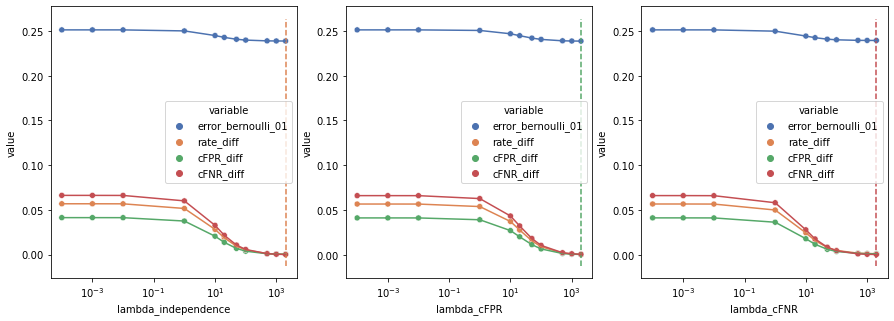

In [583]:
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
adult_binary2.plot_one_constraint(fairness, 'error_bernoulli_01')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_mse', ylabel='cFNR_diff'>)

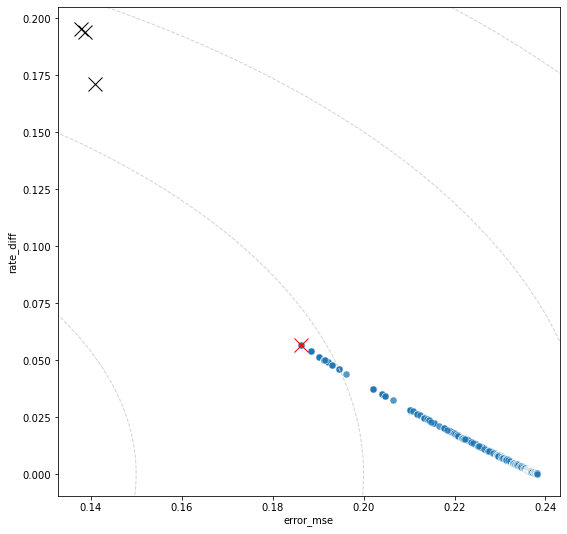

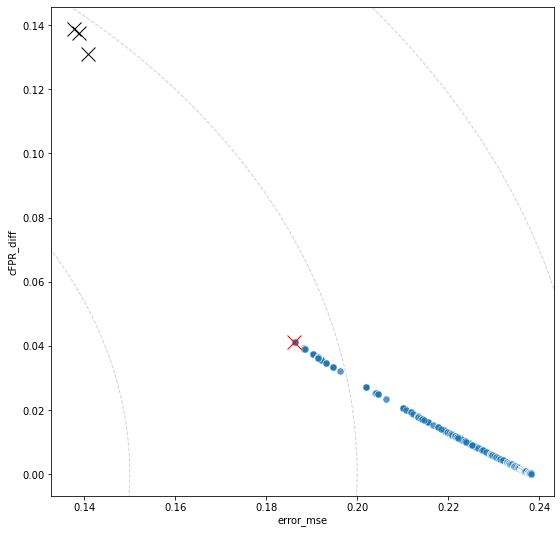

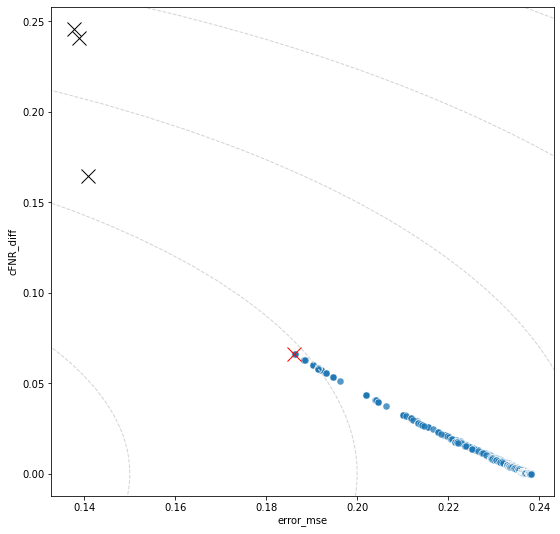

In [584]:
adult_binary2.plot_two_criteria('error_mse', 'rate_diff')
adult_binary2.plot_two_criteria('error_mse', 'cFPR_diff')
adult_binary2.plot_two_criteria('error_mse', 'cFNR_diff')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='cFPR_diff', ylabel='cFNR_diff'>)

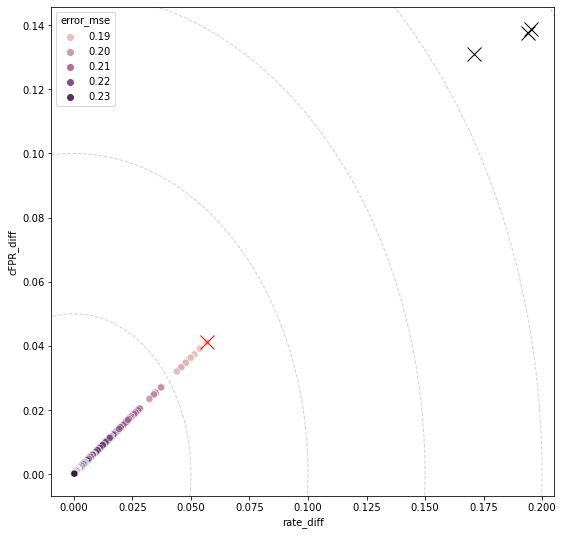

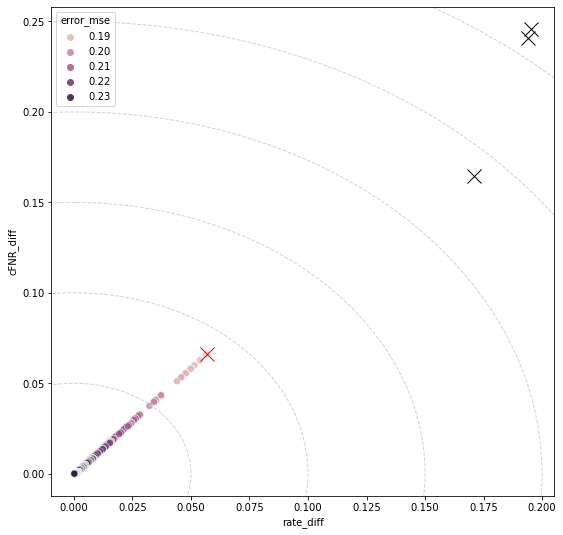

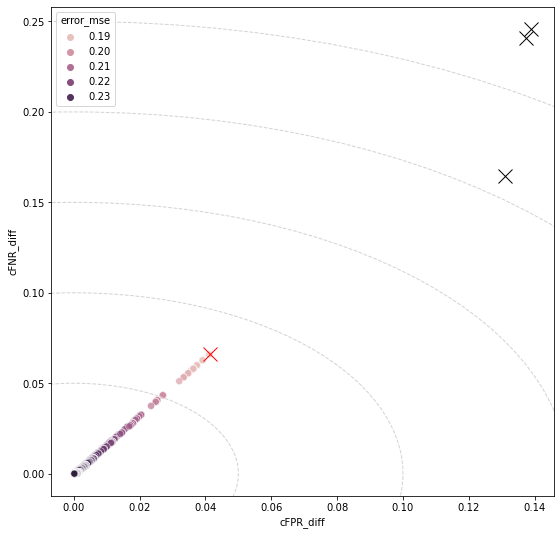

In [585]:
adult_binary2.plot_two_criteria('rate_diff', 'cFPR_diff', hue='error_mse')
adult_binary2.plot_two_criteria('rate_diff', 'cFNR_diff', hue='error_mse')
adult_binary2.plot_two_criteria('cFPR_diff', 'cFNR_diff', hue='error_mse')

# Adult data: race

In [677]:
A = 'race'
X_cols = [1] + list(range(3, data_adult_basis.shape[1] - 1))
X = data_adult_basis.columns[X_cols].to_list()
pred_cols = [A] + X
Y = 'Income Binary'

In [687]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.linear_model import ElasticNetCV, Lars, Perceptron, SGDClassifier

In [688]:
# Define learners
learners_basis = [
    RandomForestClassifier(
        n_estimators=200, min_samples_leaf=10, max_features='sqrt'),
    LogisticRegression(),
    GaussianNB(),
    Ridge(alpha=1),
    AdaBoostClassifier(),
    GradientBoostingClassifier(),
    ElasticNetCV(),
    Lars(),
    Perceptron(),
    SGDClassifier()
]

In [689]:
adult_race = FairPredictor(data_basis=data_adult_basis,
                           data_train_target=data_adult_train,
                           data_test_target=data_adult_test,
                           covariates=X, protected=A,
                           outcome=Y, predictors=None, outcome_bounds=(0, 1),
                           learners_basis=learners_basis)

In [767]:
lambdas = [0, 0.001, 0.01, 1, 10, 20, 50, 100, 500, 1000, 2000]
adult_race.simulate_fairness(lambdas=lambdas, loss='mse', constraints='all',
                             phihat_train=Y, phibarhat_train=Y,
                             phihat_test=Y, phibarhat_test=Y,
                             counterfactual=False, continuous=True, recompute=True)

BASIS LEARNERS
...fitting basis learners...
...generating predictions from basis learners...

NUISANCE LEARNERS
...fitting training set nuisance learners...
...generating training set predictions from nuisance learners...
...fitting test set nuisance learners...
...generating test set predictions from nuisance learners...

BASIS LEARNERS
...evaluating basis learners...

FAIRNESS CONSTRAINTS
...computing fairness constraint vectors...

BETAHATS
...computing betahat for ('independence', 'cFPR', 'cFNR')...
...computing risk and fairness properties of betahats...


In [768]:
adult_race.results['base_learners']

,learner_variance,error_mse,error_bernoulli_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,error_threshold_1,rate_diff_binary_1,cFPR_diff_binary_1,...,cFPR_diff_binary_7,cFNR_diff_binary_7,error_threshold_8,rate_diff_binary_8,cFPR_diff_binary_8,cFNR_diff_binary_8,error_threshold_9,rate_diff_binary_9,cFPR_diff_binary_9,cFNR_diff_binary_9
learner0,0.037769,0.144678,0.289741,0.792249,0.094027,0.069112,0.110420,0.486691,0.158663,1.317163e-01,...,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000
learner1,0.039043,0.144538,0.288394,0.792678,0.096431,0.069163,0.122176,0.474099,0.120259,9.617182e-02,...,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000
learner2,0.189279,0.424130,0.459794,0.777404,0.204101,0.179432,0.154097,0.583333,0.263624,2.783140e-01,...,0.232123,0.204090,0.434787,0.271571,0.243527,0.226728,0.391790,0.346467,0.308192,0.337611
learner3,0.033727,0.146854,0.298973,0.784992,0.081316,0.060357,0.087082,0.515868,0.065141,3.665622e-02,...,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000
learner4,0.000074,0.242919,0.492773,0.792849,0.003582,0.002795,0.003504,0.761568,0.000000,3.331578e-16,...,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000
learner5,0.038970,0.144800,0.288536,0.791979,0.091028,0.067070,0.101208,0.473280,0.248452,2.337357e-01,...,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000
learner6,0.033629,0.146872,0.299007,0.784482,0.080945,0.060031,0.086646,0.515868,0.065141,3.665622e-02,...,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000
learner7,0.033745,0.146853,0.298962,0.784992,0.081328,0.060362,0.087095,0.515868,0.065141,3.665622e-02,...,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000,0.238432,0.000000,0.000000,0.000000
learner8,0.067140,0.238534,0.238534,0.551990,0.008827,0.000467,0.000058,0.238534,0.008827,4.674000e-04,...,0.000467,0.000058,0.238534,0.008827,0.000467,0.000058,0.238534,0.008827,0.000467,0.000058
learner9,0.156490,0.212735,0.212735,0.675254,0.035930,0.005442,0.002517,0.212735,0.035930,5.441554e-03,...,0.005442,0.002517,0.212735,0.035930,0.005442,0.002517,0.212735,0.035930,0.005442,0.002517


In [769]:
adult_race.results[constraints]['performance']

,learner_variance,error_mse,error_bernoulli_01,error_auc,rate_diff,cFPR_diff,cFNR_diff,error_threshold_1,rate_diff_binary_1,cFPR_diff_binary_1,...,cFPR_diff_binary_8,cFNR_diff_binary_8,error_threshold_9,rate_diff_binary_9,cFPR_diff_binary_9,cFNR_diff_binary_9,lambda_independence,lambda_cFPR,lambda_cFNR,active_penalties
0,0.035211,0.144570,0.291583,0.793095,0.101629,0.074404,0.132829,0.479832,0.152604,1.245669e-01,...,0.0,0.0,0.238432,0.0,0.0,0.0,0.0,0.000,0.0,
1,0.035200,0.144569,0.291592,0.793095,0.101550,0.074334,0.132718,0.479832,0.152604,1.245669e-01,...,0.0,0.0,0.238432,0.0,0.0,0.0,0.0,0.001,0.0,cFPR
2,0.035094,0.144566,0.291677,0.793090,0.100848,0.073718,0.131723,0.479832,0.152604,1.245669e-01,...,0.0,0.0,0.238432,0.0,0.0,0.0,0.0,0.010,0.0,cFPR
3,0.029948,0.145903,0.297609,0.787706,0.058895,0.037042,0.072359,0.490070,0.048651,1.486119e-02,...,0.0,0.0,0.238432,0.0,0.0,0.0,0.0,1.000,0.0,cFPR
4,0.027107,0.149885,0.304648,0.771365,0.018854,0.002447,0.014630,0.626126,0.087806,1.215520e-01,...,0.0,0.0,0.238432,0.0,0.0,0.0,0.0,10.000,0.0,cFPR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,0.009702,0.159241,0.330449,0.745013,0.004808,0.014085,0.005967,0.721130,0.013033,2.074806e-02,...,0.0,0.0,0.238432,0.0,0.0,0.0,2000.0,50.000,2000.0,ind_cFPR_cFNR
1327,0.005393,0.163007,0.338623,0.747053,0.003375,0.010257,0.004506,0.738739,0.019930,2.673498e-02,...,0.0,0.0,0.238432,0.0,0.0,0.0,2000.0,100.000,2000.0,ind_cFPR_cFNR
1328,0.000810,0.172929,0.353311,0.750989,0.000796,0.003377,0.001882,0.761568,0.000000,3.331578e-16,...,0.0,0.0,0.238432,0.0,0.0,0.0,2000.0,500.000,2000.0,ind_cFPR_cFNR
1329,0.000365,0.175513,0.356376,0.756456,0.000259,0.001941,0.001335,0.761568,0.000000,3.331578e-16,...,0.0,0.0,0.238432,0.0,0.0,0.0,2000.0,1000.000,2000.0,ind_cFPR_cFNR


(<Figure size 1080x360 with 3 Axes>,
 array([<AxesSubplot:xlabel='lambda_independence', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFPR', ylabel='value'>,
        <AxesSubplot:xlabel='lambda_cFNR', ylabel='value'>], dtype=object))

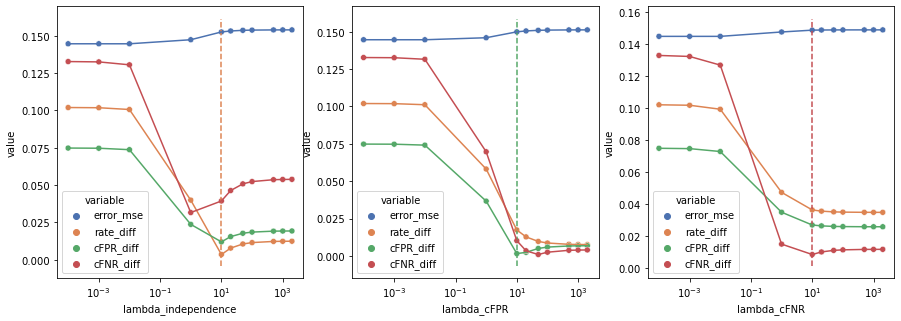

In [692]:
fairness = ['rate_diff', 'cFPR_diff', 'cFNR_diff']
adult_race.plot_one_constraint(fairness, 'error_mse')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_mse', ylabel='cFNR_diff'>)

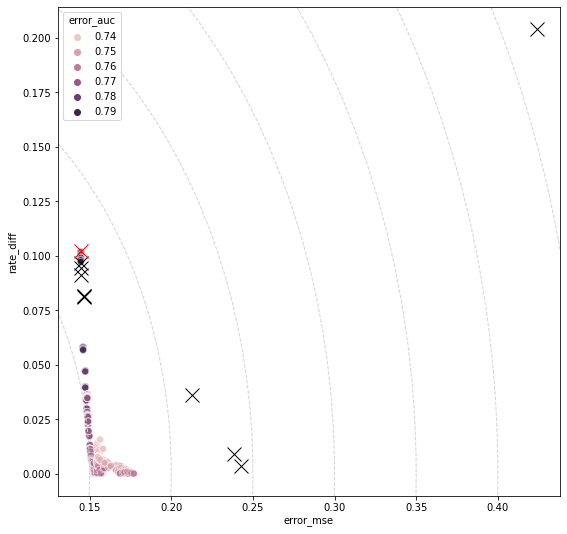

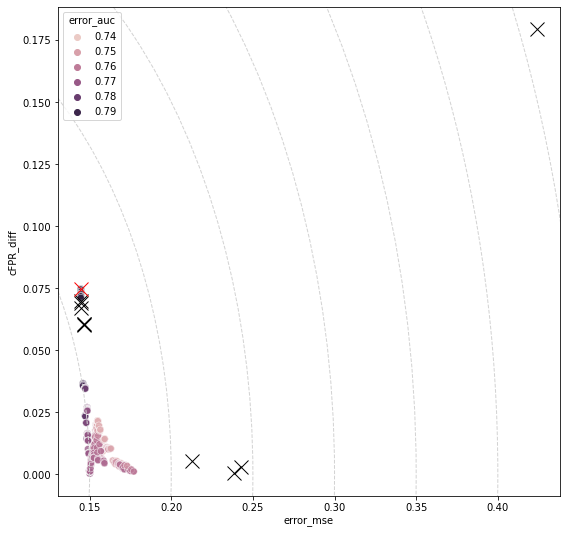

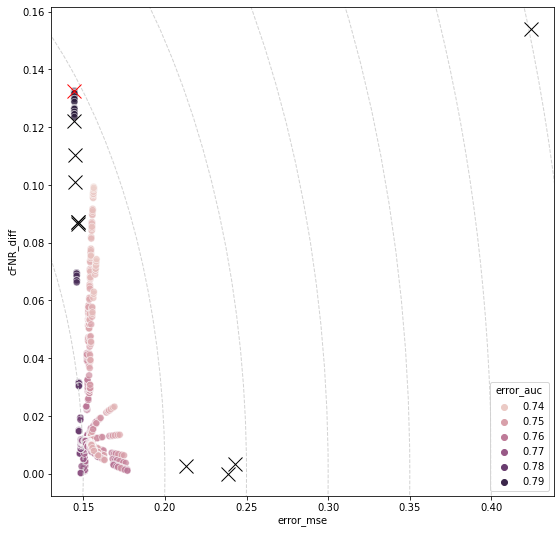

In [695]:
adult_race.plot_two_criteria('error_mse', 'rate_diff', hue='error_auc')
adult_race.plot_two_criteria('error_mse', 'cFPR_diff', hue='error_auc')
adult_race.plot_two_criteria('error_mse', 'cFNR_diff', hue='error_auc')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_bernoulli_01', ylabel='cFNR_diff'>)

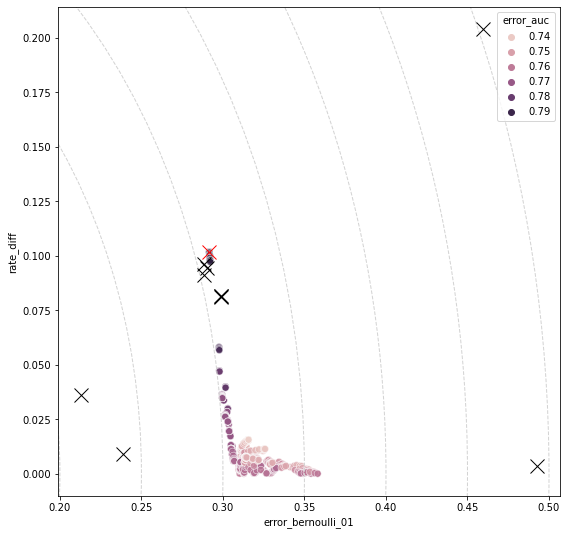

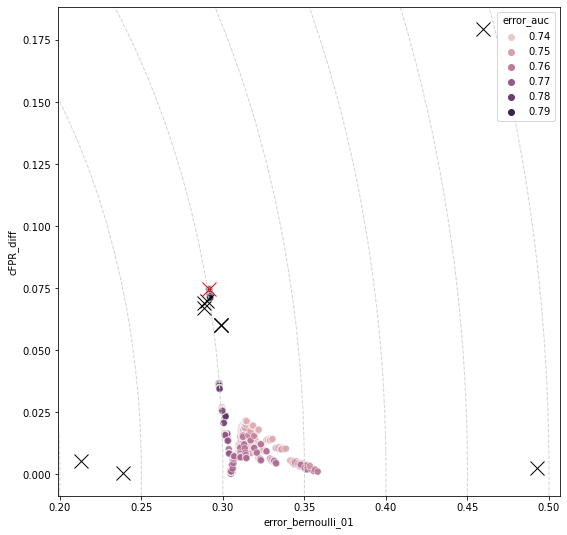

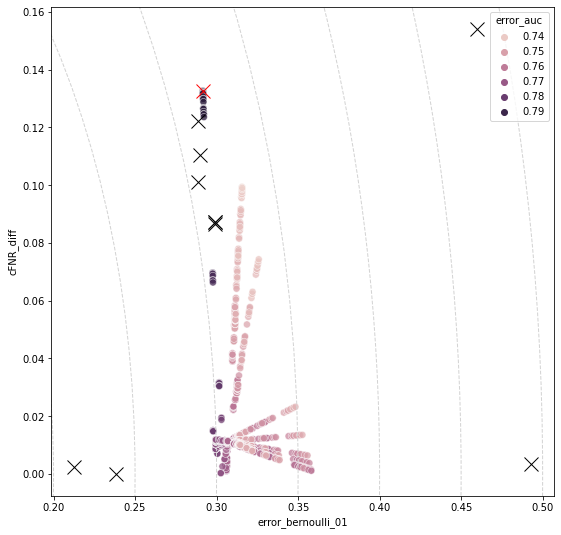

In [742]:
adult_race.plot_two_criteria(
    'error_bernoulli_01', 'rate_diff', hue='error_auc')
adult_race.plot_two_criteria(
    'error_bernoulli_01', 'cFPR_diff', hue='error_auc')
adult_race.plot_two_criteria(
    'error_bernoulli_01', 'cFNR_diff', hue='error_auc')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_threshold_1', ylabel='cFNR_diff_binary_1'>)

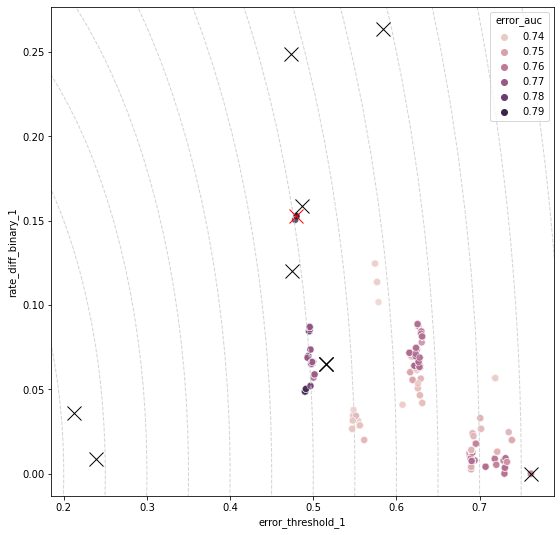

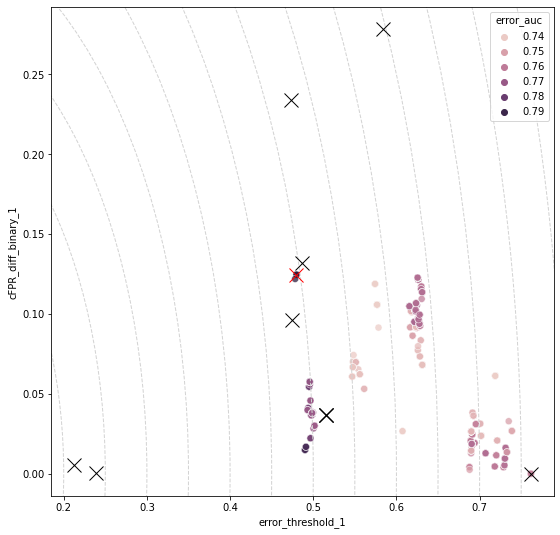

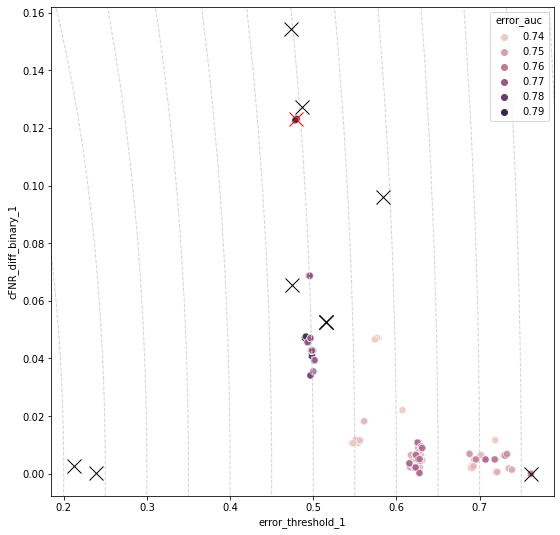

In [770]:
adult_race.plot_two_criteria(
    'error_threshold_1', 'rate_diff_binary_1', hue='error_auc')
adult_race.plot_two_criteria(
    'error_threshold_1', 'cFPR_diff_binary_1', hue='error_auc')
adult_race.plot_two_criteria(
    'error_threshold_1', 'cFNR_diff_binary_1', hue='error_auc')

(<Figure size 648x648 with 1 Axes>,
 <AxesSubplot:xlabel='error_threshold_9', ylabel='rate_diff_binary_9'>)

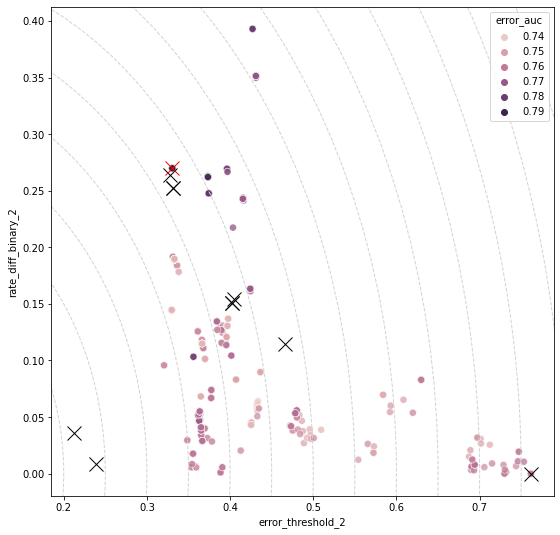

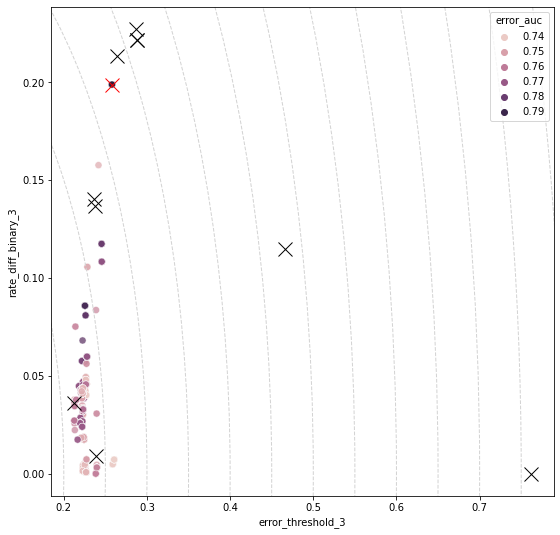

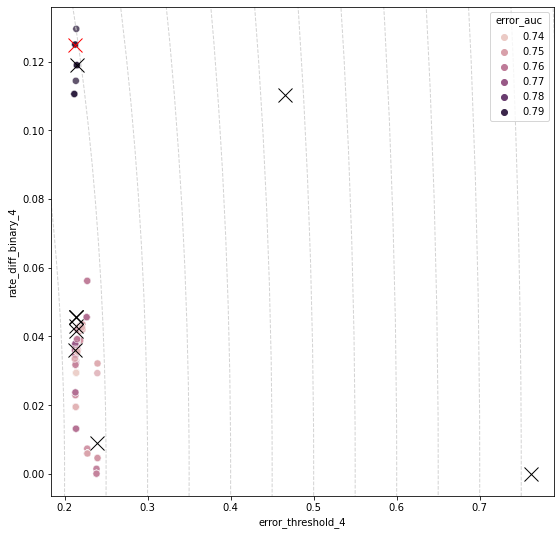

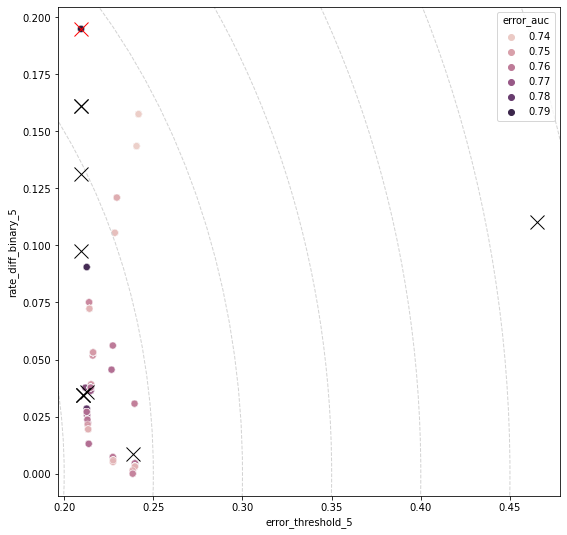

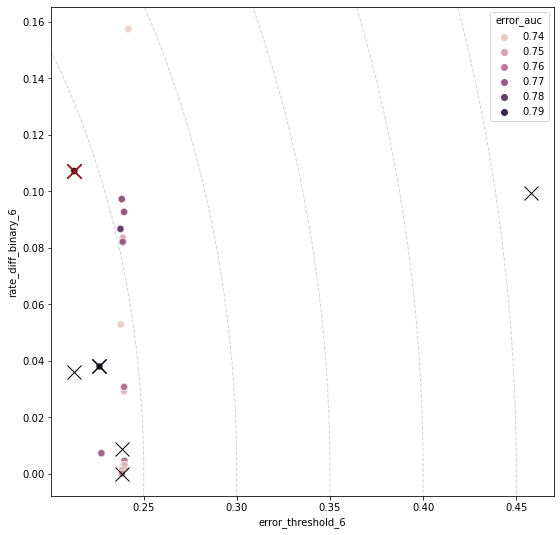

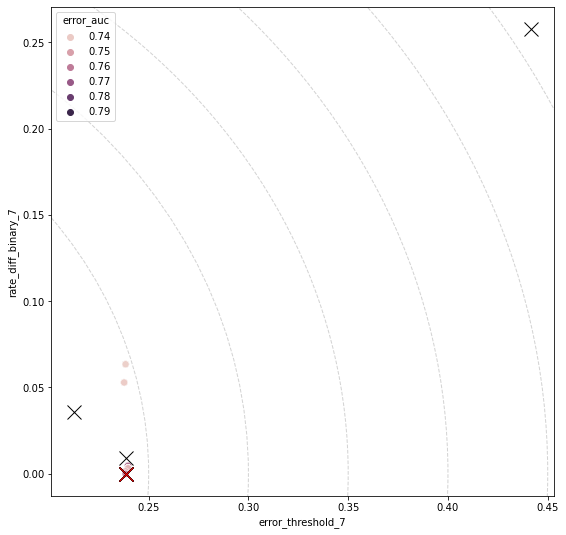

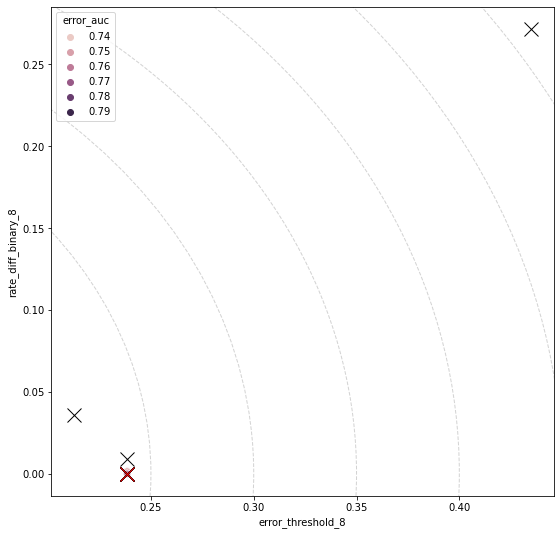

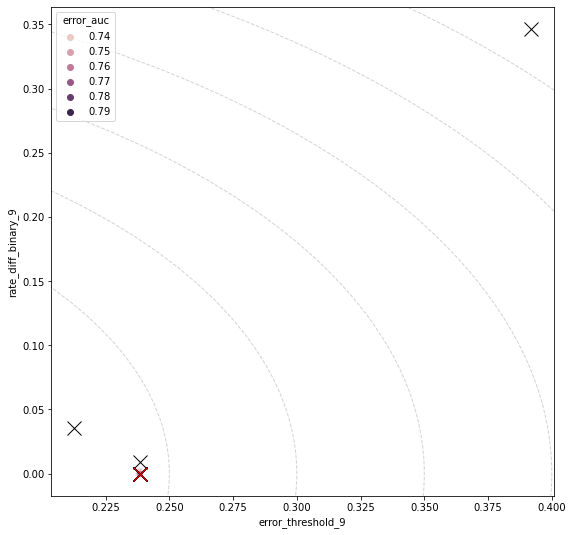

In [772]:
adult_race.plot_two_criteria(
    'error_threshold_2', 'rate_diff_binary_2', hue='error_auc')
adult_race.plot_two_criteria(
    'error_threshold_3', 'rate_diff_binary_3', hue='error_auc')
adult_race.plot_two_criteria(
    'error_threshold_4', 'rate_diff_binary_4', hue='error_auc')
adult_race.plot_two_criteria(
    'error_threshold_5', 'rate_diff_binary_5', hue='error_auc')
adult_race.plot_two_criteria(
    'error_threshold_6', 'rate_diff_binary_6', hue='error_auc')
adult_race.plot_two_criteria(
    'error_threshold_7', 'rate_diff_binary_7', hue='error_auc')
adult_race.plot_two_criteria(
    'error_threshold_8', 'rate_diff_binary_8', hue='error_auc')
adult_race.plot_two_criteria(
    'error_threshold_9', 'rate_diff_binary_9', hue='error_auc')

In [698]:
# Investigate the point with the lowest rate_diff
perf = adult_race.results[constraints]['performance']
idx = np.argmin(perf.rate_diff)

In [701]:
beta = adult_race.results[constraints]['betahats'][idx]

In [712]:
preds = np.matmul(adult_race.basis_preds_test, beta)
preds = np.clip(preds, 0, 1)

In [774]:
tmp = pd.DataFrame({'preds': preds, 'race': adult_race.data_test_target.race})

<AxesSubplot:ylabel='Probability'>

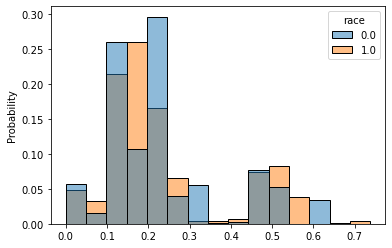

In [786]:
sns.histplot(data=tmp, x=preds, hue='race', bins=15,
             stat='probability', common_norm=False)

<AxesSubplot:>

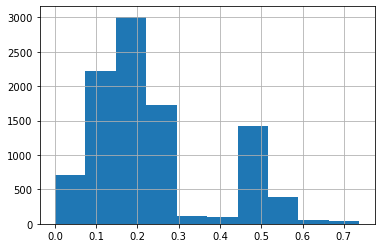

In [773]:
pd.Series(preds).hist()

<AxesSubplot:>

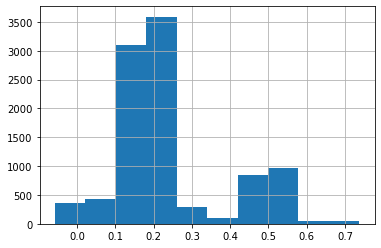

In [706]:
pd.Series(preds).hist()

In [722]:
true_prob, pred_prob = calibration_curve(
    adult_race.data_test_target[Y], preds, n_bins=11)

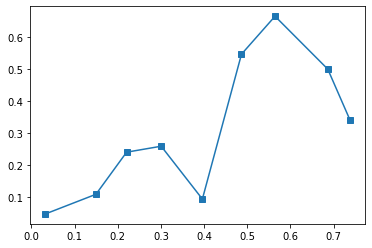

In [723]:
plt.plot(pred_prob, true_prob, "s-")

In [724]:
def plot_calibration(true, preds):
    true_prob, pred_prob = calibration_curve(true, preds, n_bins=11)
    plt.plot(pred_prob, true_prob, "s-")

In [737]:
adult_race.basis_preds_test[:, 8]

array([0., 0., 0., ..., 0., 0., 1.])

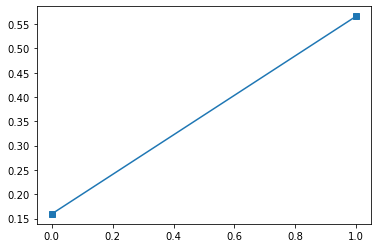

In [738]:
plot_calibration(
    adult_race.data_test_target[Y], adult_race.basis_preds_test[:, 9])

<AxesSubplot:>

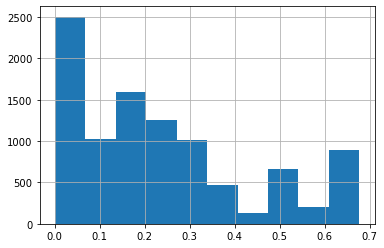

In [739]:
pd.Series(adult_race.basis_preds_test[:, 0]).hist()

In [741]:
perf.loc[idx]

learner_variance            0.021696
error_mse                   0.152964
error_bernoulli_01          0.312825
error_threshold_01          0.213043
error_auc                   0.761125
rate_diff                   0.000008
cFPR_diff                   0.012188
cFNR_diff                   0.013042
rate_diff_binary             0.02366
cFPR_diff_binary             0.00669
cFNR_diff_binary             0.01073
lambda_independence             20.0
lambda_cFPR                     10.0
lambda_cFNR                     10.0
active_penalties       ind_cFPR_cFNR
Name: 543, dtype: object